# CenterResnet Starter


I am very new to these concepts so I am trying out by changing this amazing and probably only 3D model related awesome public kernel by Ruslan
https://www.kaggle.com/hocop1/centernet-baseline

Most of the codes are loaned from there . There are other codes that I took from OFT implementation github . But I dont know what is OFT , so I have not yet implemented it . 

My current score is not from this kernel( as there are some errors in this kernel) , but from some simple architecture modification of the original public kernel. 


In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import cv2
from tqdm import tqdm_notebook as tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from functools import reduce
import os
from sklearn.model_selection import train_test_split
from scipy.optimize import minimize
from tqdm.auto import tqdm as tq
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.utils.data import Dataset, DataLoader
from torchvision import models
from torchvision import transforms, utils

PATH = '../input/pku-autonomous-driving/'
os.listdir(PATH)

['car_models_json',
 'test_masks.zip',
 'test_images',
 'test_images.zip',
 'sample_submission.csv',
 'car_models',
 'train.csv',
 'camera.zip',
 'test_masks',
 'train_masks',
 'car_models_json.zip',
 'train_masks.zip',
 'train_images',
 'camera',
 'train_images.zip',
 'car_models.zip']

In [3]:
## Constants
SWITCH_LOSS_EPOCH = 5

# Load data

In [4]:
train = pd.read_csv(PATH + 'train.csv')
test = pd.read_csv(PATH + 'sample_submission.csv')

# From camera.zip
camera_matrix = np.array([[2304.5479, 0,  1686.2379],
                          [0, 2305.8757, 1354.9849],
                          [0, 0, 1]], dtype=np.float32)
camera_matrix_inv = np.linalg.inv(camera_matrix)

train.head()

,ImageId,PredictionString
0,ID_8a6e65317,16 0.254839 -2.57534 -3.10256 7.96539 3.20066 ...
1,ID_337ddc495,66 0.163988 0.192169 -3.12112 -3.17424 6.55331...
2,ID_a381bf4d0,43 0.162877 0.00519276 -3.02676 2.1876 3.53427...
3,ID_7c4a3e0aa,43 0.126957 -3.04442 -3.10883 -14.738 24.6389 ...
4,ID_8b510fad6,37 0.16017 0.00862796 -3.0887 -3.04548 3.4977 ...


**ImageId** column contains names of images:

In [5]:
def imread(path, fast_mode=False):
    img = cv2.imread(path)
    if not fast_mode and img is not None and len(img.shape) == 3:
        img = np.array(img[:, :, ::-1])
    return img

img = imread(PATH + 'train_images/ID_8a6e65317' + '.jpg')
IMG_SHAPE = img.shape

#plt.figure(figsize=(15,8))
#plt.imshow(img);

In [6]:
def str2coords(s, names=['id', 'yaw', 'pitch', 'roll', 'x', 'y', 'z']):
    '''
    Input:
        s: PredictionString (e.g. from train dataframe)
        names: array of what to extract from the string
    Output:
        list of dicts with keys from `names`
    '''
    coords = []
    for l in np.array(s.split()).reshape([-1, 7]):
        coords.append(dict(zip(names, l.astype('float'))))
        if 'id' in coords[-1]:
            coords[-1]['id'] = int(coords[-1]['id'])
    return coords

In [7]:
inp = train['PredictionString'][0]
print('Example input:\n', inp)
print()
print('Output:\n', str2coords(inp))

Example input:
 16 0.254839 -2.57534 -3.10256 7.96539 3.20066 11.0225 56 0.181647 -1.46947 -3.12159 9.60332 4.66632 19.339 70 0.163072 -1.56865 -3.11754 10.39 11.2219 59.7825 70 0.141942 -3.1395 3.11969 -9.59236 5.13662 24.7337 46 0.163068 -2.08578 -3.11754 9.83335 13.2689 72.9323

Output:
 [{'id': 16, 'yaw': 0.254839, 'pitch': -2.57534, 'roll': -3.10256, 'x': 7.96539, 'y': 3.20066, 'z': 11.0225}, {'id': 56, 'yaw': 0.181647, 'pitch': -1.46947, 'roll': -3.12159, 'x': 9.60332, 'y': 4.66632, 'z': 19.339}, {'id': 70, 'yaw': 0.163072, 'pitch': -1.56865, 'roll': -3.11754, 'x': 10.39, 'y': 11.2219, 'z': 59.7825}, {'id': 70, 'yaw': 0.141942, 'pitch': -3.1395, 'roll': 3.11969, 'x': -9.59236, 'y': 5.13662, 'z': 24.7337}, {'id': 46, 'yaw': 0.163068, 'pitch': -2.08578, 'roll': -3.11754, 'x': 9.83335, 'y': 13.2689, 'z': 72.9323}]


# Data distributions

In [8]:
lens = [len(str2coords(s)) for s in train['PredictionString']]

#plt.figure(figsize=(15,6))
#sns.countplot(lens);
#plt.xlabel('Number of cars in image');

In [9]:
# plt.figure(figsize=(15,6))
# sns.distplot(reduce(lambda a, b: a + b, [[c['x'] for c in str2coords(s)] for s in train['PredictionString']]), bins=500);
# # sns.distplot([str2coords(s)[0]['x'] for s in train['PredictionString']]);
# plt.xlabel('x')
# plt.show()

In [10]:
# plt.figure(figsize=(15,6))
# sns.distplot(reduce(lambda a, b: a + b, [[c['y'] for c in str2coords(s)] for s in train['PredictionString']]), bins=500);
# plt.xlabel('y')
# plt.show()

In [11]:
# plt.figure(figsize=(15,6))
# sns.distplot(reduce(lambda a, b: a + b, [[c['z'] for c in str2coords(s)] for s in train['PredictionString']]), bins=500);
# plt.xlabel('z')
# plt.show()

In [12]:
# plt.figure(figsize=(15,6))
# sns.distplot(reduce(lambda a, b: a + b, [[c['yaw'] for c in str2coords(s)] for s in train['PredictionString']]));
# plt.xlabel('yaw')
# plt.show()

In [15]:
# plt.figure(figsize=(15,6))
# sns.distplot(reduce(lambda a, b: a + b, [[c['pitch'] for c in str2coords(s)] for s in train['PredictionString']]));
# plt.xlabel('pitch')
# plt.show()

I guess, pitch and yaw are mixed up in this dataset. Pitch cannot be that big. That would mean that cars are upside down.

In [16]:
def rotate(x, angle):
    x = x + angle
    x = x - (x + np.pi) // (2 * np.pi) * 2 * np.pi
    return x

# plt.figure(figsize=(15,6))
# sns.distplot(reduce(lambda a, b: a + b, [[rotate(c['roll'], np.pi) for c in str2coords(s)] for s in train['PredictionString']]));
# plt.xlabel('roll rotated by pi')
# plt.show()

# 2D Visualization

In [17]:
def get_img_coords(s):
    '''
    Input is a PredictionString (e.g. from train dataframe)
    Output is two arrays:
        xs: x coordinates in the image
        ys: y coordinates in the image
    '''
    coords = str2coords(s)
    xs = [c['x'] for c in coords]
    ys = [c['y'] for c in coords]
    zs = [c['z'] for c in coords]
    P = np.array(list(zip(xs, ys, zs))).T
    img_p = np.dot(camera_matrix, P).T
    img_p[:, 0] /= img_p[:, 2]
    img_p[:, 1] /= img_p[:, 2]
    img_xs = img_p[:, 0]
    img_ys = img_p[:, 1]
    img_zs = img_p[:, 2] # z = Distance from the camera
    return img_xs, img_ys

#plt.figure(figsize=(14,14))
#plt.imshow(imread(PATH + 'train_images/' + train['ImageId'][2217] + '.jpg'))
#plt.scatter(*get_img_coords(train['PredictionString'][2217]), color='red', s=100);

One point is out of image!

Let's look at the distribution of all points. Image is here just for reference.

In [18]:
# xs, ys = [], []

# for ps in train['PredictionString']:
#     x, y = get_img_coords(ps)
#     xs += list(x)
#     ys += list(y)

# plt.figure(figsize=(18,18))
# plt.imshow(imread(PATH + 'train_images/' + train['ImageId'][2217] + '.jpg'), alpha=0.3)
# plt.scatter(xs, ys, color='red', s=10, alpha=0.2);

Many points are outside!

Let's look at this distribution "from the sky"

In [19]:
# # Cars points
# xs, ys = [], []
# for ps in train['PredictionString']:
#     coords = str2coords(ps)
#     xs += [c['x'] for c in coords]
#     ys += [c['y'] for c in coords]

# # Road points
# road_width = 6
# road_xs = [-road_width, road_width, road_width, -road_width, -road_width]
# road_ys = [0, 0, 500, 500, 0]

# plt.figure(figsize=(16,16))
# plt.axes().set_aspect(1)
# # View road
# plt.fill(road_xs, road_ys, alpha=0.2, color='gray')
# plt.plot([road_width/2,road_width/2], [0,500], alpha=0.4, linewidth=4, color='white', ls='--')
# plt.plot([-road_width/2,-road_width/2], [0,500], alpha=0.4, linewidth=4, color='white', ls='--')
# # View cars
# plt.scatter(xs, ys, color='red', s=20, alpha=0.2);

Some points are very far away

Scale up

In [20]:
# plt.figure(figsize=(16,16))
# plt.axes().set_aspect(1)
# plt.xlim(-50,50)
# plt.ylim(0,50)

# # View road
# plt.fill(road_xs, road_ys, alpha=0.2, color='gray')
# plt.plot([road_width/2,road_width/2], [0,100], alpha=0.4, linewidth=4, color='white', ls='--')
# plt.plot([-road_width/2,-road_width/2], [0,100], alpha=0.4, linewidth=4, color='white', ls='--')
# # View cars
# plt.scatter(xs, ys, color='red', s=10, alpha=0.1);

# 3D Visualization
Used code from https://www.kaggle.com/zstusnoopy/visualize-the-location-and-3d-bounding-box-of-car, but made it one function

In [21]:
from math import sin, cos

# convert euler angle to rotation matrix
def euler_to_Rot(yaw, pitch, roll):
    Y = np.array([[cos(yaw), 0, sin(yaw)],
                  [0, 1, 0],
                  [-sin(yaw), 0, cos(yaw)]])
    P = np.array([[1, 0, 0],
                  [0, cos(pitch), -sin(pitch)],
                  [0, sin(pitch), cos(pitch)]])
    R = np.array([[cos(roll), -sin(roll), 0],
                  [sin(roll), cos(roll), 0],
                  [0, 0, 1]])
    return np.dot(Y, np.dot(P, R))

In [22]:
def draw_line(image, points):
    color = (255, 0, 0)
    cv2.line(image, tuple(points[0][:2]), tuple(points[3][:2]), color, 16)
    cv2.line(image, tuple(points[0][:2]), tuple(points[1][:2]), color, 16)
    cv2.line(image, tuple(points[1][:2]), tuple(points[2][:2]), color, 16)
    cv2.line(image, tuple(points[2][:2]), tuple(points[3][:2]), color, 16)
    return image


def draw_points(image, points):
    for (p_x, p_y, p_z) in points:
        cv2.circle(image, (p_x, p_y), int(1000 / p_z), (0, 255, 0), -1)
#         if p_x > image.shape[1] or p_y > image.shape[0]:
#             print('Point', p_x, p_y, 'is out of image with shape', image.shape)
    return image

In [23]:
def visualize(img, coords):
    # You will also need functions from the previous cells
    x_l = 1.02
    y_l = 0.80
    z_l = 2.31
    
    img = img.copy()
    for point in coords:
        # Get values
        x, y, z = point['x'], point['y'], point['z']
        yaw, pitch, roll = -point['pitch'], -point['yaw'], -point['roll']
        # Math
        Rt = np.eye(4)
        t = np.array([x, y, z])
        Rt[:3, 3] = t
        Rt[:3, :3] = euler_to_Rot(yaw, pitch, roll).T
        Rt = Rt[:3, :]
        P = np.array([[x_l, -y_l, -z_l, 1],
                      [x_l, -y_l, z_l, 1],
                      [-x_l, -y_l, z_l, 1],
                      [-x_l, -y_l, -z_l, 1],
                      [0, 0, 0, 1]]).T
        img_cor_points = np.dot(camera_matrix, np.dot(Rt, P))
        img_cor_points = img_cor_points.T
        img_cor_points[:, 0] /= img_cor_points[:, 2]
        img_cor_points[:, 1] /= img_cor_points[:, 2]
        img_cor_points = img_cor_points.astype(int)
        # Drawing
        img = draw_line(img, img_cor_points)
        img = draw_points(img, img_cor_points[-1:])
    
    return img

In [24]:
# n_rows = 6

# for idx in range(n_rows):
#     fig, axes = plt.subplots(1, 2, figsize=(20,20))
#     img = imread(PATH + 'train_images/' + train['ImageId'].iloc[idx] + '.jpg')
#     axes[0].imshow(img)
#     img_vis = visualize(img, str2coords(train['PredictionString'].iloc[idx]))
#     axes[1].imshow(img_vis)
#     plt.show()

# Image preprocessing

In [25]:
IMG_WIDTH = 2048
IMG_HEIGHT = IMG_WIDTH // 4
MODEL_SCALE = 8

def _regr_preprocess(regr_dict):
    for name in ['x', 'y', 'z']:
        regr_dict[name] = regr_dict[name] / 100
    regr_dict['roll'] = rotate(regr_dict['roll'], np.pi)
    regr_dict['pitch_sin'] = sin(regr_dict['pitch'])
    regr_dict['pitch_cos'] = cos(regr_dict['pitch'])
    regr_dict.pop('pitch')
    regr_dict.pop('id')
    return regr_dict

def _regr_back(regr_dict):
    for name in ['x', 'y', 'z']:
        regr_dict[name] = regr_dict[name] * 100
    regr_dict['roll'] = rotate(regr_dict['roll'], -np.pi)
    
    pitch_sin = regr_dict['pitch_sin'] / np.sqrt(regr_dict['pitch_sin']**2 + regr_dict['pitch_cos']**2)
    pitch_cos = regr_dict['pitch_cos'] / np.sqrt(regr_dict['pitch_sin']**2 + regr_dict['pitch_cos']**2)
    regr_dict['pitch'] = np.arccos(pitch_cos) * np.sign(pitch_sin)
    return regr_dict

def preprocess_image(img):
    img = img[img.shape[0] //2 :]
    bg = np.ones_like(img) * img.mean(1, keepdims=True).astype(img.dtype)
    bg = bg[:, :img.shape[1] // 4]
    img = np.concatenate([bg, img, bg], 1)
    img = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT))
    return (img / 255).astype('float32')

def get_mask_and_regr(img, labels):
    mask = np.zeros([IMG_HEIGHT // MODEL_SCALE, IMG_WIDTH // MODEL_SCALE], dtype='float32')
    regr_names = ['x', 'y', 'z', 'yaw', 'pitch', 'roll']
    regr = np.zeros([IMG_HEIGHT // MODEL_SCALE, IMG_WIDTH // MODEL_SCALE, 7], dtype='float32')
    coords = str2coords(labels)
    xs, ys = get_img_coords(labels)
    for x, y, regr_dict in zip(xs, ys, coords):
        x, y = y, x
        x = (x - img.shape[0] // 2) * IMG_HEIGHT / (img.shape[0] // 2) / MODEL_SCALE
        x = np.round(x).astype('int')
        y = (y + img.shape[1] // 4) * IMG_WIDTH / (img.shape[1] * 1.5) / MODEL_SCALE
        y = np.round(y).astype('int')
        if x >= 0 and x < IMG_HEIGHT // MODEL_SCALE and y >= 0 and y < IMG_WIDTH // MODEL_SCALE:
            mask[x, y] = 1
            regr_dict = _regr_preprocess(regr_dict)
            regr[x, y] = [regr_dict[n] for n in sorted(regr_dict)]
    return mask, regr

img.shape (512, 2048, 3) std: 0.28713036
mask.shape (64, 256) std: 0.017466618
regr.shape (64, 256, 7) std: 0.007385718


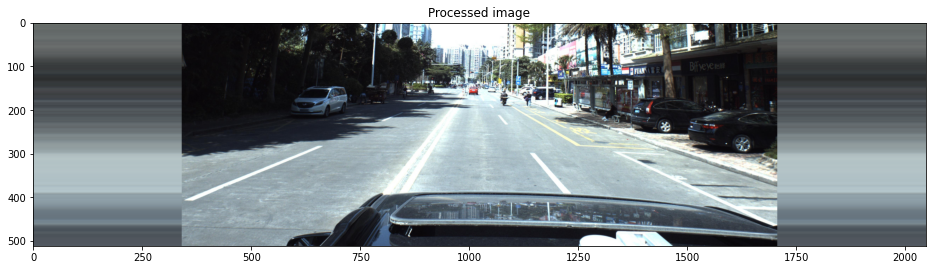

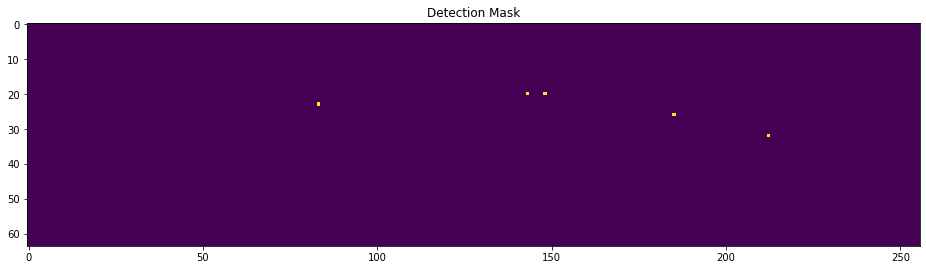

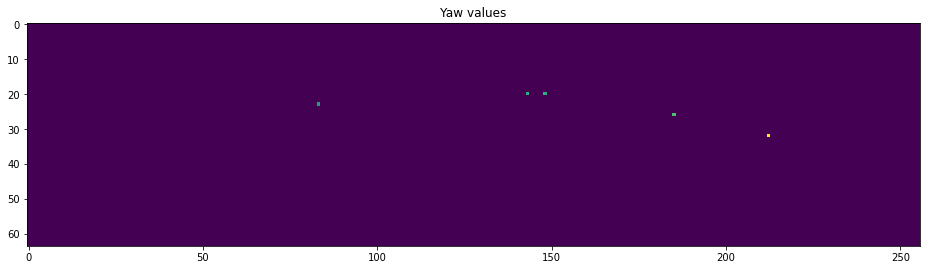

In [26]:
img0 = imread(PATH + 'train_images/' + train['ImageId'][0] + '.jpg')
img = preprocess_image(img0)

mask, regr = get_mask_and_regr(img0, train['PredictionString'][0])

print('img.shape', img.shape, 'std:', np.std(img))
print('mask.shape', mask.shape, 'std:', np.std(mask))
print('regr.shape', regr.shape, 'std:', np.std(regr))

plt.figure(figsize=(16,16))
plt.title('Processed image')
plt.imshow(img)
plt.show()

plt.figure(figsize=(16,16))
plt.title('Detection Mask')
plt.imshow(mask)
plt.show()
plt.figure(figsize=(16,16))
plt.title('Yaw values')
plt.imshow(regr[:,:,-2])
plt.show()

# PyTorch Dataset

In [27]:
class CarDataset(Dataset):
    """Car dataset."""

    def __init__(self, dataframe, root_dir, training=True, transform=None):
        self.df = dataframe
        self.root_dir = root_dir
        self.transform = transform
        self.training = training

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()
        
        # Get image name
        idx, labels = self.df.values[idx]
        img_name = self.root_dir.format(idx)
        
        # Read image
        img0 = imread(img_name, True)
        img = preprocess_image(img0)
        img = np.rollaxis(img, 2, 0)
        
        # Get mask and regression maps
        if self.training:
            mask, regr = get_mask_and_regr(img0, labels)
            regr = np.rollaxis(regr, 2, 0)
        else:
            mask, regr = 0, 0
        
        return [img, mask, regr]

In [28]:
train_images_dir = PATH + 'train_images/{}.jpg'
test_images_dir = PATH + 'test_images/{}.jpg'

df_train, df_dev = train_test_split(train, test_size=0.01, random_state=42)
df_test = test

# Create dataset objects
train_dataset = CarDataset(df_train, train_images_dir)
dev_dataset = CarDataset(df_dev, train_images_dir)
test_dataset = CarDataset(df_test, test_images_dir)

Show some generated examples

In [29]:
# img, mask, regr = train_dataset[0]

# plt.figure(figsize=(16,16))
# plt.imshow(np.rollaxis(img, 0, 3))
# plt.show()

# plt.figure(figsize=(16,16))
# plt.imshow(mask)
# plt.show()

# plt.figure(figsize=(16,16))
# plt.imshow(regr[-2])
# plt.show()

In [30]:
BATCH_SIZE = 8

# Create data generators - they will produce batches
train_loader = DataLoader(dataset=train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)
dev_loader = DataLoader(dataset=dev_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)
test_loader = DataLoader(dataset=test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

# PyTorch Model

In [28]:
class double_conv(nn.Module):
    '''(conv => BN => ReLU) * 2'''
    def __init__(self, in_ch, out_ch):
        super(double_conv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        x = self.conv(x)
        return x

class up(nn.Module):
    def __init__(self, in_ch, out_ch, bilinear=True):
        super(up, self).__init__()

        #  would be a nice idea if the upsampling could be learned too,
        #  but my machine do not have enough memory to handle all those weights
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        else:
            self.up = nn.ConvTranspose2d(in_ch//2, in_ch//2, 2, stride=2)

        self.conv = double_conv(in_ch, out_ch)

    def forward(self, x1, x2=None):
        x1 = self.up(x1)
        
        # input is CHW
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]

        x1 = F.pad(x1, (diffX // 2, diffX - diffX//2,
                        diffY // 2, diffY - diffY//2))
        
        # for padding issues, see 
        # https://github.com/HaiyongJiang/U-Net-Pytorch-Unstructured-Buggy/commit/0e854509c2cea854e247a9c615f175f76fbb2e3a
        # https://github.com/xiaopeng-liao/Pytorch-UNet/commit/8ebac70e633bac59fc22bb5195e513d5832fb3bd
        
        if x2 is not None:
            x = torch.cat([x2, x1], dim=1)
        else:
            x = x1
        x = self.conv(x)
        return x

def get_mesh(batch_size, shape_x, shape_y):
    mg_x, mg_y = np.meshgrid(np.linspace(0, 1, shape_y), np.linspace(0, 1, shape_x))
    mg_x = np.tile(mg_x[None, None, :, :], [batch_size, 1, 1, 1]).astype('float32')
    mg_y = np.tile(mg_y[None, None, :, :], [batch_size, 1, 1, 1]).astype('float32')
    mesh = torch.cat([torch.tensor(mg_x).to(device), torch.tensor(mg_y).to(device)], 1)
    return mesh

In [29]:
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.model_zoo as model_zoo


model_urls = {
    'resnet18': 'https://download.pytorch.org/models/resnet18-5c106cde.pth',
    'resnet34': 'https://download.pytorch.org/models/resnet34-333f7ec4.pth',
    'resnet50': 'https://download.pytorch.org/models/resnet50-19c8e357.pth',
    'resnet101': 'https://download.pytorch.org/models/resnet101-5d3b4d8f.pth',
    'resnet152': 'https://download.pytorch.org/models/resnet152-b121ed2d.pth',
}


def conv3x3(in_planes, out_planes, stride=1):
    """3x3 convolution with padding"""
    return nn.Conv2d(in_planes, out_planes, kernel_size=3, stride=stride,
                     padding=1, bias=False)


def conv1x1(in_planes, out_planes, stride=1):
    """1x1 convolution"""
    return nn.Conv2d(in_planes, out_planes, kernel_size=1, stride=stride, bias=False)


class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, inplanes, planes, stride=1):
        super(BasicBlock, self).__init__()

        self.conv1 = conv3x3(inplanes, planes, stride)
        self.bn1 = nn.GroupNorm(16, planes)

        self.conv2 = conv3x3(planes, planes)
        self.bn2 = nn.GroupNorm(16, planes)

        if stride != 1 or inplanes != planes:
            self.downsample = nn.Sequential(
                conv1x1(inplanes, planes, stride), nn.GroupNorm(16, planes))
        else:
            self.downsample = None


    def forward(self, x):
        identity = x

        out = F.relu(self.bn1(self.conv1(x)), inplace=True)
        out = self.bn2(self.conv2(out))

        if self.downsample is not None:
            identity = self.downsample(x)

        out += identity
        out = F.relu(out, inplace=True)

        return out


class Bottleneck(nn.Module):
    expansion = 4

    def __init__(self, inplanes, planes, stride=1):
        super(Bottleneck, self).__init__()
        self.conv1 = conv1x1(inplanes, planes)
        self.bn1 = nn.GroupNorm(16, planes)
        self.conv2 = conv3x3(planes, planes, stride)
        self.bn2 = nn.GroupNorm(16, planes)
        self.conv3 = conv1x1(planes, planes * self.expansion)
        self.bn3 = nn.GroupNorm(16, planes * self.expansion)

        if stride != 1 or inplanes != planes * self.expansion:
            self.downsample = nn.Sequential(
                conv1x1(inplanes, planes * self.expansion, stride), 
                nn.GroupNorm(16, planes * self.expansion))
        else:
            self.downsample = None

    def forward(self, x):
        identity = x

        out = F.relu(self.bn1(self.conv1(x)), inplace=True)
        out = F.relu(self.bn2(self.conv2(out)), inplace=True)
        out = self.bn3(self.conv3(out))
 
        if self.downsample is not None:
            identity = self.downsample(x)

        out += identity
        out = F.relu(out)

        return out


class ResNetFeatures(nn.Module):

    def __init__(self, block, layers, num_classes=1000, zero_init_residual=False):
        super(ResNetFeatures, self).__init__()
        self.inplanes = 64
        self.conv1 = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3,
                               bias=False)
        self.bn1 = nn.GroupNorm(16, 64)

        self.layer1 = self._make_layer(block, 64, layers[0])
        self.layer2 = self._make_layer(block, 128, layers[1], stride=2)
        self.layer3 = self._make_layer(block, 256, layers[2], stride=2)
        self.layer4 = self._make_layer(block, 512, layers[3], stride=2)


        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)

        # Zero-initialize the last BN in each residual branch,
        # so that the residual branch starts with zeros, and each residual block behaves like an identity.
        # This improves the model by 0.2~0.3% according to https://arxiv.org/abs/1706.02677
        if zero_init_residual:
            for m in self.modules():
                if isinstance(m, Bottleneck):
                    nn.init.constant_(m.bn3.weight, 0)
                elif isinstance(m, BasicBlock):
                    nn.init.constant_(m.bn2.weight, 0)

    def _make_layer(self, block, planes, blocks, stride=1):

        layers = []
        layers.append(block(self.inplanes, planes, stride))
        self.inplanes = planes * block.expansion
        for _ in range(1, blocks):
            layers.append(block(self.inplanes, planes))

        return nn.Sequential(*layers)


    def forward(self, x):
        conv1 = F.relu(self.bn1(self.conv1(x)), inplace=True)
        conv1 = F.max_pool2d(conv1, 3, stride=2, padding=1)

        feats4 = self.layer1(conv1)
        feats8 = self.layer2(feats4)
        feats16 = self.layer3(feats8)
        feats32 = self.layer4(feats16)

        return feats8, feats16, feats32



def resnet18(pretrained=False, **kwargs):
    """Constructs a ResNet-18 model.
    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
    """
    model = ResNetFeatures(BasicBlock, [2, 2, 2, 2], **kwargs)
    if pretrained:
        _load_pretrained(model, model_zoo.load_url(model_urls['resnet18']))
    return model



def resnet34(pretrained=False, **kwargs):
    """Constructs a ResNet-34 model.
    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
    """
    model = ResNetFeatures(BasicBlock, [3, 4, 6, 3], **kwargs)
    if pretrained:
        _load_pretrained(model, model_zoo.load_url(model_urls['resnet34']))
    return model


def _load_pretrained(model, pretrained):
    model_dict = model.state_dict()
    pretrained = {k : v for k, v in pretrained.items() if k in model_dict}
    model_dict.update(pretrained)
    model.load_state_dict(model_dict)

In [30]:
class CentResnet(nn.Module):
    '''Mixture of previous classes'''
    def __init__(self, n_classes):
        super(CentResnet, self).__init__()
        self.base_model = resnet18(pretrained=False)
        
        # Lateral layers convert resnet outputs to a common feature size
        self.lat8 = nn.Conv2d(128, 256, 1)
        self.lat16 = nn.Conv2d(256, 256, 1)
        self.lat32 = nn.Conv2d(512, 256, 1)
        self.bn8 = nn.GroupNorm(16, 256)
        self.bn16 = nn.GroupNorm(16, 256)
        self.bn32 = nn.GroupNorm(16, 256)

       
        self.conv0 = double_conv(5, 64)
        self.conv1 = double_conv(64, 128)
        self.conv2 = double_conv(128, 512)
        self.conv3 = double_conv(512, 1024)
        
        self.mp = nn.MaxPool2d(2)
        
        self.up1 = up(1282 , 512) #+ 1024
        self.up2 = up(512 + 512, 256)
        self.outc = nn.Conv2d(256, n_classes, 1)
        
    
    def forward(self, x):
        batch_size = x.shape[0]
        mesh1 = get_mesh(batch_size, x.shape[2], x.shape[3])
        x0 = torch.cat([x, mesh1], 1)
        x1 = self.mp(self.conv0(x0))
        x2 = self.mp(self.conv1(x1))
        x3 = self.mp(self.conv2(x2))
        x4 = self.mp(self.conv3(x3))
        
        #feats = self.base_model.extract_features(x)
                # Run frontend network
        feats8, feats16, feats32 = self.base_model(x)
        lat8 = F.relu(self.bn8(self.lat8(feats8)))
        lat16 = F.relu(self.bn16(self.lat16(feats16)))
        lat32 = F.relu(self.bn32(self.lat32(feats32)))
        
        # Add positional info
        mesh2 = get_mesh(batch_size, lat32.shape[2], lat32.shape[3])
        feats = torch.cat([lat32, mesh2], 1)
        #print(feats.shape)
        #print (x4.shape)
        x = self.up1(feats, x4)
        x = self.up2(x, x3)
        x = self.outc(x)
        return x

In [31]:
from dlav0 import get_pose_net as get_dlav0

In [32]:
_model_factory = {
  #'res': get_pose_net, # default Resnet with deconv
  'dlav0': get_dlav0, # default DLAup
  #'dla': get_dla_dcn,
  #'resdcn': get_pose_net_dcn,
  #'hourglass': get_large_hourglass_net,
}

In [33]:
def create_model(arch, heads, head_conv):
    num_layers = int(arch[arch.find('_') + 1:]) if '_' in arch else 0
    arch = arch[:arch.find('_')] if '_' in arch else arch
    arch = 'dlav0'
    get_model = _model_factory[arch]
    model = get_model(num_layers=num_layers, heads=heads, head_conv=head_conv)
    return model

In [34]:
model = create_model('dla_34', {'hm': 8} , 256)#{'hm': 3, 'dep': 1, 'rot': 8, 'dim': 3, 'wh': 2, 'reg': 2},256)

In [35]:
# Gets the GPU if there is one, otherwise the cpu
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

n_epochs = 12 #6

#model = CentResnet(8).to(device)
model.cuda()
optimizer = optim.AdamW(model.parameters(), lr=0.001)
#optimizer =  RAdam(model.parameters(), lr = 0.001)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=max(n_epochs, 10) * len(train_loader) // 3, gamma=0.1)

cuda


In [36]:
img_batch = torch.randn((1,3,512,2048))

In [37]:
#test = model(img_batch.to(device))

In [38]:
# model.load_state_dict(torch.load('./modelGaussian.pth'))
# model.eval();

In [39]:
def gaussian_radius(det_size, min_overlap=0.7):
    height, width = det_size

    a1  = 1
    b1  = (height + width)
    c1  = width * height * (1 - min_overlap) / (1 + min_overlap)
    sq1 = np.sqrt(b1 ** 2 - 4 * a1 * c1)
    r1  = (b1 + sq1) / 2

    a2  = 4
    b2  = 2 * (height + width)
    c2  = (1 - min_overlap) * width * height
    sq2 = np.sqrt(b2 ** 2 - 4 * a2 * c2)
    r2  = (b2 + sq2) / 2

    a3  = 4 * min_overlap
    b3  = -2 * min_overlap * (height + width)
    c3  = (min_overlap - 1) * width * height
    sq3 = np.sqrt(b3 ** 2 - 4 * a3 * c3)
    r3  = (b3 + sq3) / 2
    return min(r1, r2, r3)
def gaussian2D(shape, sigma=1):
    m, n = [(ss - 1.) / 2. for ss in shape]
    y, x = np.ogrid[-m:m+1,-n:n+1]

    h = np.exp(-(x * x + y * y) / (2 * sigma * sigma))
    h[h < np.finfo(h.dtype).eps * h.max()] = 0
    return h
def draw_msra_gaussian(heatmap, center, sigma):
    tmp_size = sigma * 3
    mu_x = int(center[0] + 0.5)
    mu_y = int(center[1] + 0.5)
    w, h = heatmap.shape[0], heatmap.shape[1]
    ul = [int(mu_x - tmp_size), int(mu_y - tmp_size)]
    br = [int(mu_x + tmp_size + 1), int(mu_y + tmp_size + 1)]
    if ul[0] >= h or ul[1] >= w or br[0] < 0 or br[1] < 0:
        return heatmap
    size = 2 * tmp_size + 1
    x = np.arange(0, size, 1, np.float32)
    y = x[:, np.newaxis]
    
    x0 = y0 = size // 2
    g = np.exp(- ((x - x0) ** 2 + (y - y0) ** 2) / (2 * sigma ** 2))
    g_x = max(0, -ul[0]), min(br[0], h) - ul[0]
    g_y = max(0, -ul[1]), min(br[1], w) - ul[1]
    img_x = max(0, ul[0]), min(br[0], h)
    img_y = max(0, ul[1]), min(br[1], w)
    
    
    heatmap[img_y[0]:img_y[1], img_x[0]:img_x[1]] = np.maximum(
        heatmap[img_y[0]:img_y[1], img_x[0]:img_x[1]],
        g[g_y[0]:g_y[1], g_x[0]:g_x[1]])
    return heatmap


def gaussian_mask(mask):
    xlist, ylist = np.where(mask == 1)
    masklist = [(i,j) for i, j in zip(xlist, ylist)]
    hm = np.zeros(mask.shape) 

    for (y,x) in masklist:
        bbox = np.array([x-0.1, y-0.1, x+0.1, y+0.1])
        h, w = bbox[3] - bbox[1], bbox[2] - bbox[0]
        radius = gaussian_radius((h, w))    
        ct = np.array([(bbox[0] + bbox[2]) / 2, (bbox[1] + bbox[3]) / 2], dtype=np.float32)
        ct_int = ct.astype(np.int32)
        hm[int(bbox[1]): int(bbox[3]), int(bbox[0]): int(bbox[2])] = 0.9999    
        gm =+ draw_msra_gaussian(hm, ct, 0.7) # np.exp((y-5)/200)

    #plt.figure(figsize=(16,16))
    #plt.imshow(gm, vmin=0, vmax=1)
    #plt.show()
    
    return gm

from tqdm import tqdm
def apply_gaussian(dataset):
    for i in tqdm(range(len(dataset))):
        dataset[i][1] = gaussian_mask(dataset[i][1])    
    return dataset

In [40]:
#train_dataset = apply_gaussian(train_dataset)

# Training

In [41]:
def criterion(prediction, mask, regr,weight=0.4, size_average=True):
    # Binary mask loss
    #print(prediction.shape)
    #print(prediction[0]['hm'].shape)
    prediction = prediction[0]['hm']
    pred_mask = torch.sigmoid(prediction[:, 0])
#     mask_loss = mask * (1 - pred_mask)**2 * torch.log(pred_mask + 1e-12) + (1 - mask) * pred_mask**2 * torch.log(1 - pred_mask + 1e-12)
    
    mask_loss = mask * torch.log(pred_mask + 1e-12) + (1 - mask) * torch.log(1 - pred_mask + 1e-12)
    mask_loss = -mask_loss.mean(0).sum()
    
    # Regression L1 loss
    pred_regr = prediction[:, 1:]
    #regr_loss = (torch.abs(pred_regr - regr).sum(1) * mask).sum(1).sum(1) / mask.sum(1).sum(1)
    regr_loss = (torch.min(torch.abs(pred_regr - regr), torch.abs((pred_regr - regr)**2)).sum(1) * mask).sum(1).sum(1) / mask.sum(1).sum(1)
    # smooth l1 - torch.min(torch.abs(pred_regr - regr), torch.abs((pred_regr - regr)**2))
    regr_loss = regr_loss.mean(0)
  
    # Sum
    loss = weight*mask_loss +(1-weight)* regr_loss
    if not size_average:
        loss *= prediction.shape[0]
    return loss ,mask_loss , regr_loss

In [42]:
def train(epoch, history=None):
    model.train()
    t = tqdm(train_loader)
    for batch_idx, (img_batch, mask_batch, regr_batch) in enumerate(t):
        img_batch = img_batch.to(device)
        mask_batch = mask_batch.to(device)
        regr_batch = regr_batch.to(device)
        
        optimizer.zero_grad()
        output = model(img_batch)
        
        
        if epoch < SWITCH_LOSS_EPOCH :
            loss, mask_loss, regr_loss = criterion(output, mask_batch, regr_batch,1)
        else:
            loss,mask_loss, regr_loss = criterion(output, mask_batch, regr_batch,0.5)  
        
        t.set_description(f'train_loss (l={loss:.3f})(m={mask_loss:.2f}) (r={regr_loss:.4f}')
        
        if history is not None:
            history.loc[epoch + batch_idx / len(train_loader), 'train_loss'] = loss.data.cpu().numpy()
        
        loss.backward()
        
        optimizer.step()
        exp_lr_scheduler.step()

    
    print('Train Epoch: {} \tLR: {:.6f}\tLoss: {:.6f}\tMaskLoss: {:.6f}\tRegLoss: {:.6f}'.format(
        epoch,
        optimizer.state_dict()['param_groups'][0]['lr'],
        loss.data,
        mask_loss.data,
        regr_loss.data))

def evaluate(epoch, history=None):
    model.eval()
    loss = 0
    valid_loss = 0
    valid_mask_loss = 0
    valid_regr_loss = 0
    with torch.no_grad():
        for img_batch, mask_batch, regr_batch in dev_loader:
            img_batch = img_batch.to(device)
            mask_batch = mask_batch.to(device)
            regr_batch = regr_batch.to(device)

            output = model(img_batch)

            if epoch < SWITCH_LOSS_EPOCH :
                loss,mask_loss, regr_loss= criterion(output, mask_batch, regr_batch,1, size_average=False)
                valid_loss += loss.data
                valid_mask_loss += mask_loss.data
                valid_regr_loss += regr_loss.data
            else :
                loss,mask_loss, regr_loss = criterion(output, mask_batch, regr_batch,0.5, size_average=False)
                valid_loss += loss.data
                valid_mask_loss += mask_loss.data
                valid_regr_loss += regr_loss.data 

    
    valid_loss /= len(dev_loader.dataset)
    valid_mask_loss /= len(dev_loader.dataset)
    valid_regr_loss /= len(dev_loader.dataset)
    
    if history is not None:
        history.loc[epoch, 'dev_loss'] = valid_loss.cpu().numpy()
        history.loc[epoch, 'mask_loss'] = valid_mask_loss.cpu().numpy()
        history.loc[epoch, 'regr_loss'] = valid_regr_loss.cpu().numpy()

    
    print('Dev loss: {:.4f}'.format(valid_loss))

In [43]:
# torch.Size([2, 64, 256])
# torch.Size([2, 128, 512])

In [44]:
%%time
import gc

history = pd.DataFrame()

for epoch in range(n_epochs):
    torch.cuda.empty_cache()
    gc.collect()
    train(epoch, history)
    evaluate(epoch, history)

train_loss (l=28.947)(m=28.95) (r=17.7693: 100%|██████████| 528/528 [06:21<00:00,  1.39it/s]  


Train Epoch: 0 	LR: 0.001000	Loss: 28.946678	MaskLoss: 28.946678	RegLoss: 17.769346


  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 44.2260


train_loss (l=27.258)(m=27.26) (r=16.4289: 100%|██████████| 528/528 [06:22<00:00,  1.38it/s]


Train Epoch: 1 	LR: 0.001000	Loss: 27.258137	MaskLoss: 27.258137	RegLoss: 16.428925


  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 38.1671


train_loss (l=40.355)(m=40.35) (r=16.5158: 100%|██████████| 528/528 [06:22<00:00,  1.38it/s]


Train Epoch: 2 	LR: 0.001000	Loss: 40.354504	MaskLoss: 40.354504	RegLoss: 16.515774


  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 35.7295


train_loss (l=30.390)(m=30.39) (r=16.5179: 100%|██████████| 528/528 [06:21<00:00,  1.38it/s]


Train Epoch: 3 	LR: 0.001000	Loss: 30.390234	MaskLoss: 30.390234	RegLoss: 16.517866


  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 33.0308


train_loss (l=25.549)(m=25.55) (r=17.0451: 100%|██████████| 528/528 [06:22<00:00,  1.38it/s]


Train Epoch: 4 	LR: 0.000100	Loss: 25.549082	MaskLoss: 25.549082	RegLoss: 17.045128


  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 30.0288


train_loss (l=5.416)(m=9.82) (r=1.0152: 100%|██████████| 528/528 [06:22<00:00,  1.38it/s]  


Train Epoch: 5 	LR: 0.000100	Loss: 5.415695	MaskLoss: 9.816220	RegLoss: 1.015169


  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 15.5558


train_loss (l=11.728)(m=22.72) (r=0.7407: 100%|██████████| 528/528 [06:22<00:00,  1.38it/s]


Train Epoch: 6 	LR: 0.000100	Loss: 11.728297	MaskLoss: 22.715942	RegLoss: 0.740651


  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 15.7836


train_loss (l=19.017)(m=37.28) (r=0.7565: 100%|██████████| 528/528 [06:22<00:00,  1.38it/s]


Train Epoch: 7 	LR: 0.000100	Loss: 19.017361	MaskLoss: 37.278236	RegLoss: 0.756486


  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 15.9686


train_loss (l=14.598)(m=28.12) (r=1.0751: 100%|██████████| 528/528 [06:22<00:00,  1.38it/s]


Train Epoch: 8 	LR: 0.000010	Loss: 14.598242	MaskLoss: 28.121344	RegLoss: 1.075141


  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 16.3469


train_loss (l=9.204)(m=17.99) (r=0.4193: 100%|██████████| 528/528 [06:22<00:00,  1.38it/s] 


Train Epoch: 9 	LR: 0.000010	Loss: 9.203769	MaskLoss: 17.988266	RegLoss: 0.419272
Dev loss: 16.5363


train_loss (l=11.883)(m=23.08) (r=0.6883: 100%|██████████| 528/528 [06:22<00:00,  1.38it/s]


Train Epoch: 10 	LR: 0.000010	Loss: 11.882592	MaskLoss: 23.076918	RegLoss: 0.688266


  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 16.7213


train_loss (l=15.447)(m=30.21) (r=0.6856: 100%|██████████| 528/528 [06:22<00:00,  1.38it/s]


Train Epoch: 11 	LR: 0.000010	Loss: 15.447336	MaskLoss: 30.209053	RegLoss: 0.685619
Dev loss: 16.9059
CPU times: user 51min 20s, sys: 25min, total: 1h 16min 21s
Wall time: 1h 17min 27s


In [45]:
%%time
import gc

history = pd.DataFrame()

for epoch in range(n_epochs):
    torch.cuda.empty_cache()
    gc.collect()
    train(epoch, history)
    evaluate(epoch, history)


  0%|          | 0/2110 [00:02<?, ?it/s]

torch.Size([2, 64, 256])
torch.Size([2, 128, 512])


RuntimeError: The size of tensor a (256) must match the size of tensor b (512) at non-singleton dimension 2

In [46]:
torch.save(model.state_dict(), './model-dla'+'.pth')

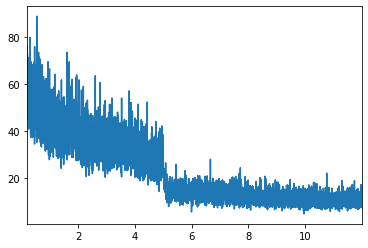

In [47]:
history['train_loss'].iloc[100:].plot();

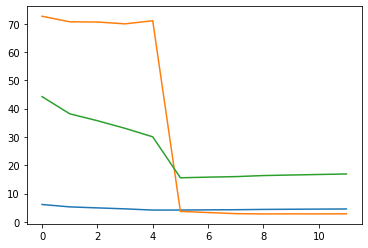

In [48]:
series1 = history.dropna()['mask_loss']
plt.plot(series1.index, series1 ,label = 'mask loss');
series2 = history.dropna()['regr_loss']
plt.plot(series2.index, 30*series2,label = 'regr loss');
series3 = history.dropna()['dev_loss']
plt.plot(series3.index, series3,label = 'dev loss');
plt.show()

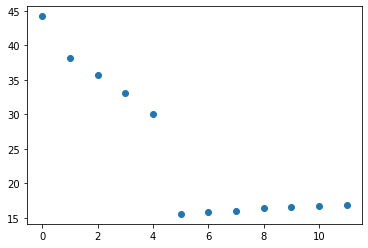

In [49]:
series = history.dropna()['dev_loss']
plt.scatter(series.index, series);

In [43]:
model.load_state_dict(torch.load('./model-dla.pth'))
model.eval()

DLASeg(
  (base): DLA(
    (base_layer): Sequential(
      (0): Conv2d(3, 16, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), bias=False)
      (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace)
    )
    (level0): Sequential(
      (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace)
    )
    (level1): Sequential(
      (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace)
    )
    (level2): Tree(
      (tree1): BasicBlock(
        (conv1): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inpla

# Visualize predictions

In [ ]:
# img, mask, regr = dev_dataset[0]

# plt.figure(figsize=(16,16))
# plt.title('Input image')
# plt.imshow(np.rollaxis(img, 0, 3))
# plt.show()

# plt.figure(figsize=(16,16))
# plt.title('Ground truth mask')
# plt.imshow(mask)
# plt.show()

# output = model(torch.tensor(img[None]).to(device))
# logits = output[0,0].data.cpu().numpy()

# plt.figure(figsize=(16,16))
# plt.title('Model predictions')
# plt.imshow(logits)
# plt.show()

# print(logits)
# plt.figure(figsize=(16,16))
# plt.title('Model predictions thresholded')
# plt.imshow(logits > 0)
# plt.show()

In [ ]:
# ## Simple test of probabilities
# act = torch.nn.Sigmoid()
# logtens = torch.from_numpy(logits)
# probs = act(logtens)
# probs = probs[probs>0.03]
# print(probs)

In [44]:
DISTANCE_THRESH_CLEAR = 2

def convert_3d_to_2d(x, y, z, fx = 2304.5479, fy = 2305.8757, cx = 1686.2379, cy = 1354.9849):
    # stolen from https://www.kaggle.com/theshockwaverider/eda-visualization-baseline
    return x * fx / z + cx, y * fy / z + cy

def optimize_xy(r, c, x0, y0, z0):
    def distance_fn(xyz):
        x, y, z = xyz
        x, y = convert_3d_to_2d(x, y, z0)
        y, x = x, y
        x = (x - IMG_SHAPE[0] // 2) * IMG_HEIGHT / (IMG_SHAPE[0] // 2) / MODEL_SCALE
        x = np.round(x).astype('int')
        y = (y + IMG_SHAPE[1] // 4) * IMG_WIDTH / (IMG_SHAPE[1] * 1.5) / MODEL_SCALE
        y = np.round(y).astype('int')
        return (x-r)**2 + (y-c)**2
    
    res = minimize(distance_fn, [x0, y0, z0], method='Powell')
    x_new, y_new, z_new = res.x
    return x_new, y_new, z0

def clear_duplicates(coords):
    for c1 in coords:
        xyz1 = np.array([c1['x'], c1['y'], c1['z']])
        for c2 in coords:
            xyz2 = np.array([c2['x'], c2['y'], c2['z']])
            distance = np.sqrt(((xyz1 - xyz2)**2).sum())
            if distance < DISTANCE_THRESH_CLEAR:
                if c1['confidence'] < c2['confidence']:
                    c1['confidence'] = -1
    return [c for c in coords if c['confidence'] > 0]

# def extract_coords(prediction, threshold):
#     logits = prediction[0]
#     regr_output = prediction[1:]
#     points = np.argwhere(logits > threshold)
#     col_names = sorted(['x', 'y', 'z', 'yaw', 'pitch_sin', 'pitch_cos', 'roll'])
#     coords = []
#     for r, c in points:
#         regr_dict = dict(zip(col_names, regr_output[:, r, c]))
#         coords.append(_regr_back(regr_dict))
#         coords[-1]['confidence'] = 1 / (1 + np.exp(-logits[r, c]))
#         coords[-1]['x'], coords[-1]['y'], coords[-1]['z'] = optimize_xy(r, c, coords[-1]['x'], coords[-1]['y'], coords[-1]['z'])
#     coords = clear_duplicates(coords)
#     return coords

def coords2str(coords, names=['yaw', 'pitch', 'roll', 'x', 'y', 'z', 'confidence']):
    s = []
    for c in coords:
        for n in names:
            s.append(str(c.get(n, 0)))
    return ' '.join(s)

In [45]:
# import gc

# torch.cuda.empty_cache()
# gc.collect()

# for idx in range(8):
#     img, mask, regr = dev_dataset[idx]
    
#     output = model(torch.tensor(img[None]).to(device)).data.cpu().numpy()
#     coords_pred = extract_coords(output[0])
#     coords_true = extract_coords(np.concatenate([mask[None], regr], 0))
    
#     img = imread(train_images_dir.format(df_dev['ImageId'].iloc[idx]))
    
#     fig, axes = plt.subplots(1, 2, figsize=(30,30))
#     axes[0].set_title('Ground truth')
#     axes[0].imshow(visualize(img, coords_true))
#     axes[1].set_title('Prediction')
#     axes[1].imshow(visualize(img, coords_pred))
#     plt.show()

In [46]:
# model.load_state_dict(torch.load('./modelGaussian.pth'))
# model.eval()

# Evaluation

In [215]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from math import sqrt, acos, pi, sin, cos
from scipy.spatial.transform import Rotation as R
from sklearn.metrics import average_precision_score
from sklearn.metrics import precision_recall_curve
from inspect import signature
import matplotlib.pyplot as plt
from multiprocessing import Pool

def expand_df(df, PredictionStringCols):
    df = df.dropna().copy()
    df['NumCars'] = [int((x.count(' ')+1)/7) for x in df['PredictionString']]

    image_id_expanded = [item for item, count in zip(df['ImageId'], df['NumCars']) for i in range(count)]
    prediction_strings_expanded = df['PredictionString'].str.split(' ',expand = True).values.reshape(-1,7).astype(float)
    prediction_strings_expanded = prediction_strings_expanded[~np.isnan(prediction_strings_expanded).all(axis=1)]
    df = pd.DataFrame(
        {
            'ImageId': image_id_expanded,
            PredictionStringCols[0]:prediction_strings_expanded[:,0],
            PredictionStringCols[1]:prediction_strings_expanded[:,1],
            PredictionStringCols[2]:prediction_strings_expanded[:,2],
            PredictionStringCols[3]:prediction_strings_expanded[:,3],
            PredictionStringCols[4]:prediction_strings_expanded[:,4],
            PredictionStringCols[5]:prediction_strings_expanded[:,5],
            PredictionStringCols[6]:prediction_strings_expanded[:,6]
        })
    return df


def extract_coords(prediction, threshold1, threshold2):
    logits = prediction[0] #peak(prediction[0], threshold1, threshold2)#prediction[0]#peak(prediction[0], threshold1, threshold2)##peak(prediction[0], threshold1, threshold2)
    regr_output = prediction[1:]
    points = np.argwhere(logits > threshold1)
    col_names = sorted(['x', 'y', 'z', 'yaw', 'pitch_sin', 'pitch_cos', 'roll'])
    coords = []
    if len(points) == 0:
        print('no points')
        return coords
    
    for r,c in zip(points.numpy()[0,:], points.numpy()[1,:]):
        regr_dict = dict(zip(col_names, regr_output[:, r, c]))
        for val in regr_dict:
            #if type(regr_dict[val])==torch.Tensor:
            regr_dict[val] = np.float32(regr_dict[val])
                             
        coords.append(_regr_back(regr_dict))
        coords[-1]['confidence'] = np.float32(1 / (1 + np.exp(-logits[r, c])))
        #coords[-1]['x'], coords[-1]['y'], coords[-1]['z'] = optimize_xy(r, c, np.float(coords[-1]['x'].cpu().numpy()), np.float(coords[-1]['x'].cpu().numpy()), np.float(coords[-1]['z'].cpu().numpy()))
        coords[-1]['x'], coords[-1]['y'], coords[-1]['z'] = optimize_xy(r, c, coords[-1]['x'], coords[-1]['y'], coords[-1]['z'])
    coords = clear_duplicates(coords)
    return coords

#def str2coords(s, names):
#    coords = []
#    for l in np.array(s.split()).reshape([-1, 7]):
#        coords.append(dict(zip(names, l.astype('float'))))
#    return coords

def TranslationDistance(p,g, abs_dist = False):
    dx = p['x'] - g['x']
    dy = p['y'] - g['y']
    dz = p['z'] - g['z']
    diff0 = (g['x']**2 + g['y']**2 + g['z']**2)**0.5
    diff1 = (dx**2 + dy**2 + dz**2)**0.5
    if abs_dist:
        diff = diff1
    else:
        diff = diff1/diff0
    return diff

def RotationDistance(p, g):
    true=[ g['pitch'] ,g['yaw'] ,g['roll'] ]
    pred=[ p['pitch'] ,p['yaw'] ,p['roll'] ]
    q1 = R.from_euler('xyz', true)
    q2 = R.from_euler('xyz', pred)
    diff = R.inv(q2) * q1
    W = np.clip(diff.as_quat()[-1], -1., 1.)
    
    # in the official metrics code:
    # https://www.kaggle.com/c/pku-autonomous-driving/overview/evaluation
    #   return Object3D.RadianToDegree( Math.Acos(diff.W) )
    # this code treat θ and θ+2π differntly.
    # So this should be fixed as follows.
    W = (acos(W)*360)/pi
    if W > 180:
        W = 360 - W
    return W

def print_pr_curve(result_flg, scores, recall_total=1):
    average_precision = average_precision_score(result_flg, scores)
    precision, recall, _ = precision_recall_curve(result_flg, scores)
    recall *= recall_total
    plt.step(recall, precision, color='b', alpha=0.2, where='post')
    plt.fill_between(recall, precision, alpha=0.2, color='b')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.ylim([0.0, 1.05])
    plt.xlim([0.0, 1.0])
    plt.show()

In [109]:
thres_tr_list = [0.1, 0.09, 0.08, 0.07, 0.06, 0.05, 0.04, 0.03, 0.02, 0.01]
thres_ro_list = [50, 45, 40, 35, 30, 25, 20, 15, 10, 5]

def check_match(idx):
    keep_gt=False
    thre_tr_dist = thres_tr_list[idx]
    thre_ro_dist = thres_ro_list[idx]
    train_dict = {imgID:str2coords(s, names=['carid_or_score', 'pitch', 'yaw', 'roll', 'x', 'y', 'z']) for imgID,s in zip(train_df['ImageId'],train_df['PredictionString'])}
    valid_dict = {imgID:str2coords(s, names=['pitch', 'yaw', 'roll', 'x', 'y', 'z', 'carid_or_score']) for imgID,s in zip(valid_df['ImageId'],valid_df['PredictionString'])}
    result_flg = [] # 1 for TP, 0 for FP
    scores = []
    MAX_VAL = 10**10
    for img_id in valid_dict:
        for pcar in sorted(valid_dict[img_id], key=lambda x: -x['carid_or_score']):
            # find nearest GT
            min_tr_dist = MAX_VAL
            min_idx = -1
            for idx, gcar in enumerate(train_dict[img_id]):
                tr_dist = TranslationDistance(pcar,gcar)
                if tr_dist < min_tr_dist:
                    min_tr_dist = tr_dist
                    min_ro_dist = RotationDistance(pcar,gcar)
                    min_idx = idx
                    
            # set the result
            if min_tr_dist < thre_tr_dist and min_ro_dist < thre_ro_dist:
                if not keep_gt:
                    train_dict[img_id].pop(min_idx)
                result_flg.append(1)
            else:
                result_flg.append(0)
            scores.append(pcar['carid_or_score'])
    
    return result_flg, scores


# validation prediction

In [247]:
threshold1 = -2
threshold2 = -2

In [248]:
# map: 0.10844716601852893 # -2
# map: 0.11908345067814112 # -3
# map: 0.1279842909587167  # -4
# map: 0.13395854895945764 # -5 
# map: 0.1383288800848642  # -6
# map: 0.14158187970998287 # -7

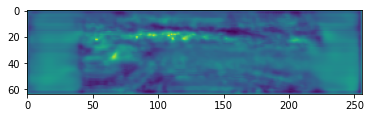

In [249]:

plt.imshow(out[0].cpu().numpy())












  0%|          | 0/11 [00:00<?, ?it/s]










  9%|▉         | 1/11 [00:01<00:19,  1.97s/it]










 18%|█▊        | 2/11 [00:02<00:14,  1.60s/it]










 27%|██▋       | 3/11 [00:03<00:10,  1.33s/it]










 36%|███▋      | 4/11 [00:03<00:07,  1.02s/it]










 45%|████▌     | 5/11 [00:04<00:05,  1.16it/s]










 55%|█████▍    | 6/11 [00:04<00:03,  1.27it/s]










 64%|██████▎   | 7/11 [00:05<00:02,  1.54it/s]










 73%|███████▎  | 8/11 [00:05<00:01,  1.61it/s]










 82%|████████▏ | 9/11 [00:06<00:01,  1.74it/s]










 91%|█████████ | 10/11 [00:06<00:00,  1.99it/s]










100%|██████████| 11/11 [00:06<00:00,  1.61it/s]


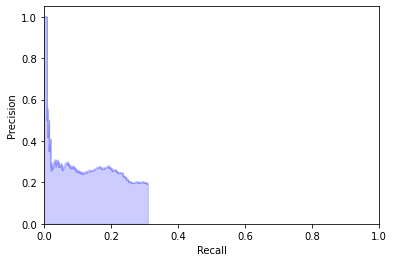

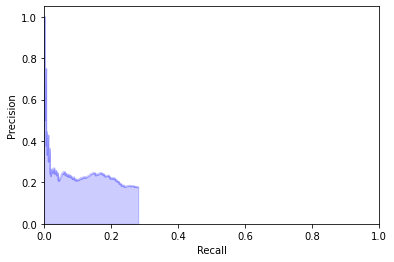

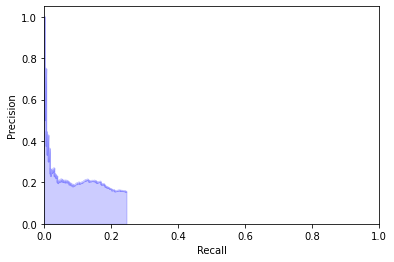

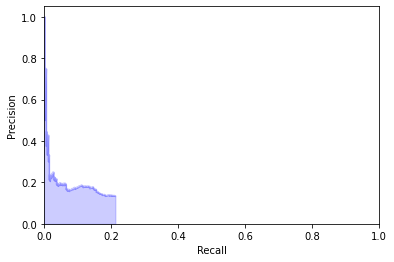

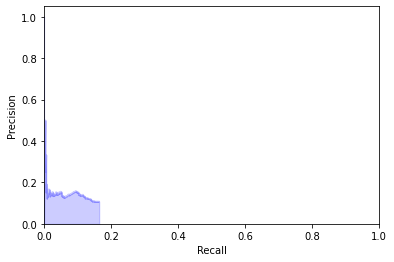

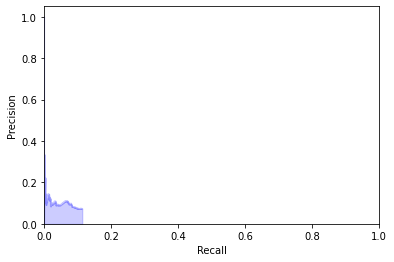

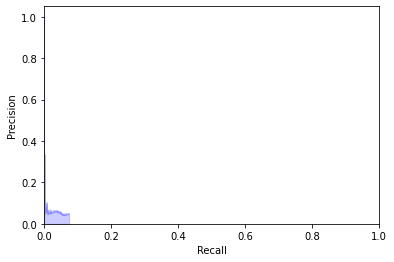

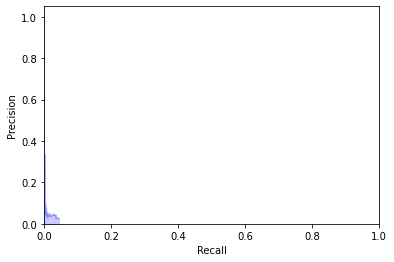

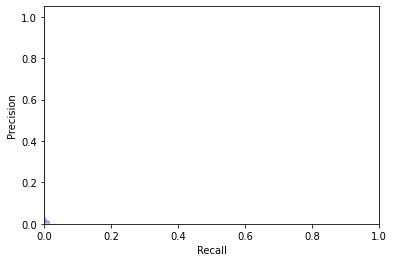

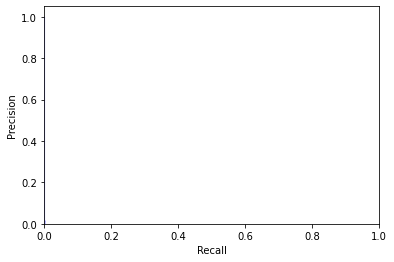

map: 0.029681045602811974


Process ForkPoolWorker-430:
Process ForkPoolWorker-434:
Process ForkPoolWorker-427:
Process ForkPoolWorker-429:
Process ForkPoolWorker-431:
Process ForkPoolWorker-425:
Process ForkPoolWorker-432:
Process ForkPoolWorker-426:
Process ForkPoolWorker-433:
Process ForkPoolWorker-428:
Traceback (most recent call last):
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
Traceback (most recent call last):
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/connection.py", line 407, in _recv_bytes
    buf = self._recv(4)
Traceback (most recent call last):
Traceback (most recent call last):
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/queues.py", line 334, in get
    with self._rlock:
Traceback (most recent call last):
Traceback (most recent call last):
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    s

In [250]:
import copy

predictions = []
dev_loader = DataLoader(dataset=dev_dataset, batch_size=4, shuffle=False, num_workers=4)
model.eval()
for img, _, _ in tqdm(dev_loader):
    with torch.no_grad():
        output = model(img.to(device))
    #output = output.data.cpu().numpy()
    
    output = output[0]['hm']
    
    for out in output:
        coords = extract_coords(out, threshold1, threshold2)
        s = coords2str(coords)
        predictions.append(s)
        
df_dev['PredictionString'] = copy.copy(predictions)

valid_df = df_dev
expanded_valid_df = expand_df(valid_df, ['pitch','yaw','roll','x','y','z','Score'])
valid_df = valid_df.fillna('')

train_df = pd.read_csv('../input/pku-autonomous-driving/train.csv')
train_df = train_df[train_df.ImageId.isin(valid_df.ImageId.unique())]
# data description page says, The pose information is formatted as
# model type, yaw, pitch, roll, x, y, z
# but it doesn't, and it should be
# model type, pitch, yaw, roll, x, y, z
expanded_train_df = expand_df(train_df, ['model_type','pitch','yaw','roll','x','y','z'])

max_workers = 10
n_gt = len(expanded_train_df)
ap_list = []
p = Pool(processes=max_workers)
for result_flg, scores in p.imap(check_match, range(10)):
    if np.sum(result_flg) > 0:
        n_tp = np.sum(result_flg)
        recall = n_tp/n_gt
        ap = average_precision_score(result_flg, scores)*recall
        print_pr_curve(result_flg, scores, recall)
    else:
        ap = 0
    ap_list.append(ap)
map = np.mean(ap_list)
print('map:', map)

score = {}
score[str(threshold1)+'_'+str(threshold2)]=map

In [ ]:
# train = pd.read_csv(PATH + 'train.csv')
# test = pd.read_csv(PATH + 'sample_submission.csv')

# # From camera.zip
# camera_matrix = np.array([[2304.5479, 0,  1686.2379],
#                           [0, 2305.8757, 1354.9849],
#                           [0, 0, 1]], dtype=np.float32)
# camera_matrix_inv = np.linalg.inv(camera_matrix)

# train_images_dir = PATH + 'train_images/{}.jpg'
# test_images_dir = PATH + 'test_images/{}.jpg'

# df_train, df_dev = train_test_split(train, test_size=0.01, random_state=42)
# df_test = test

# # Create dataset objects
# train_dataset = CarDataset(df_train, train_images_dir)
# dev_dataset = CarDataset(df_dev, train_images_dir)
# test_dataset = CarDataset(df_test, test_images_dir)

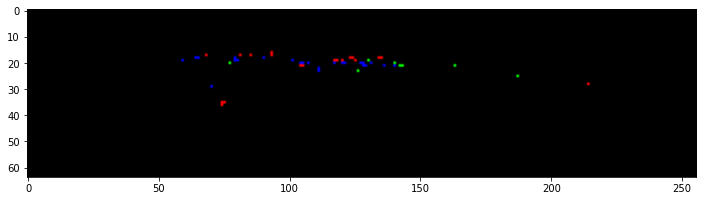

In [128]:
plt.figure(figsize=(12, 8))
plt.imshow(((np.einsum('ijk->jki', output.cpu()[:,0,:,:])).astype(float)>-2).astype(float))

In [351]:
def peak(array, threshold1, threshold2):
    (xlist, ylist) = np.where(array[0]>np.sort(array[0].reshape((1,-1)))[0][-200])
    peak_array = array
    maximum = array.max()
    for k in range(len(xlist)):
        idx = 0
        i = xlist[k]
        j = ylist[k]
        try:
            array[i-1,j-1]
            array[i+1,j+1]
        except:
            continue
            
        ct = 0 
        surroundings = [(i-1,j+1),(i-1,j),(i-1,j+1),(i,j-1),(i,j+1),(i+1,j+1),(i+1,j),(i+1,j+1)]
        for xy in surroundings:
            if array[xy[0],xy[1]]>=array[i,j] and array[i,j]>threshold1-2:
                ct += 1
                        
        if ct > 6:
            idx += 1
        if idx==1 and array[i,j]>threshold1-2:
            peak_array[i,j]+=(maximum - peak_array[i,j])/2
        #if array[i,j]>threshold1+threshold2: #1.5
        #    pass#peak_array[i,j]+=0.5 #1
    return peak_array

In [391]:
np.argmax(np.array([1,2,3]))

2

In [422]:
def peak_tmp(array, threshold1, threshold2):
    (xlist, ylist) = np.where(array[0]>np.sort(array[0].reshape((1,-1)))[0][-50])
    peak_array = array[0]
    maximum = array.max()
    
    idx = 0
    for k in range(len(xlist)):
        i = xlist[k]
        j = ylist[k]
        ct1 = 0 # 주변의 점들이 top 50 안에 있는가
        ct2 = 0 # 주변의 점들의 값이 작은가 
        
        if 0<i<array.shape[1]-1 and 0<j<array.shape[2]-1:    
            surroundings = [(i-1,j+1),(i-1,j),(i-1,j+1),(i,j-1),(i,j+1),(i+1,j+1),(i+1,j),(i+1,j+1)]
            for xy in surroundings:
                if xy[0] in xlist and xy[1] in ylist:
                    ct1 += 1
                if peak_array[i,j] > peak_array[xy[0], xy[1]]:
                    ct2 += 1
            if ct1 > 6 and ct2 > 7:
                idx += 1
                peak_array[i,j]+=(maximum - peak_array[i,j])*(1/2)
            
    penalty = np.zeros(array[0].shape)
    
    
    for i in range(1,array.shape[1]-1):
        for j in range(1,array.shape[2]-1):    
            ct_sur = 0 
            surroundings = [(i,j),(i,j+1),(i+1,j),(i+1,j+1)]
            for xy in surroundings:
                if array[0][xy[0],xy[1]]>threshold1:
                    ct_sur += 1

            if ct_sur > 2:
                idx = np.argmax(np.array([array[0][i,j],array[0][i,j+1],array[0][i+1,j],array[0][i+1,j+1]]))
                if idx == 0:
                    penalty[i,j+1]-=1
                    penalty[i+1,j]-=1
                    penalty[i+1,j+1]-=1
                elif idx == 1:
                    penalty[i,j]-=1
                    penalty[i+1,j]-=1
                    penalty[i+1,j+1]-=1
                elif idx == 2:
                    penalty[i,j]-=1
                    penalty[i,j+1]-=1
                    penalty[i+1,j+1]-=1
                elif idx == 3:
                    penalty[i,j]-=1
                    penalty[i,j+1]-=1
                    penalty[i+1,j]-=1

            elif ct_sur > 1:
                idx = np.argmax(np.array([array[0][i,j],array[0][i,j+1],array[0][i+1,j],array[0][i+1,j+1]]))
                if idx == 0:
                    penalty[i,j+1]-=0.3
                    penalty[i+1,j]-=0.3
                    penalty[i+1,j+1]-=0.3
                elif idx == 1:
                    penalty[i,j]-=0.3
                    penalty[i+1,j]-=0.3
                    penalty[i+1,j+1]-=0.3
                elif idx == 2:
                    penalty[i,j]-=0.3
                    penalty[i,j+1]-=0.3
                    penalty[i+1,j+1]-=0.3
                elif idx == 3:
                    penalty[i,j]-=0.3
                    penalty[i,j+1]-=0.3
                    penalty[i+1,j]-=0.3

                    
                    
    print("penalty:", np.sum(penalty))            
    peak_array = peak_array + penalty*threshold2
        
        #if idx==1 and array[i,j]>threshold1-3:
        #    peak_array[i,j]+=(maximum - peak_array[i,j])*(2/3)
        #if idx==0 and array[i,j]>threshold1:
        #    peak_array[i,j]+=(maximum - peak_array[i,j])*(2/3)
            
        #if array[i,j]>threshold1+threshold2: #1.5
        #    pass#peak_array[i,j]+=0.5 #1
    return peak_array, idx

In [423]:
threshold1 = -2
threshold2 = 1

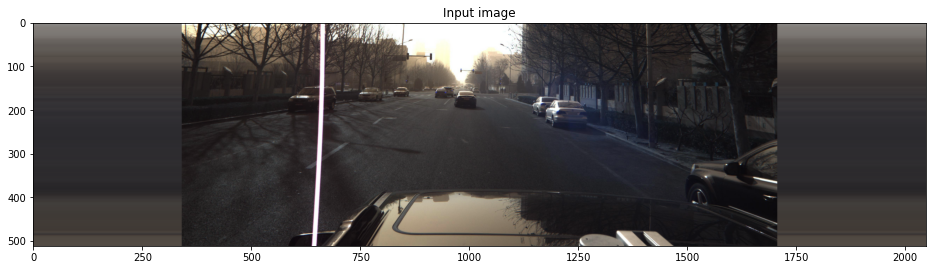

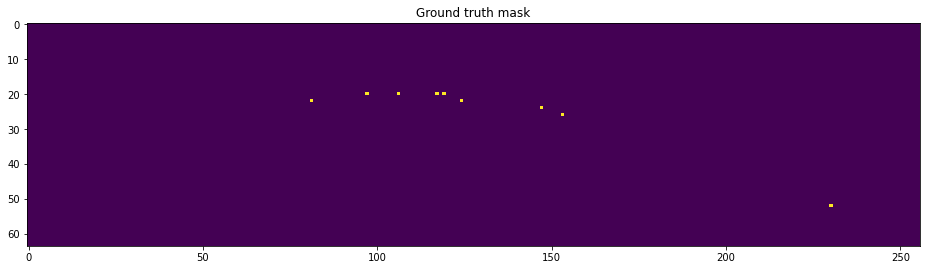

GT count: 9


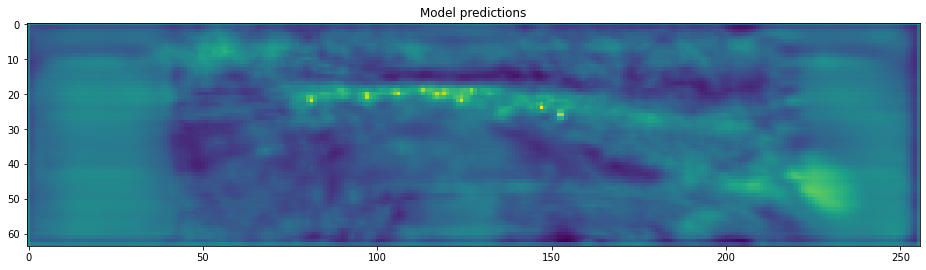

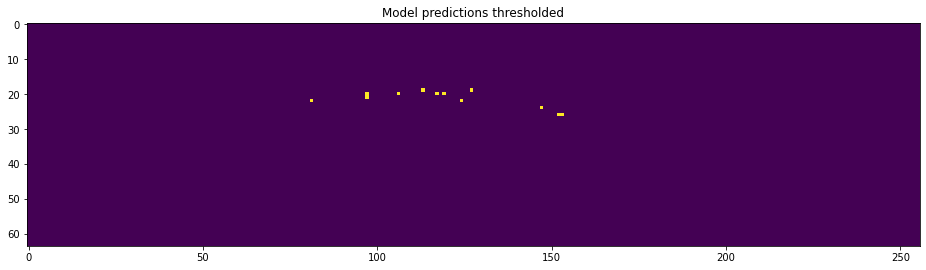

MP count: 12
penalty: -3.5999999999999996
idx: 1


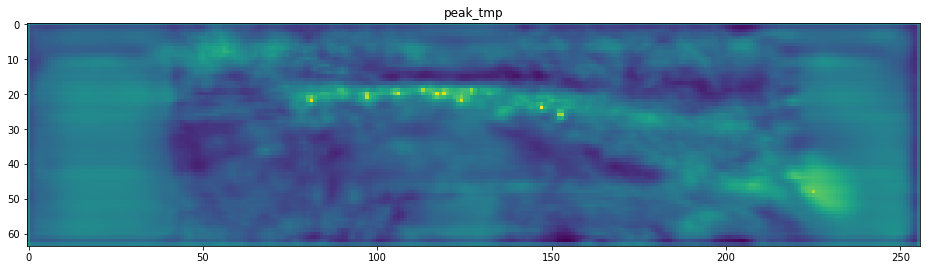

1


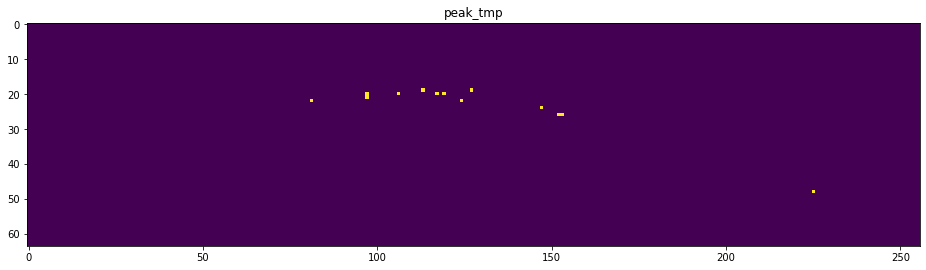

PEAK count: 13


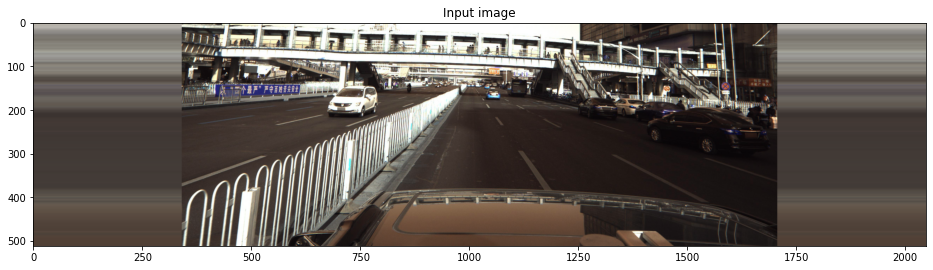

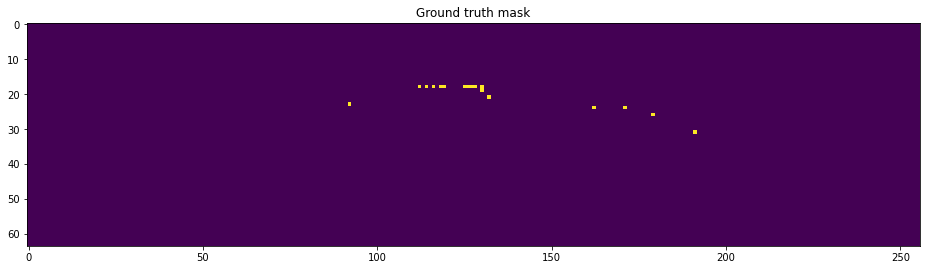

GT count: 17


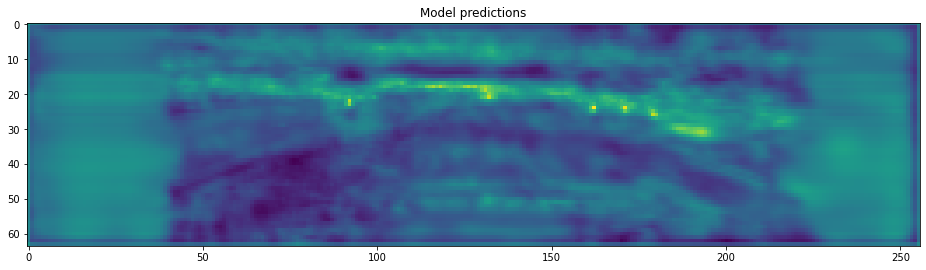

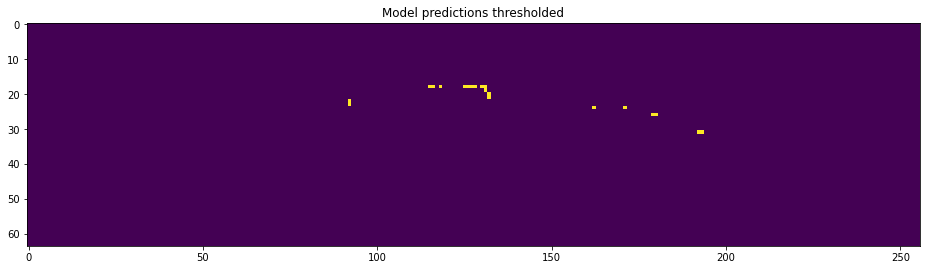

MP count: 20
penalty: -20.1
idx: 1


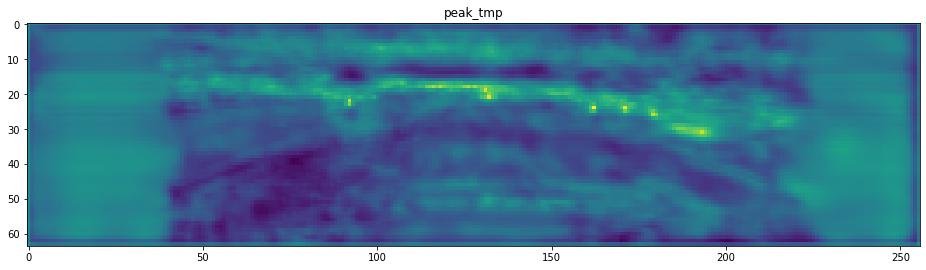

1


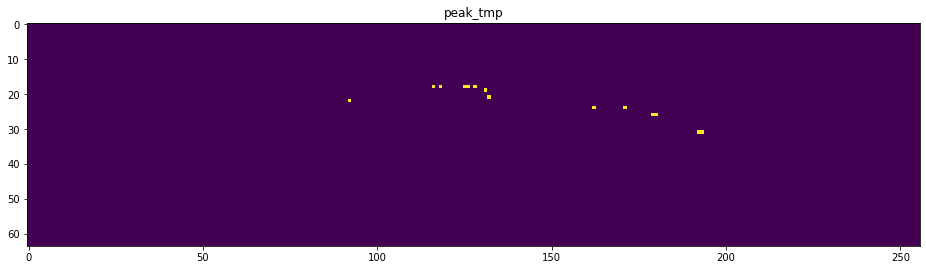

PEAK count: 14


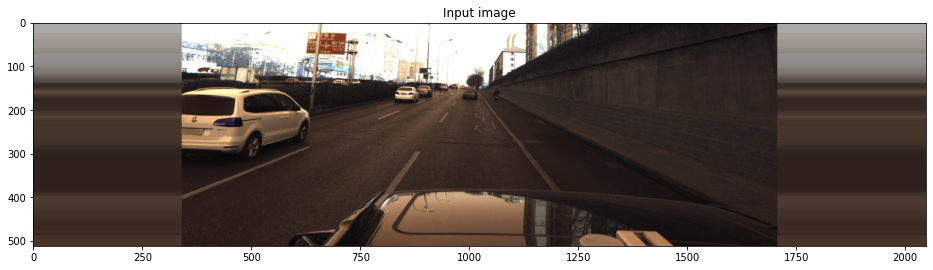

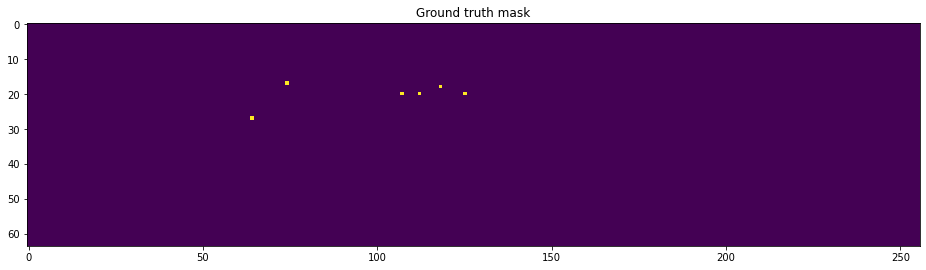

GT count: 6


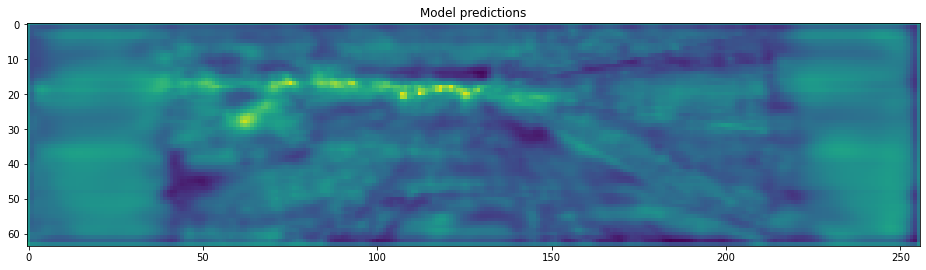

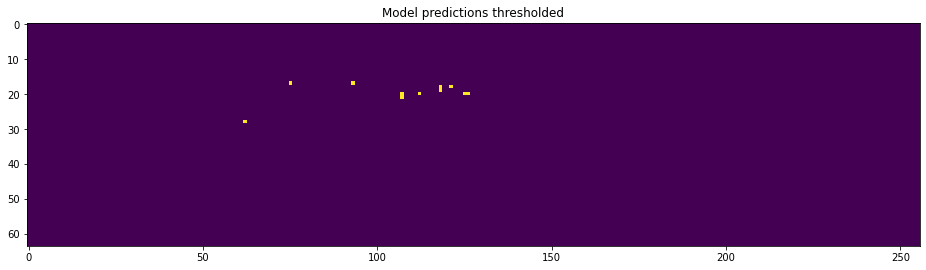

MP count: 11
penalty: -5.4
idx: 0


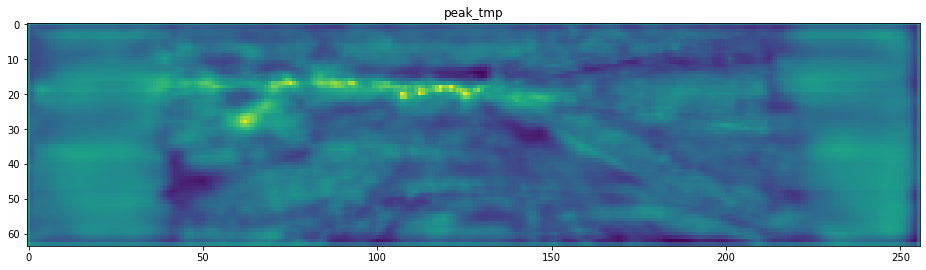

0


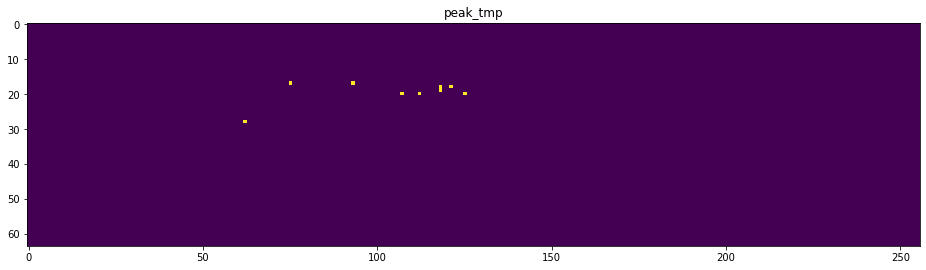

PEAK count: 9


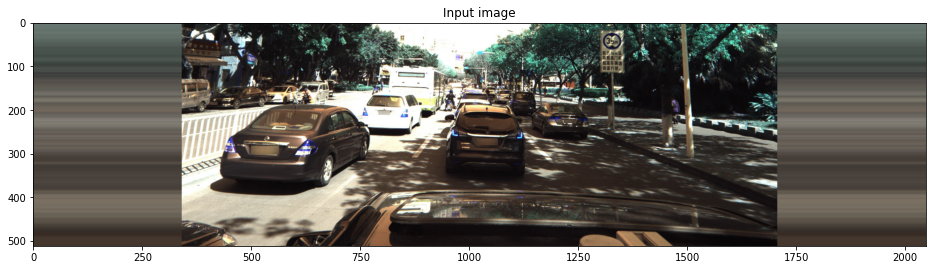

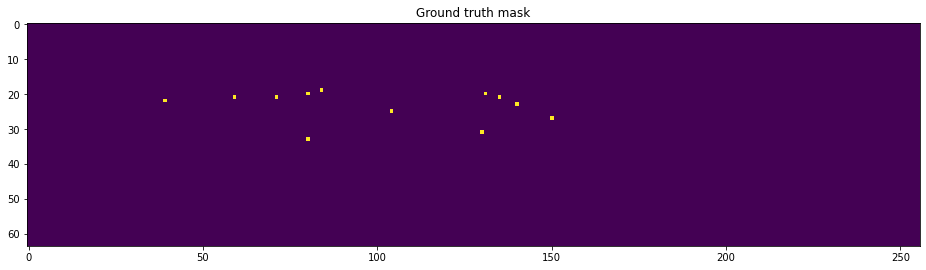

GT count: 12


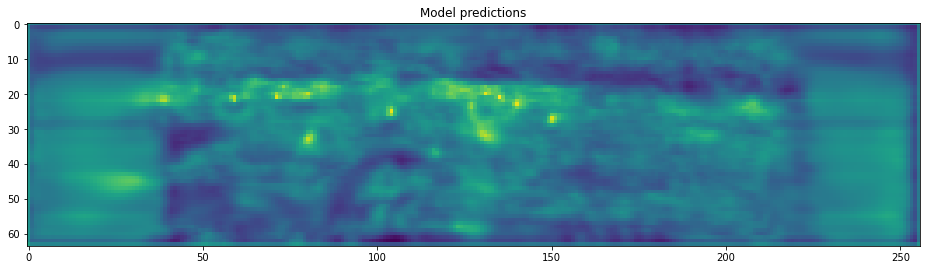

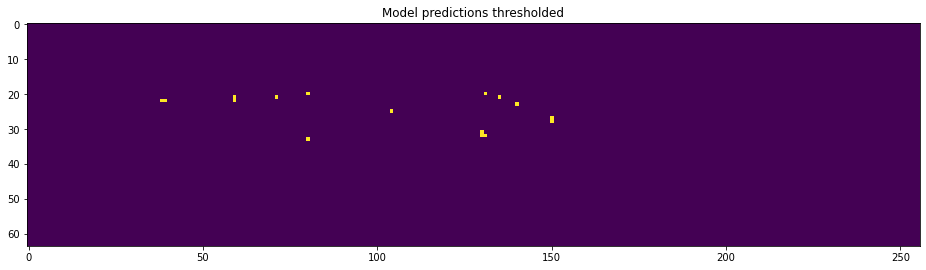

MP count: 16
penalty: -10.2
idx: 1


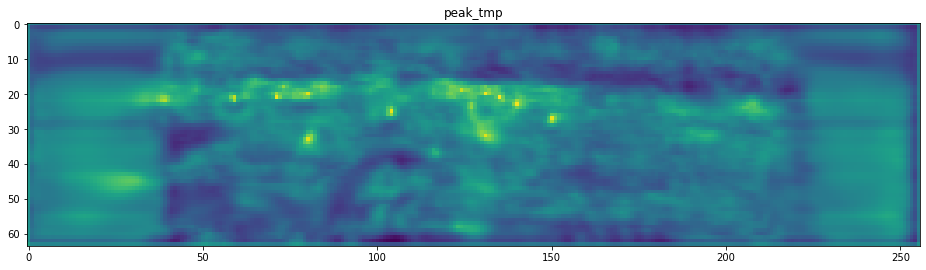

1


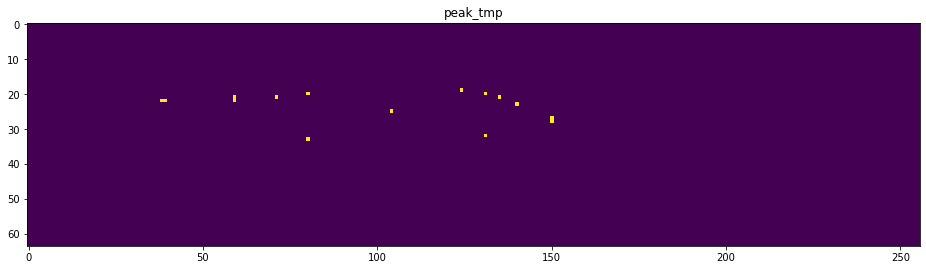

PEAK count: 15


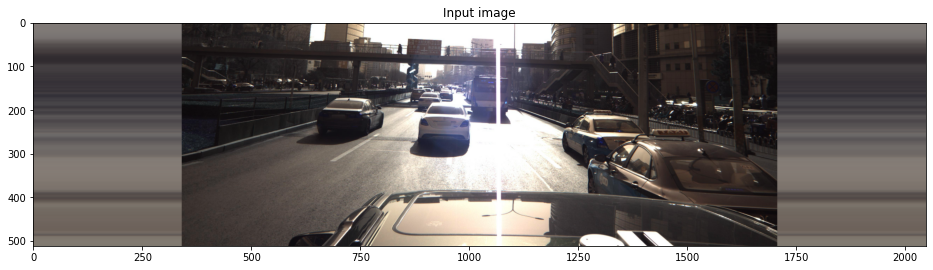

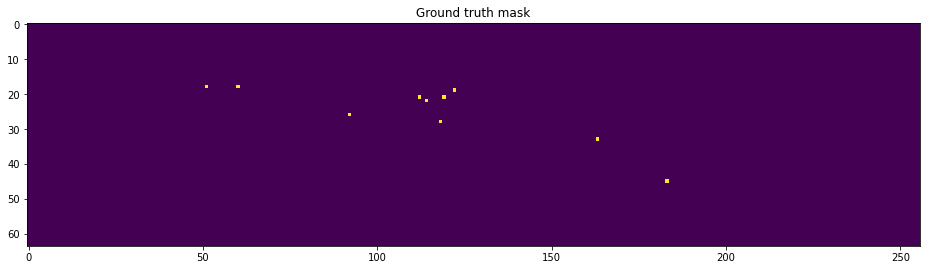

GT count: 10


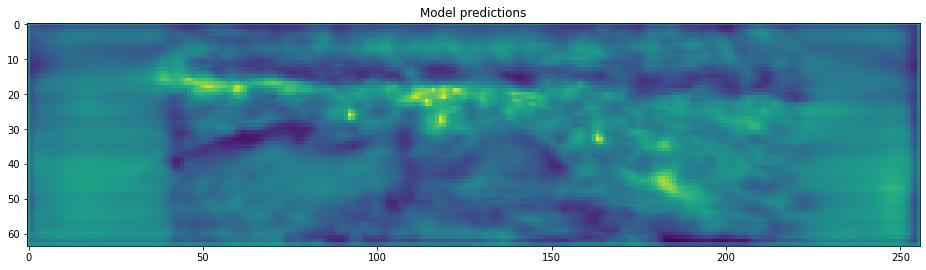

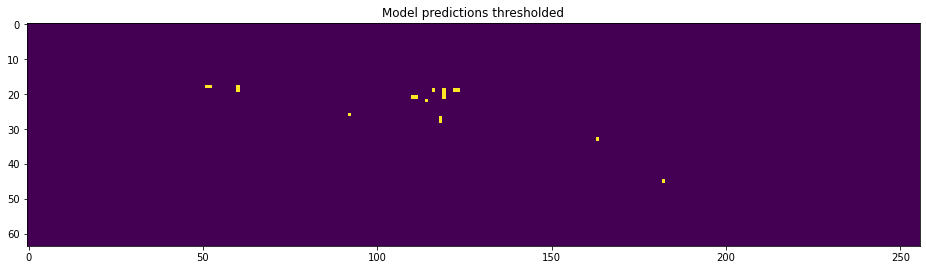

MP count: 18
penalty: -14.4
idx: 0


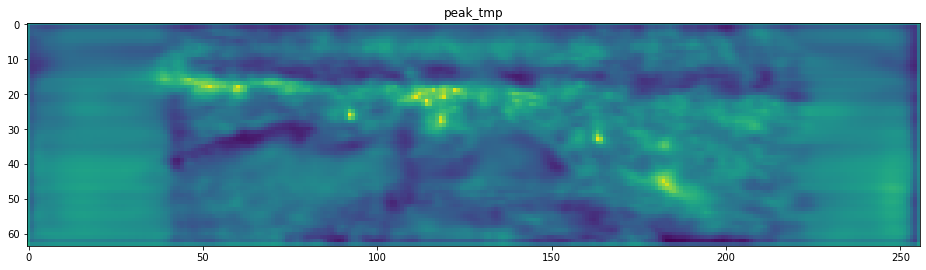

0


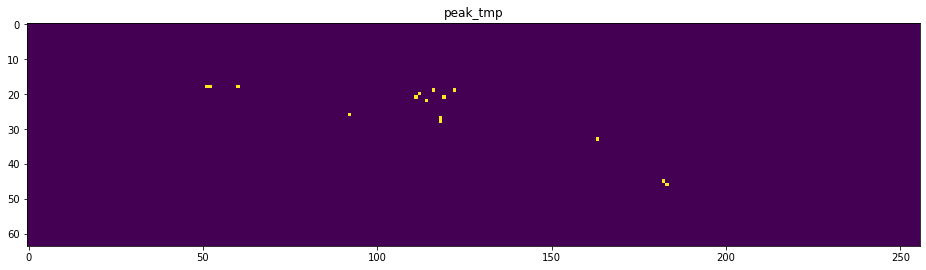

PEAK count: 15


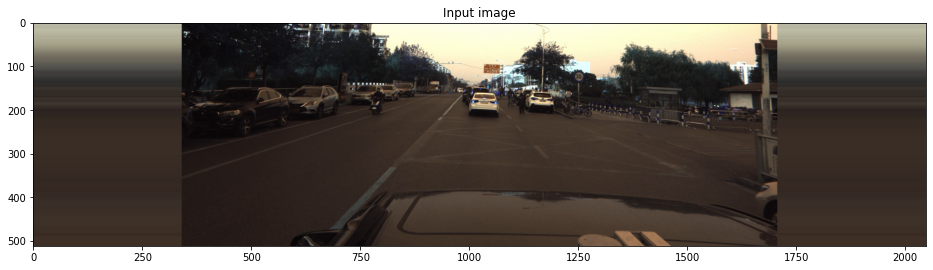

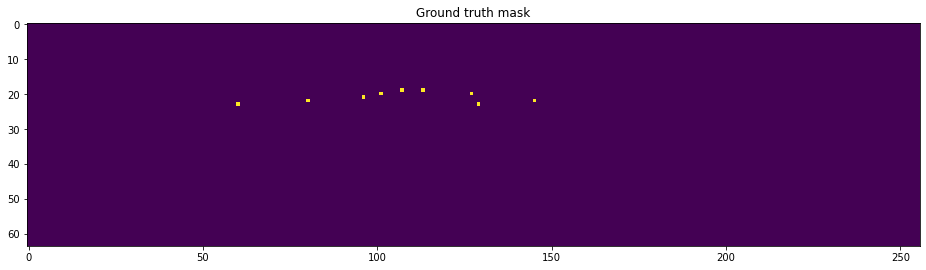

GT count: 9


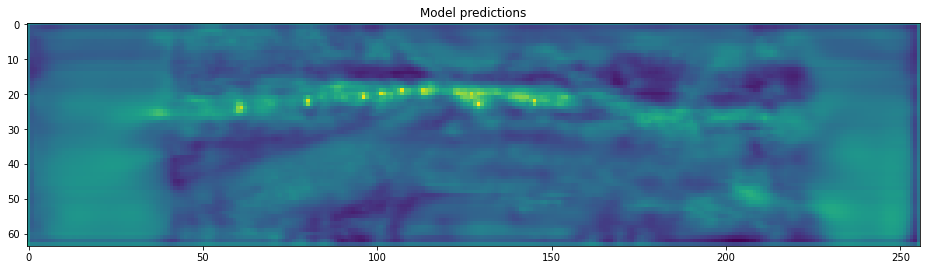

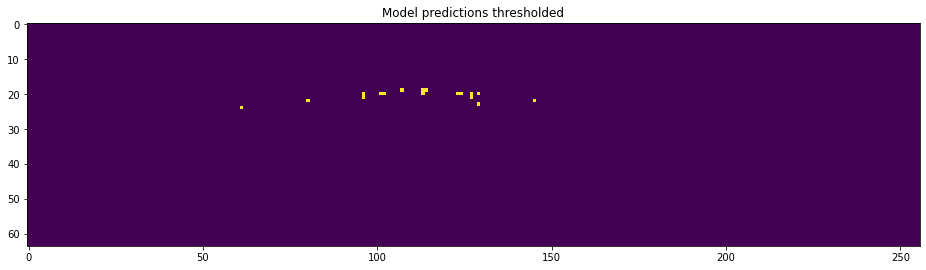

MP count: 17
penalty: -12.0
idx: 0


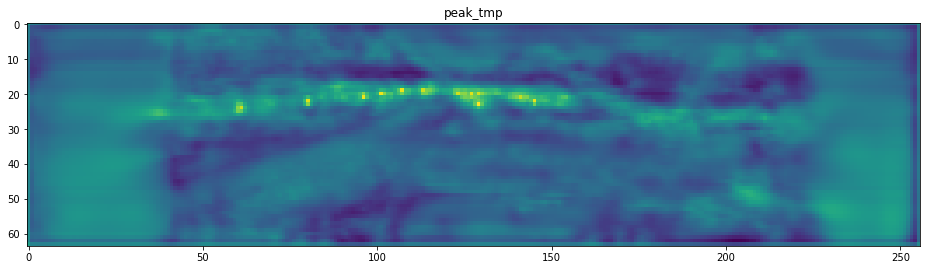

0


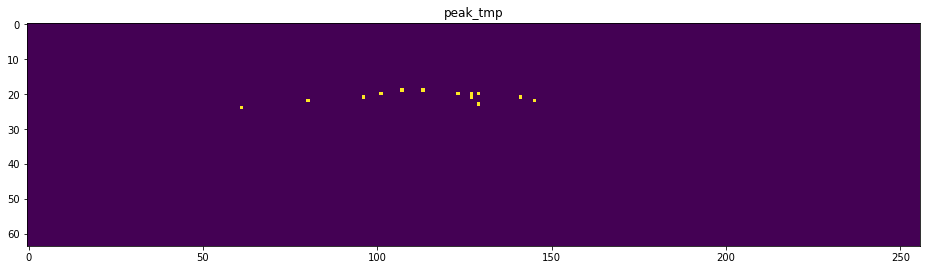

PEAK count: 13


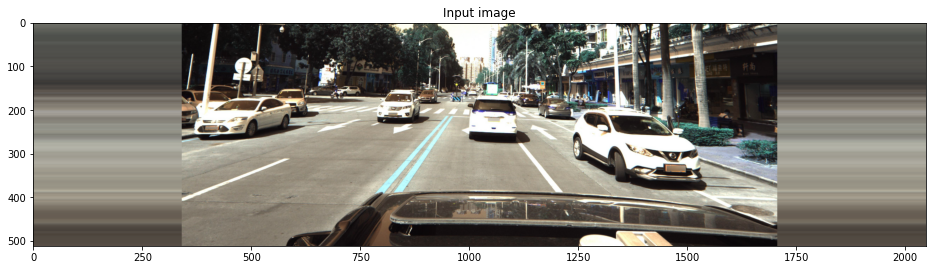

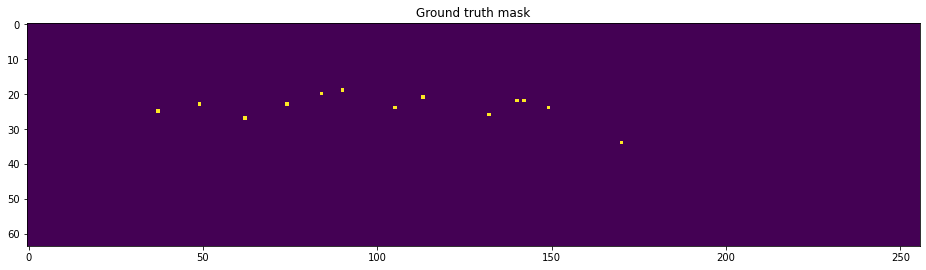

GT count: 13


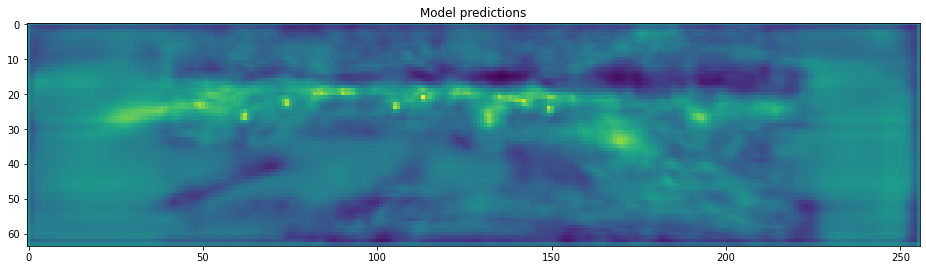

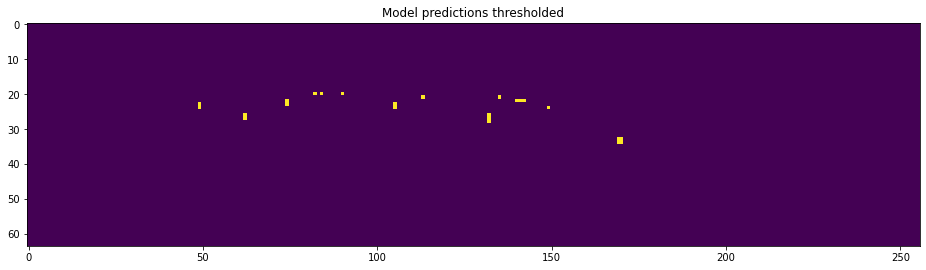

MP count: 24
penalty: -21.0
idx: 1


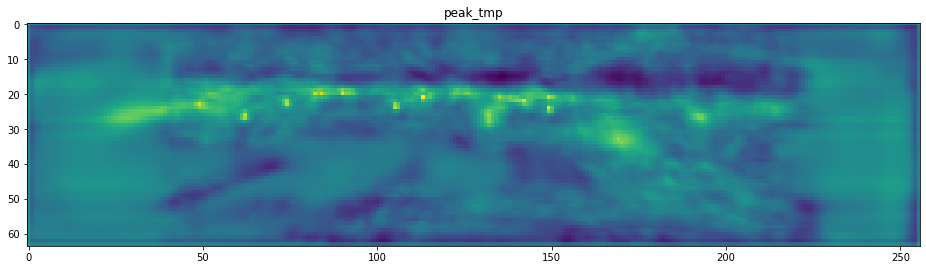

1


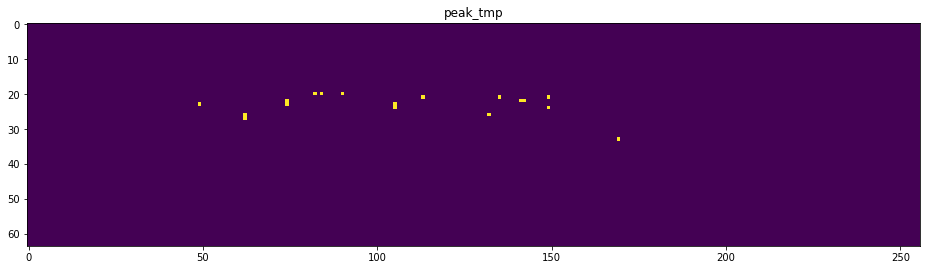

PEAK count: 18


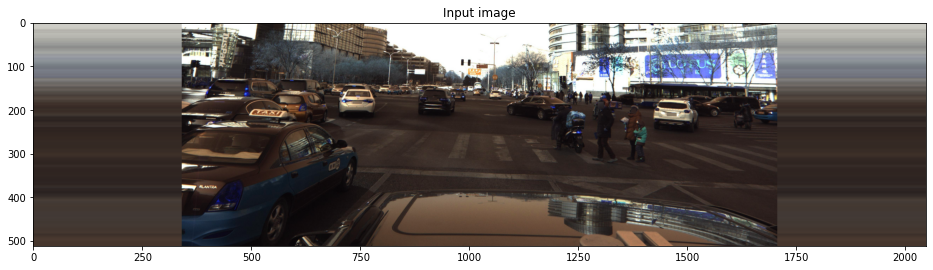

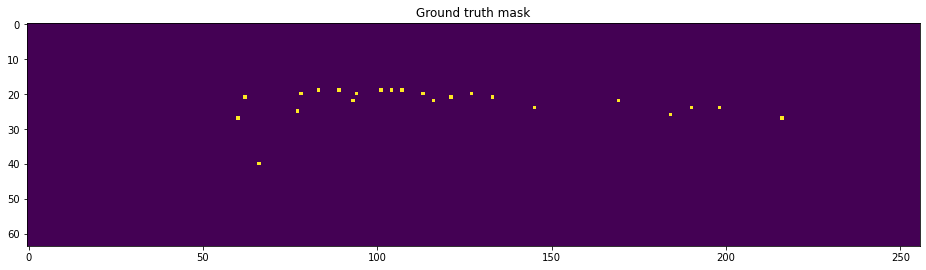

GT count: 23


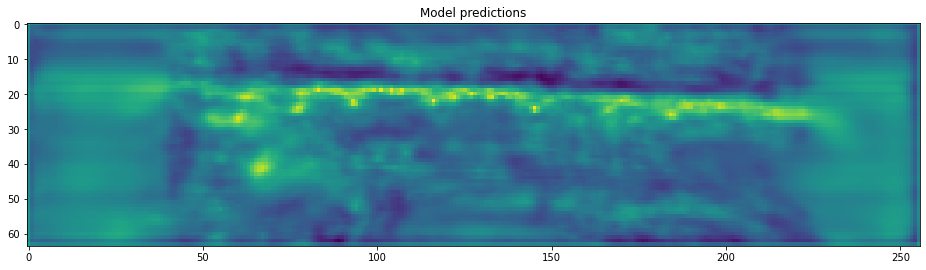

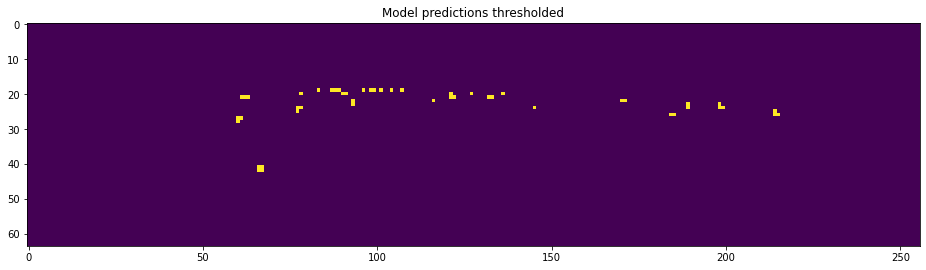

MP count: 49
penalty: -51.3
idx: 0


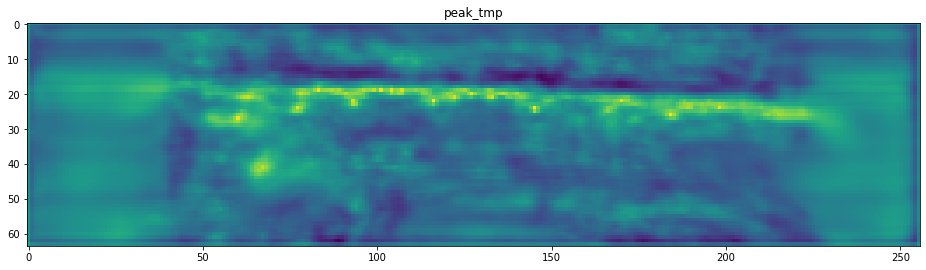

0


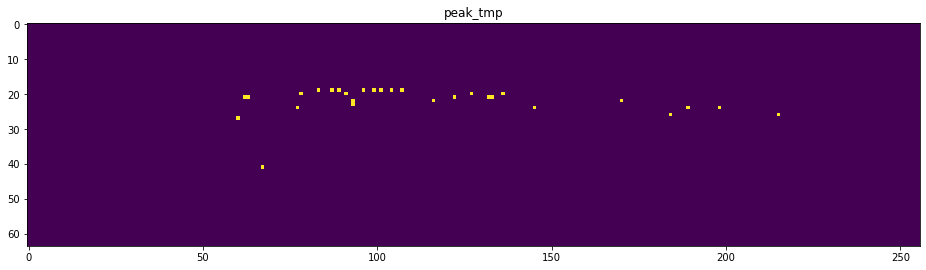

PEAK count: 29


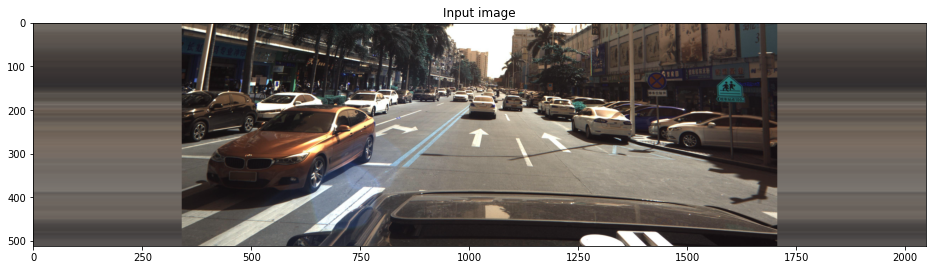

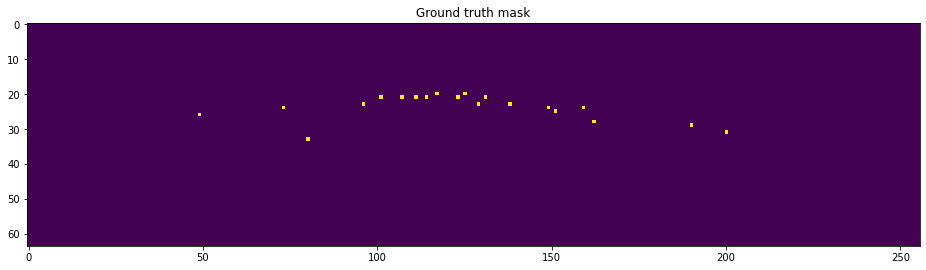

GT count: 20


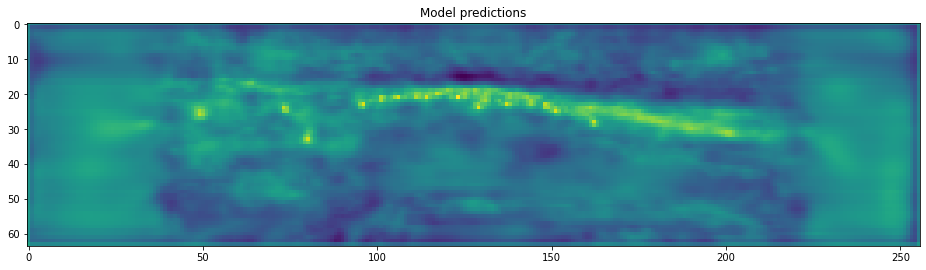

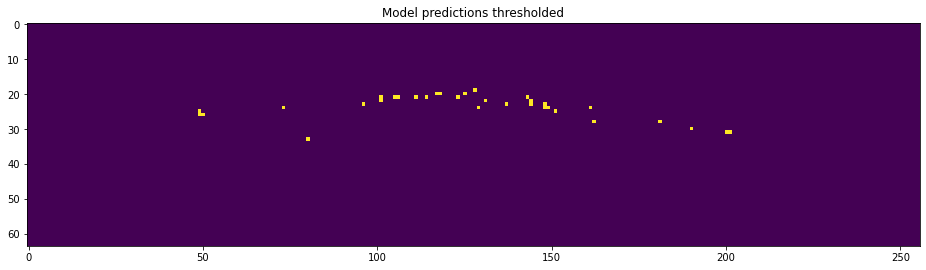

MP count: 33
penalty: -19.5
idx: 0


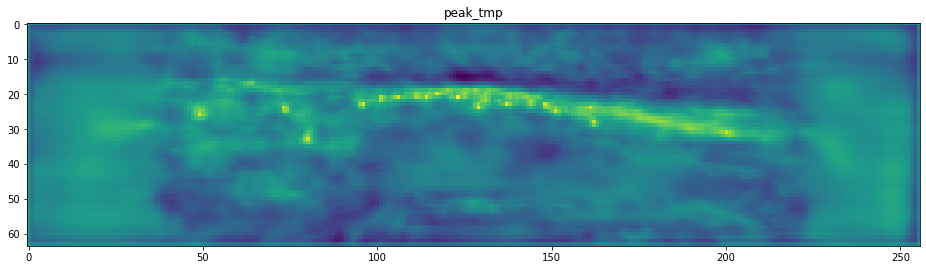

0


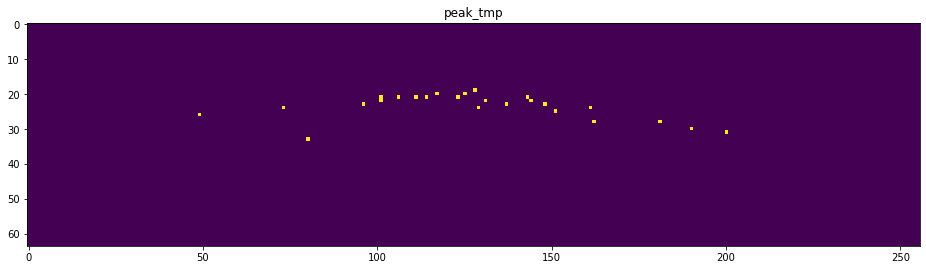

PEAK count: 25


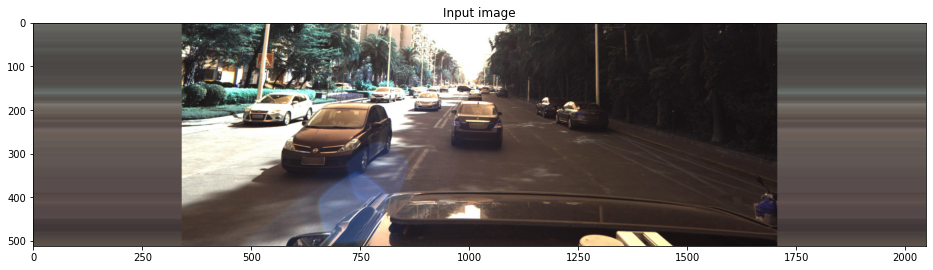

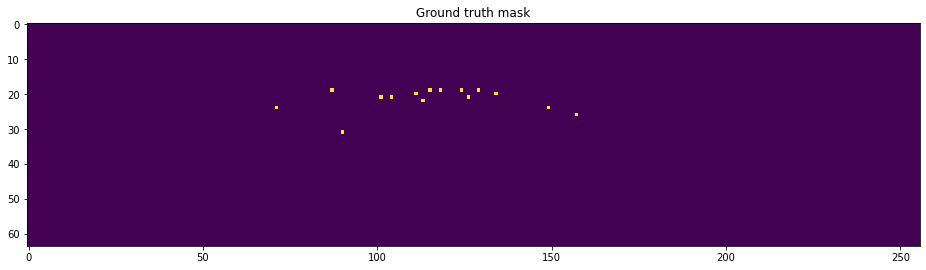

GT count: 15


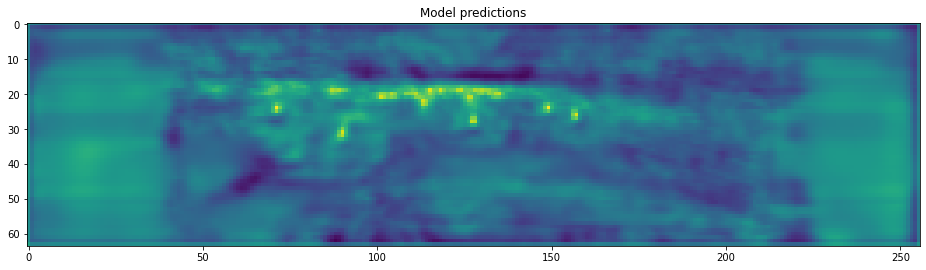

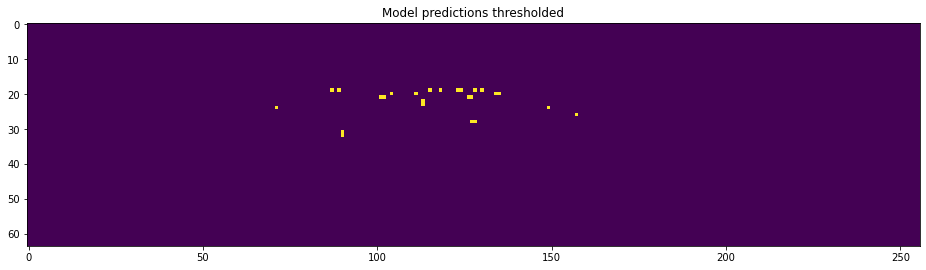

MP count: 25
penalty: -12.6
idx: 0


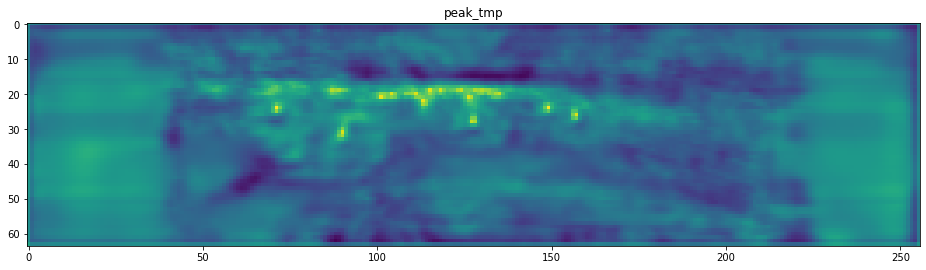

0


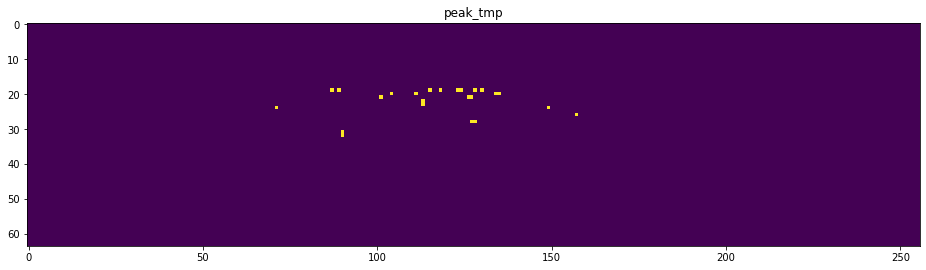

PEAK count: 24


In [424]:
for i in range(40,50):
    img, mask, regr = train_dataset[i]

    plt.figure(figsize=(16,16))
    plt.title('Input image')
    plt.imshow(np.rollaxis(img, 0, 3))
    plt.show()

    plt.figure(figsize=(16,16))
    plt.title('Ground truth mask')
    plt.imshow(mask)
    plt.show()
    print("GT count:", np.sum(mask>0))

    output = model(torch.tensor(img[None]).to(device))
    output = output[0]['hm']
    logits = output[0,0].data.cpu().numpy()

    plt.figure(figsize=(16,16))
    plt.title('Model predictions')
    plt.imshow(logits)
    plt.show()
    

    plt.figure(figsize=(16,16))
    plt.title('Model predictions thresholded')
    plt.imshow(logits>-2)
    plt.show()
    print("MP count:", np.sum(logits>-2))
    
    img, idx = peak_tmp(logits[None],threshold1,threshold2)
    print('idx:',idx)
    plt.figure(figsize=(16,16))
    plt.title('peak_tmp')
    plt.imshow(img)
    plt.show()
    
    print(idx)
    plt.figure(figsize=(16,16))
    plt.title('peak_tmp')
    plt.imshow(img>-2)
    plt.show()
    print("PEAK count:", np.sum(img>-2))

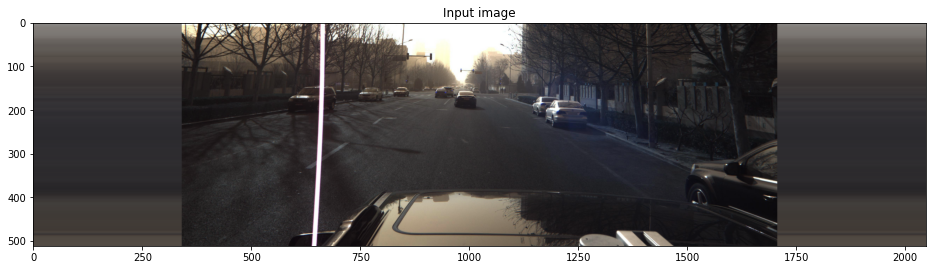

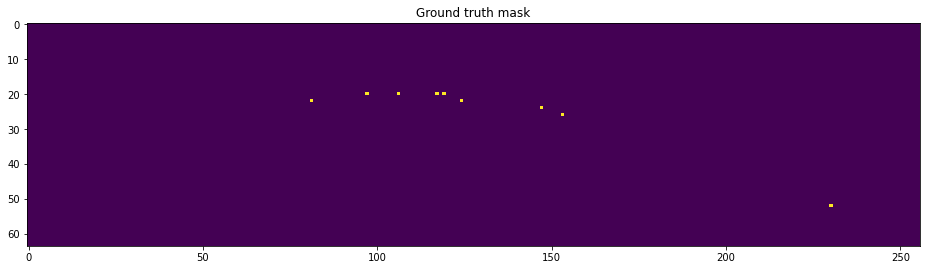

GT count: 9


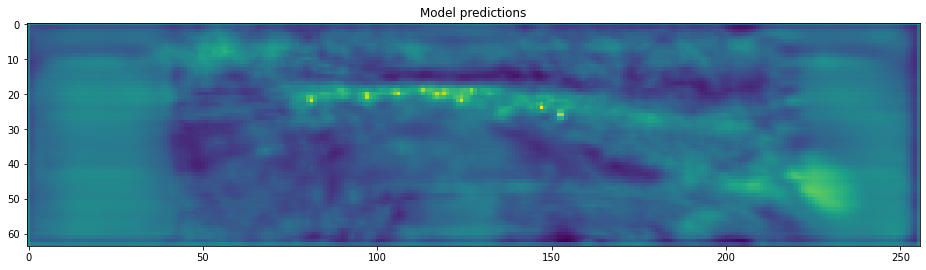

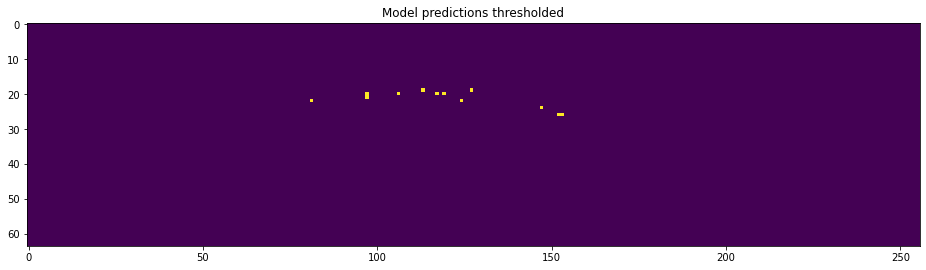

MP count: 12
(1, 64, 256)
idx: 3


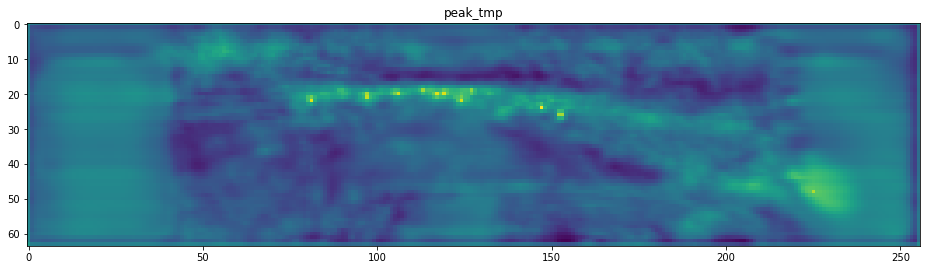

3


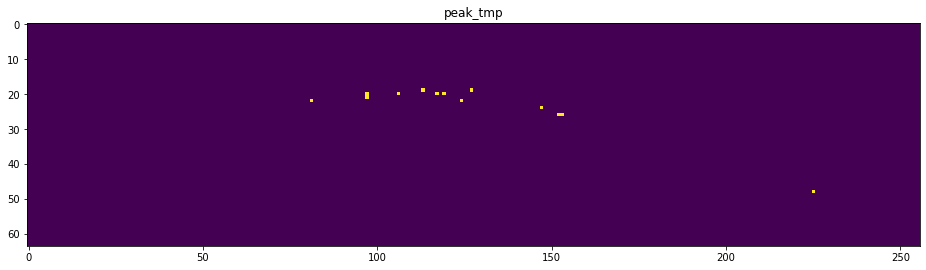

PEAK count: 13


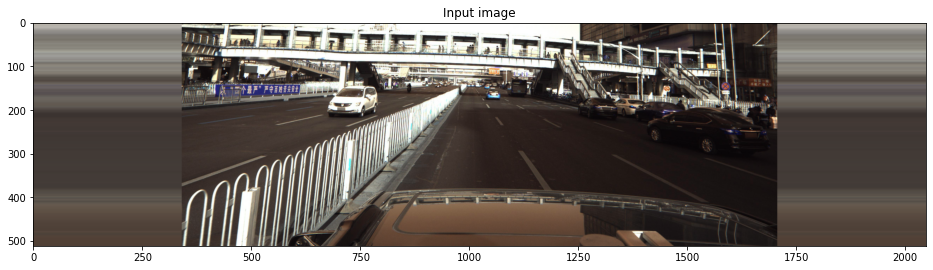

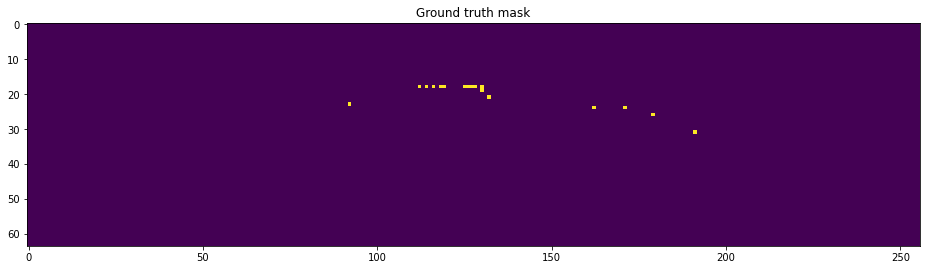

GT count: 17


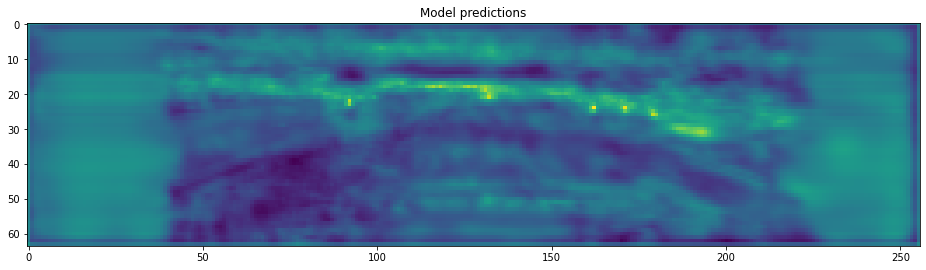

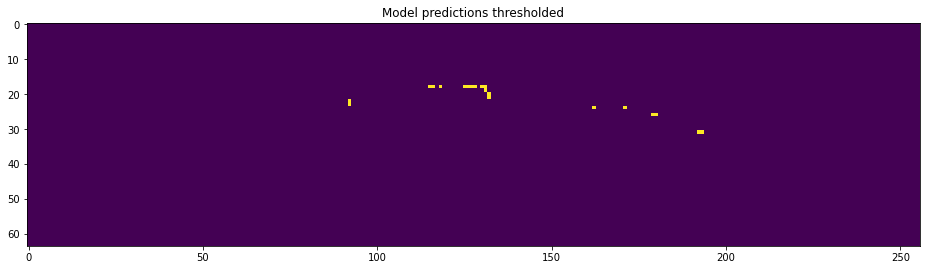

MP count: 20
(1, 64, 256)
idx: 3


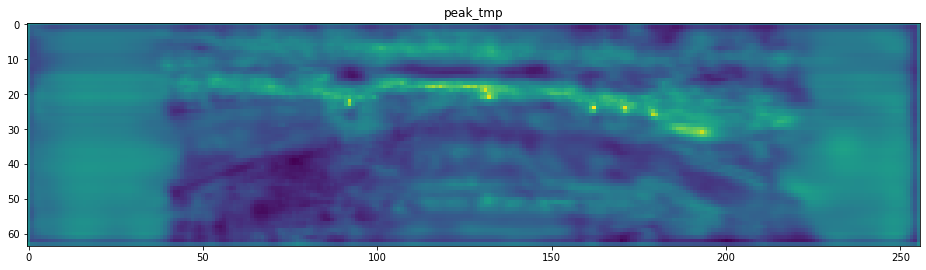

3


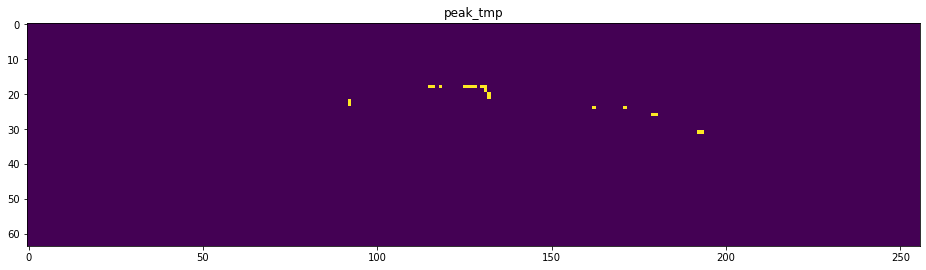

PEAK count: 20


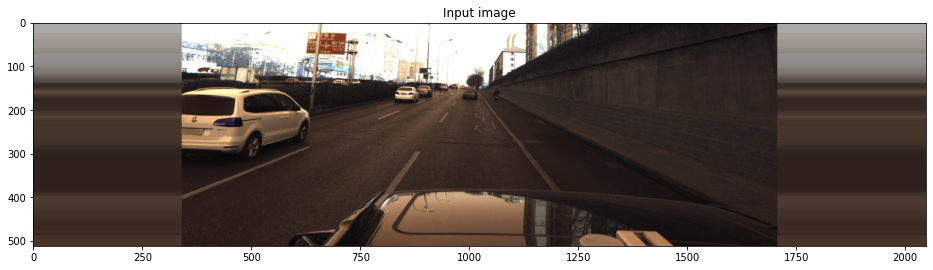

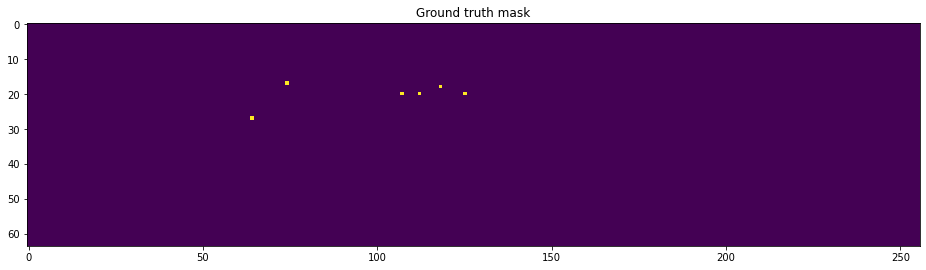

GT count: 6


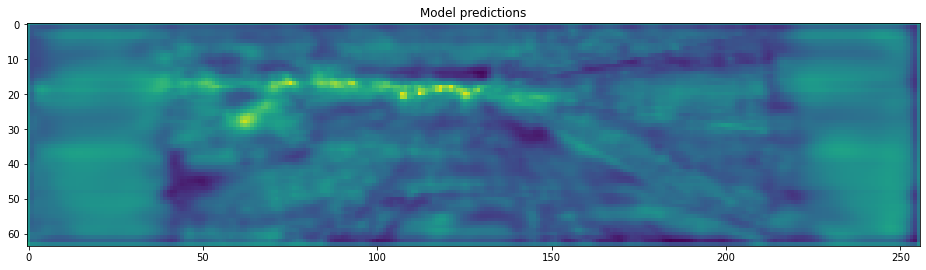

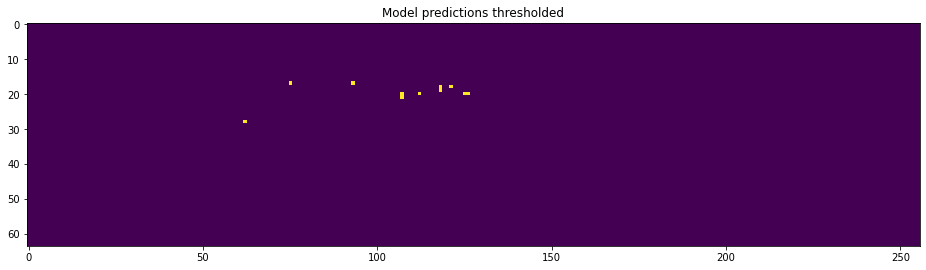

MP count: 11
(1, 64, 256)
idx: 6


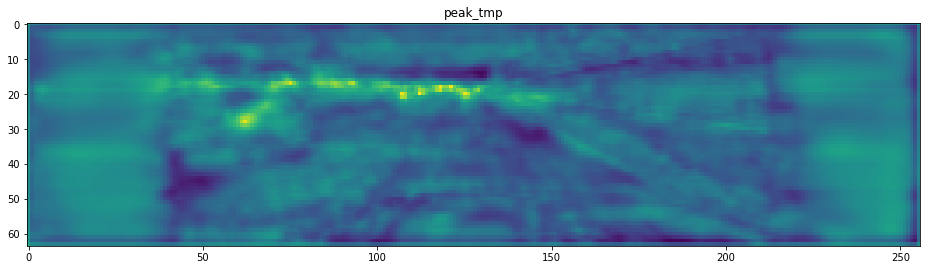

6


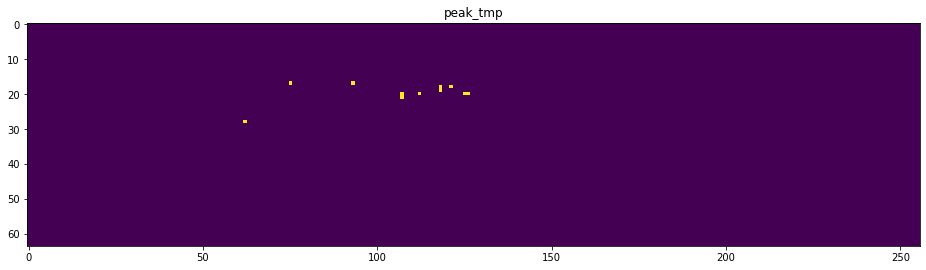

PEAK count: 11


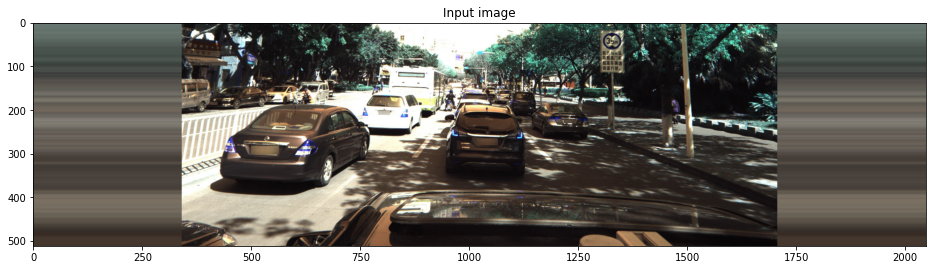

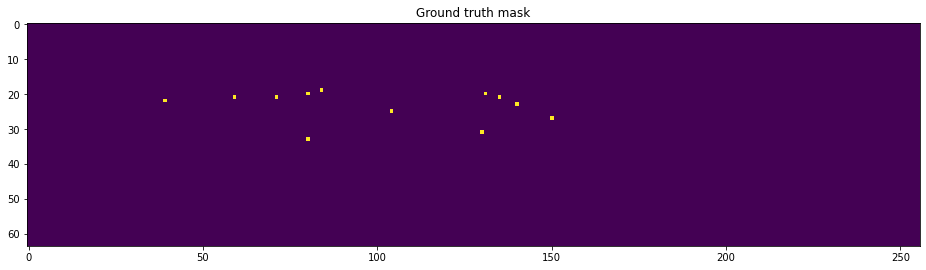

GT count: 12


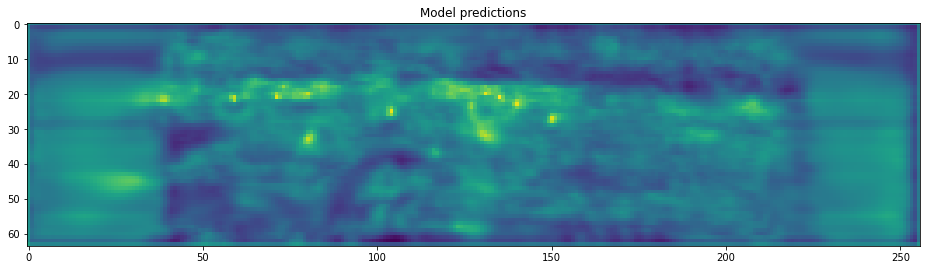

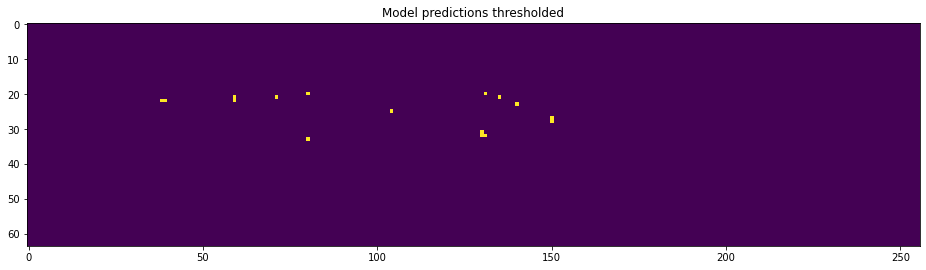

MP count: 16
(1, 64, 256)
idx: 9


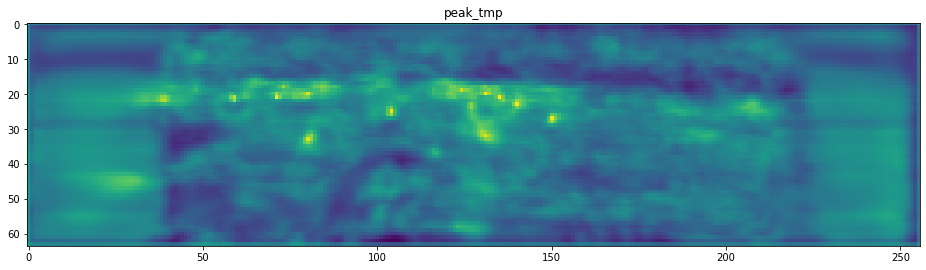

9


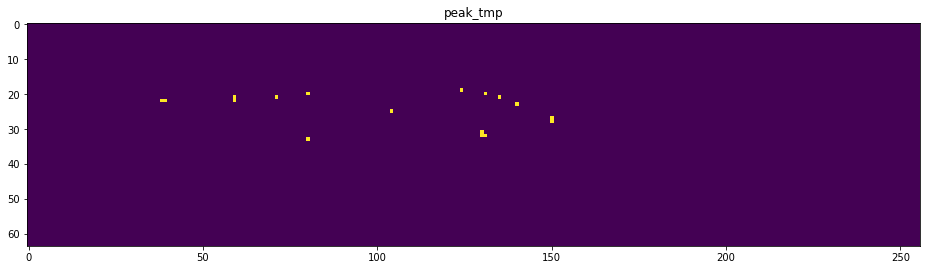

PEAK count: 17


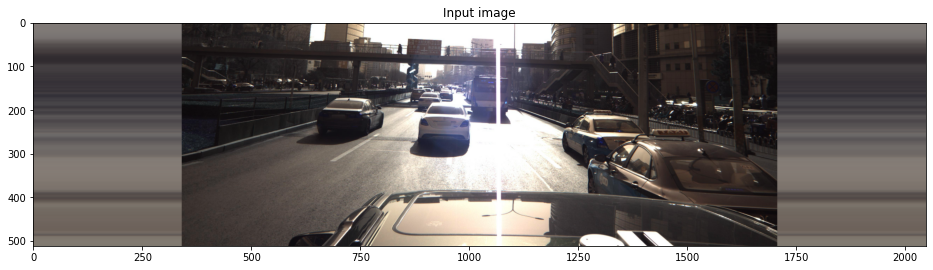

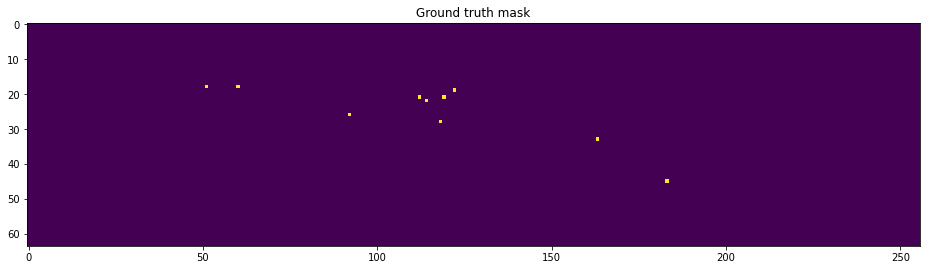

GT count: 10


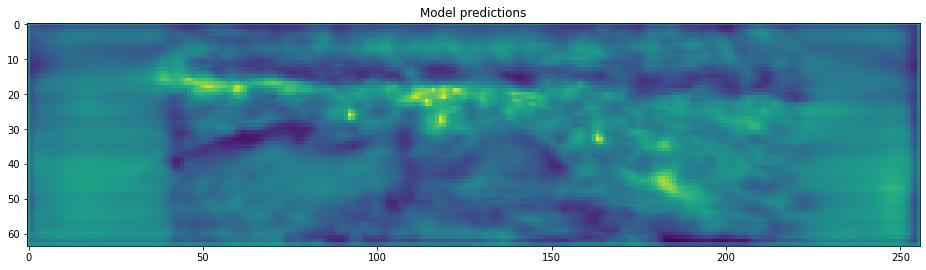

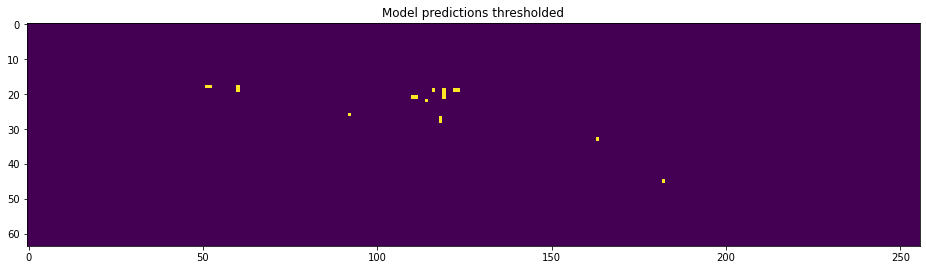

MP count: 18
(1, 64, 256)
idx: 7


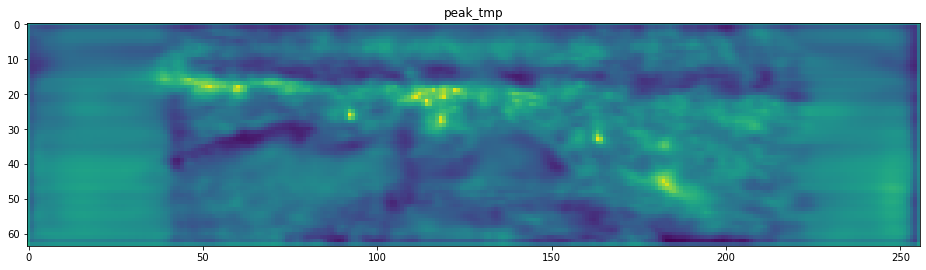

7


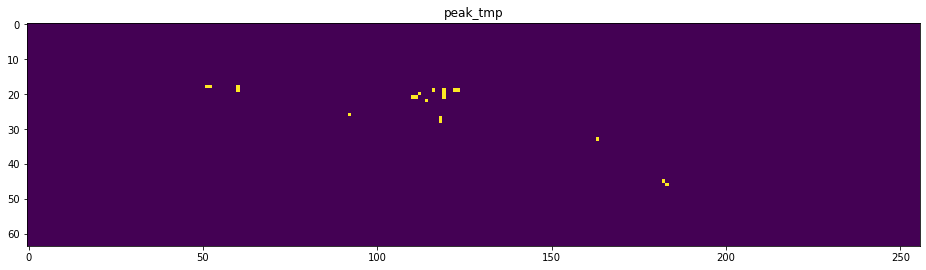

PEAK count: 20


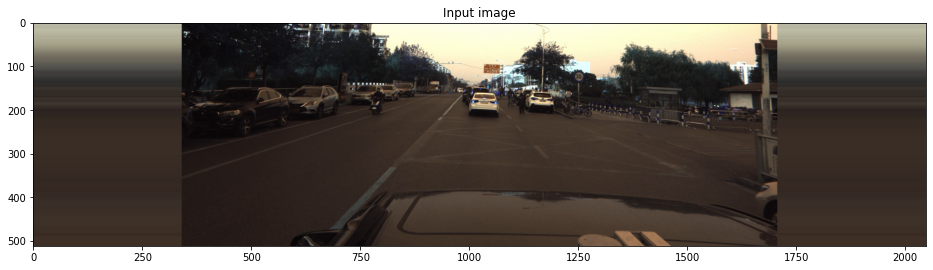

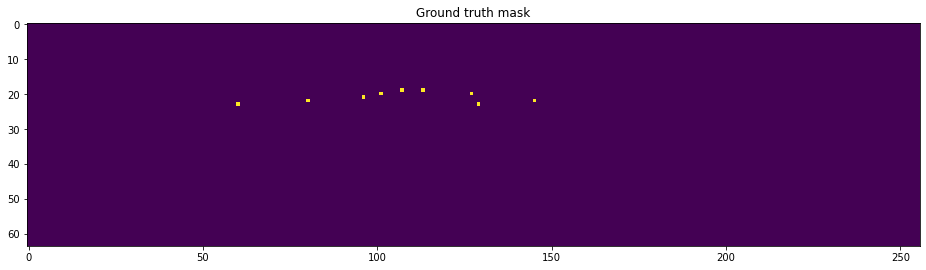

GT count: 9


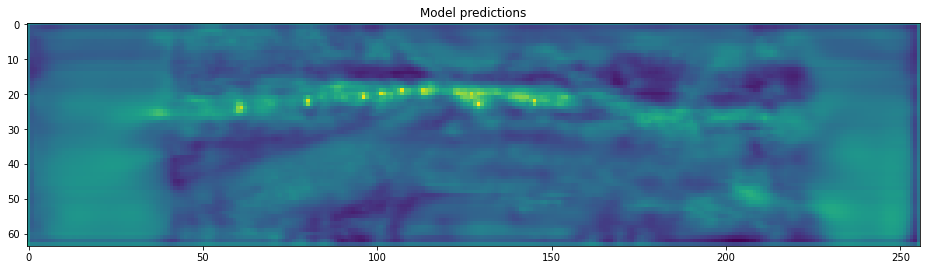

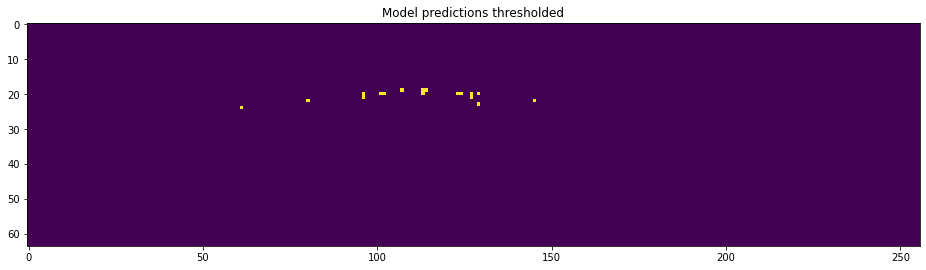

MP count: 17
(1, 64, 256)
idx: 6


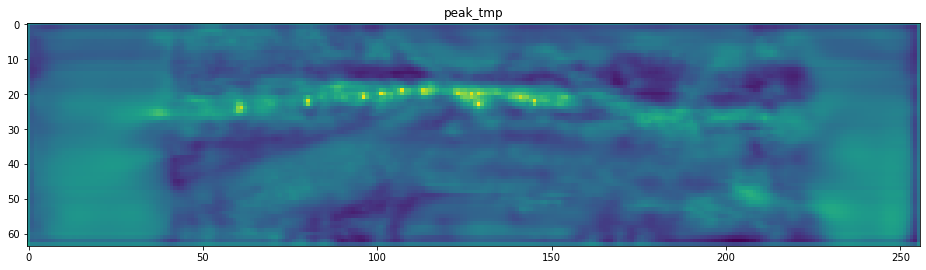

6


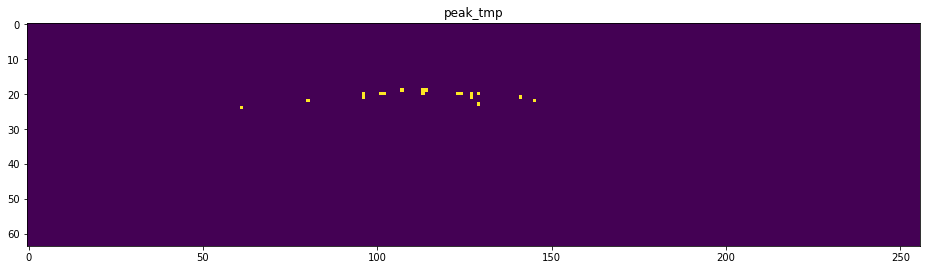

PEAK count: 18


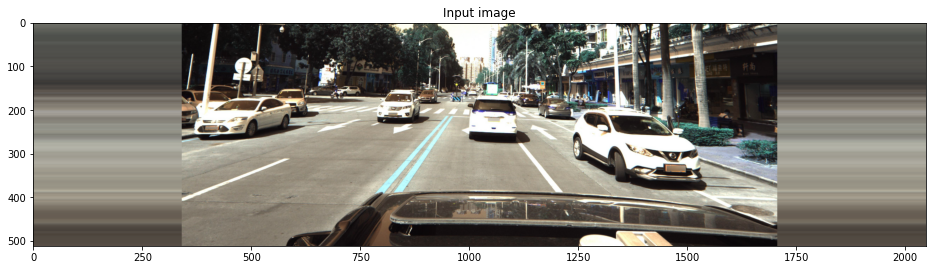

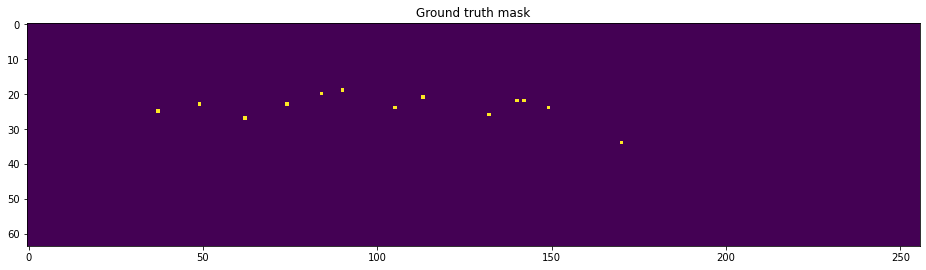

GT count: 13


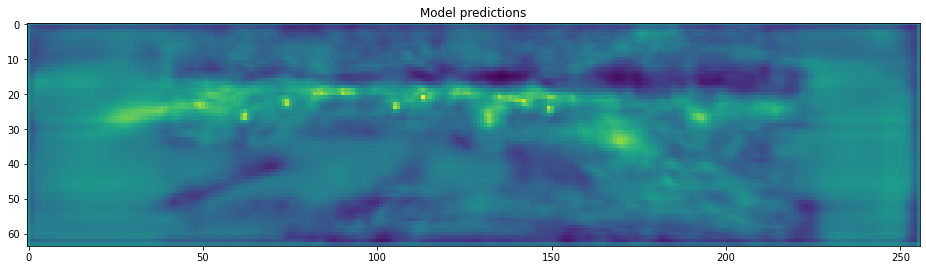

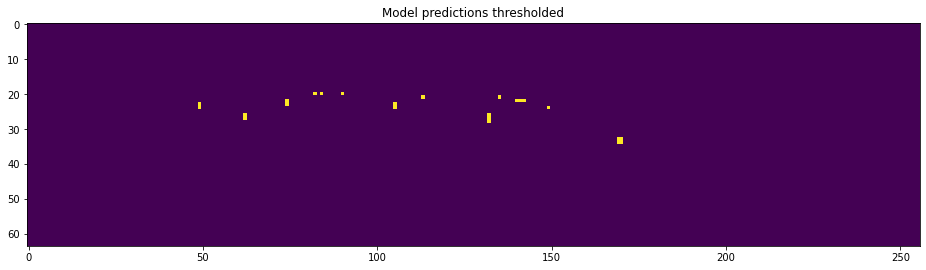

MP count: 24
(1, 64, 256)
idx: 6


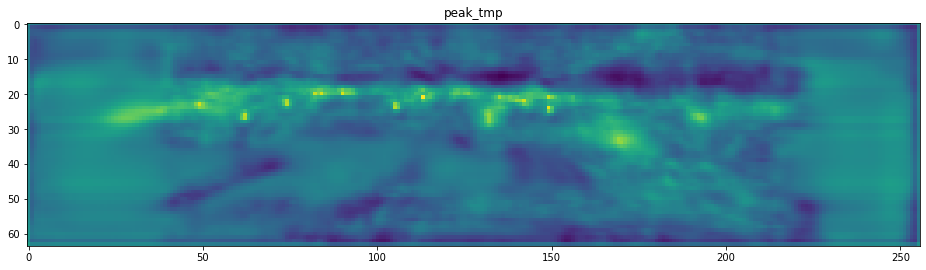

6


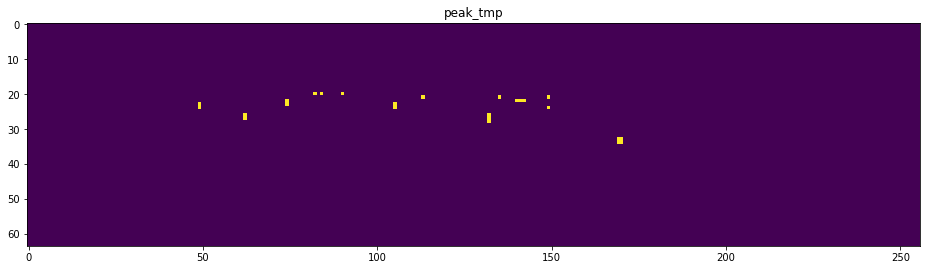

PEAK count: 25


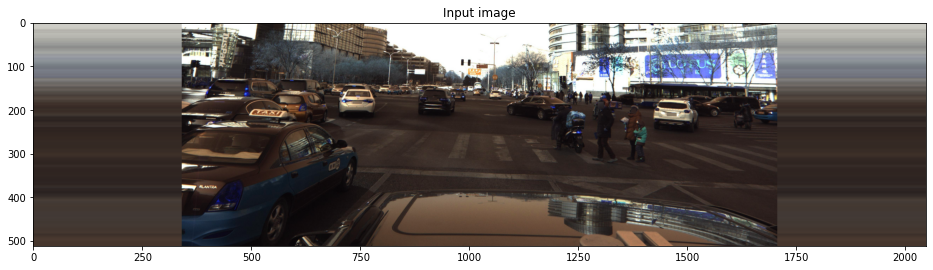

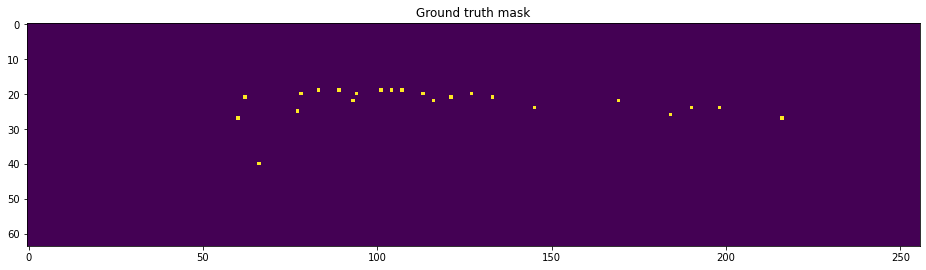

GT count: 23


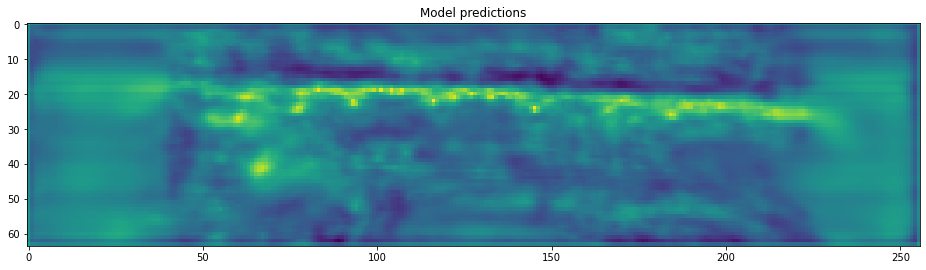

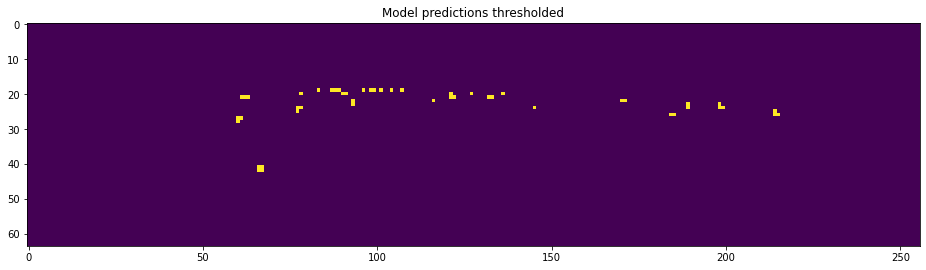

MP count: 49
(1, 64, 256)
idx: 5


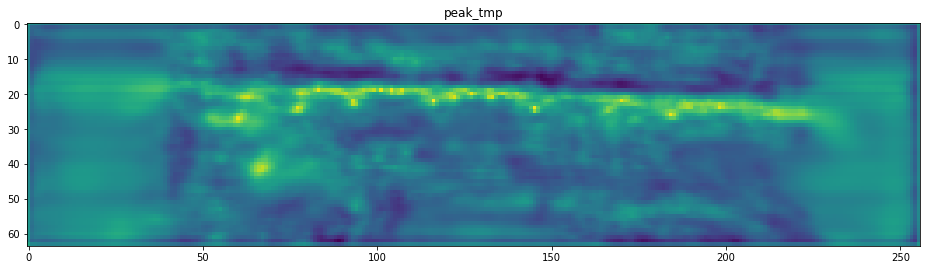

5


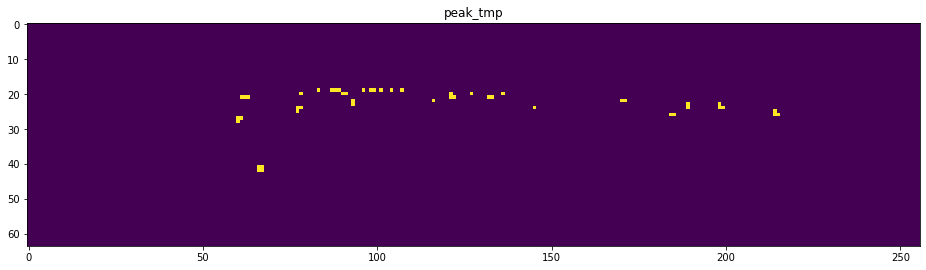

PEAK count: 49


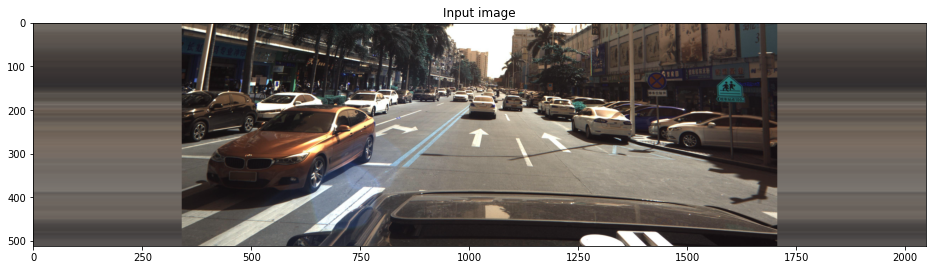

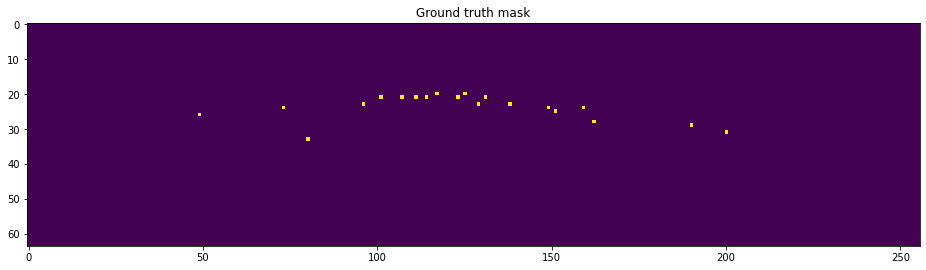

GT count: 20


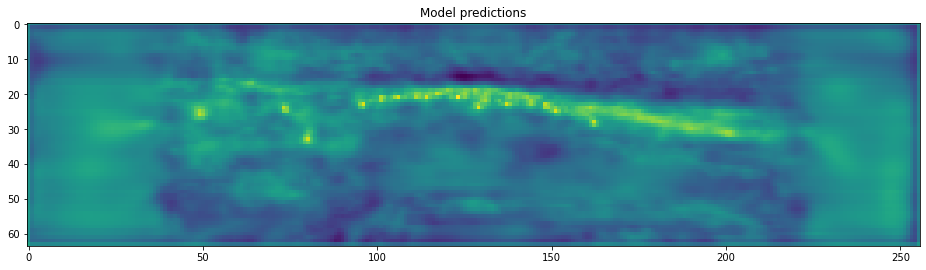

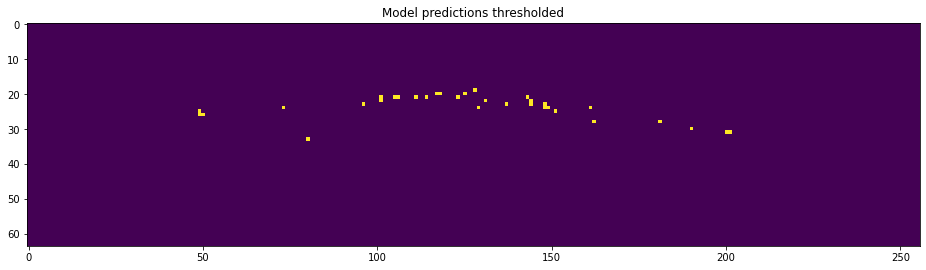

MP count: 33
(1, 64, 256)
idx: 6


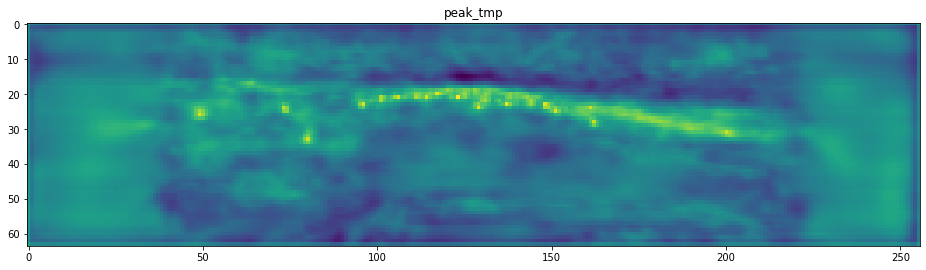

6


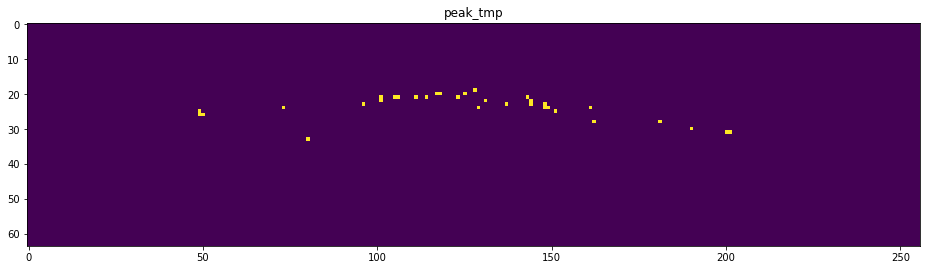

PEAK count: 33


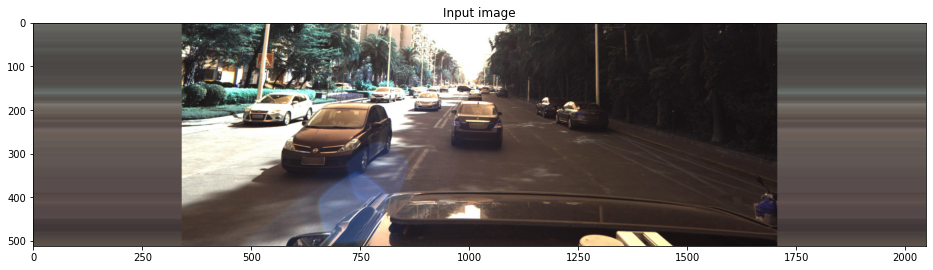

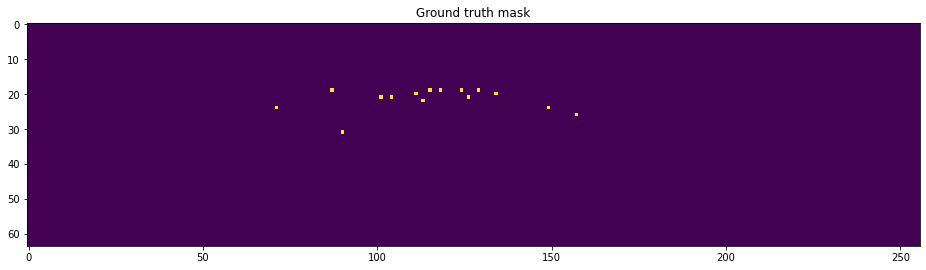

GT count: 15


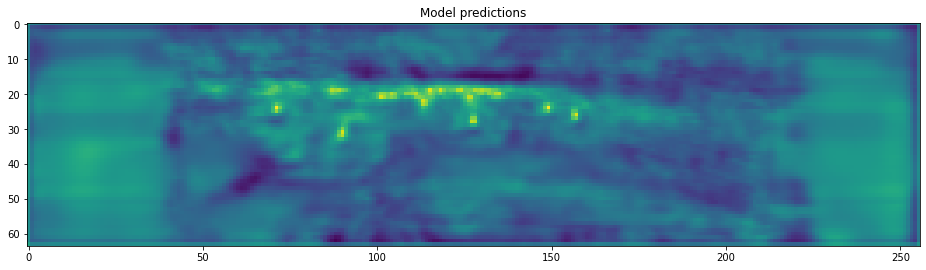

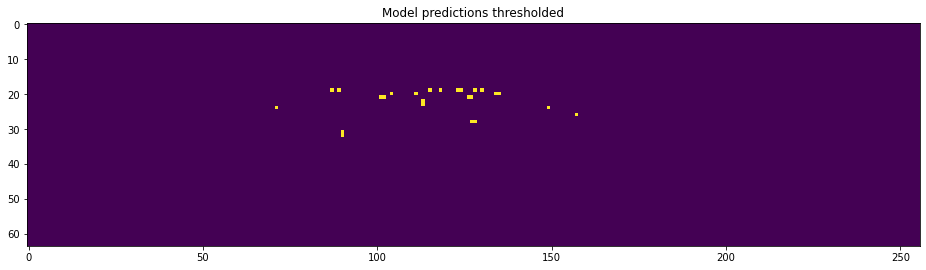

MP count: 25
(1, 64, 256)
idx: 5


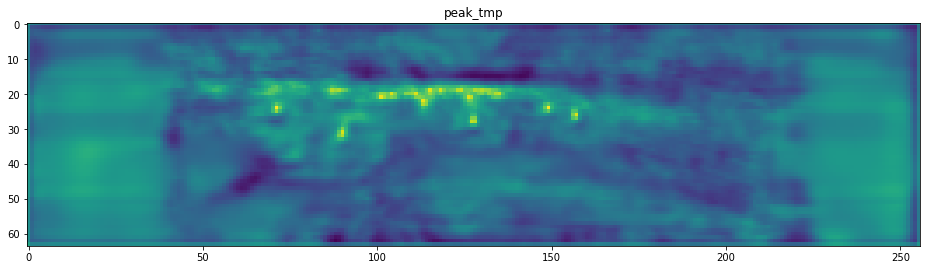

5


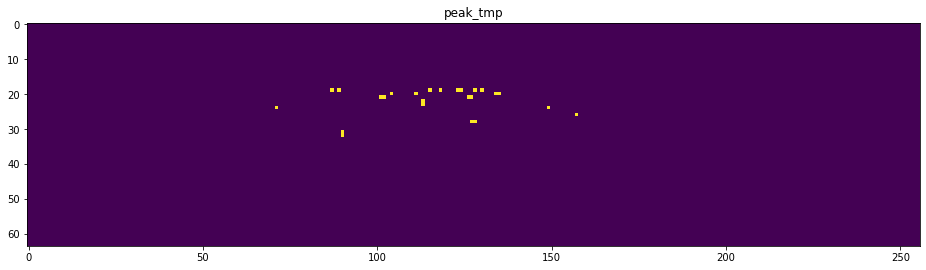

PEAK count: 25


In [390]:
for i in range(40,50):
    img, mask, regr = train_dataset[i]

    plt.figure(figsize=(16,16))
    plt.title('Input image')
    plt.imshow(np.rollaxis(img, 0, 3))
    plt.show()

    plt.figure(figsize=(16,16))
    plt.title('Ground truth mask')
    plt.imshow(mask)
    plt.show()
    print("GT count:", np.sum(mask>0))

    output = model(torch.tensor(img[None]).to(device))
    output = output[0]['hm']
    logits = output[0,0].data.cpu().numpy()

    plt.figure(figsize=(16,16))
    plt.title('Model predictions')
    plt.imshow(logits)
    plt.show()
    
    

    plt.figure(figsize=(16,16))
    plt.title('Model predictions thresholded')
    plt.imshow(logits>-2)
    plt.show()
    print("MP count:", np.sum(logits>-2))
    
    img, idx = peak_tmp(logits[None],threshold1,threshold2)
    print('idx:',idx)
    plt.figure(figsize=(16,16))
    plt.title('peak_tmp')
    plt.imshow(img)
    plt.show()
    
    print(idx)
    plt.figure(figsize=(16,16))
    plt.title('peak_tmp')
    plt.imshow(img>-2)
    plt.show()
    print("PEAK count:", np.sum(img>-2))

# Make submission

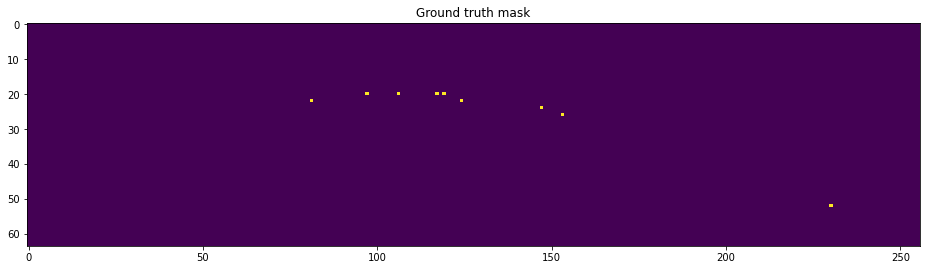

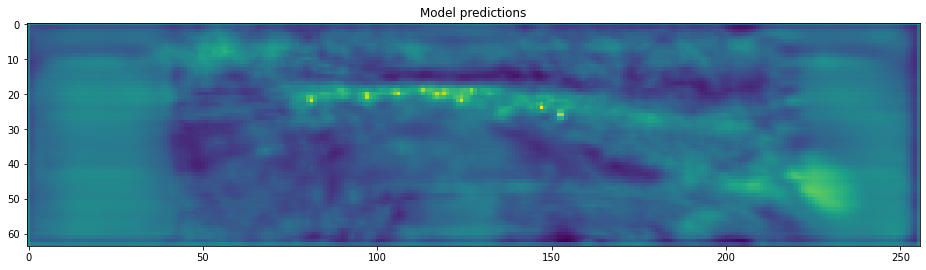

(1, 64, 256)
3


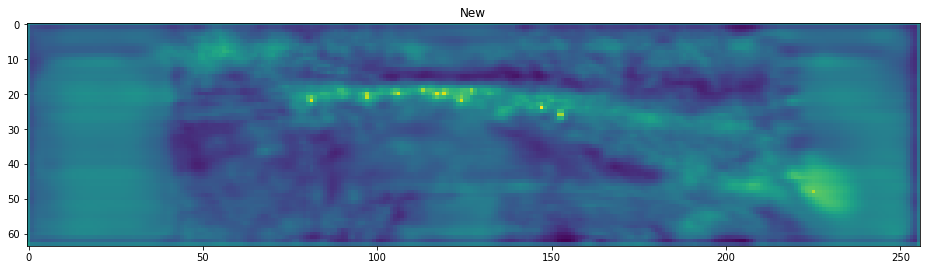

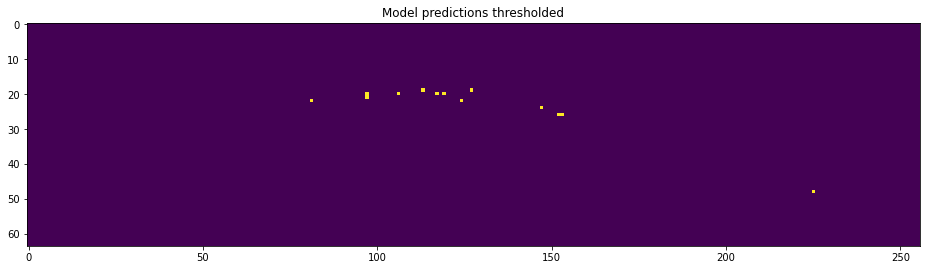

3


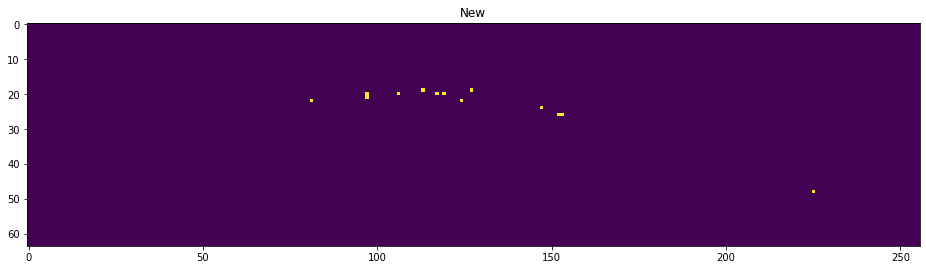

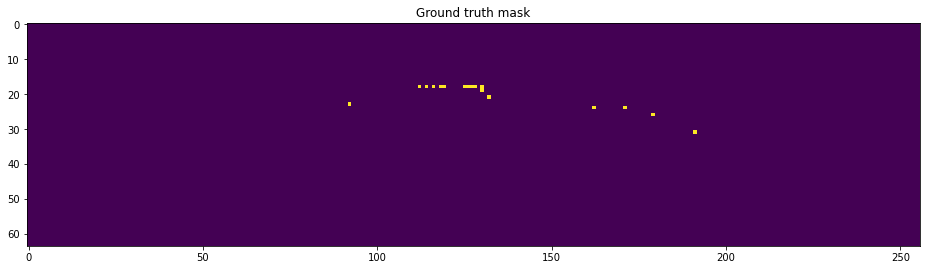

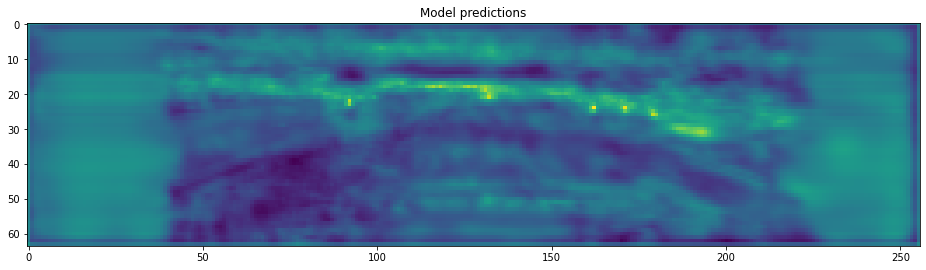

(1, 64, 256)
3


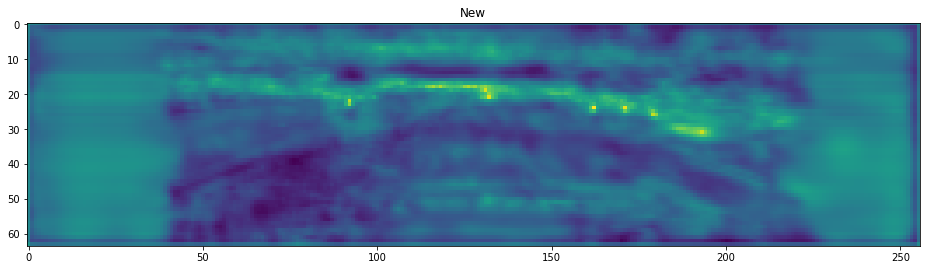

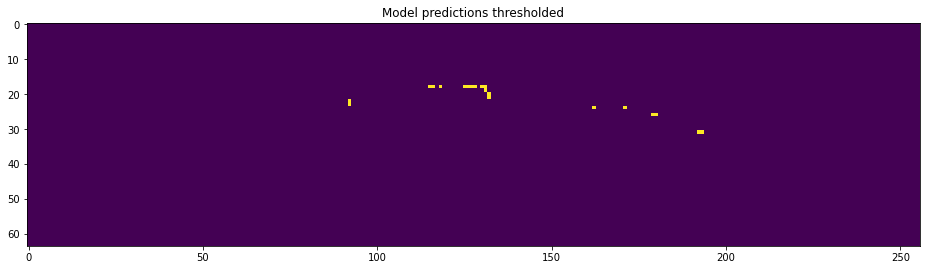

3


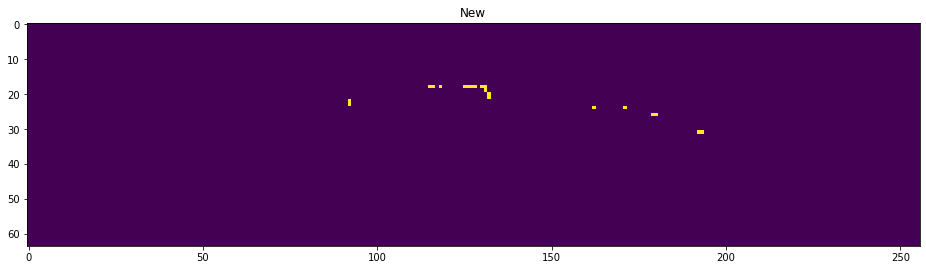

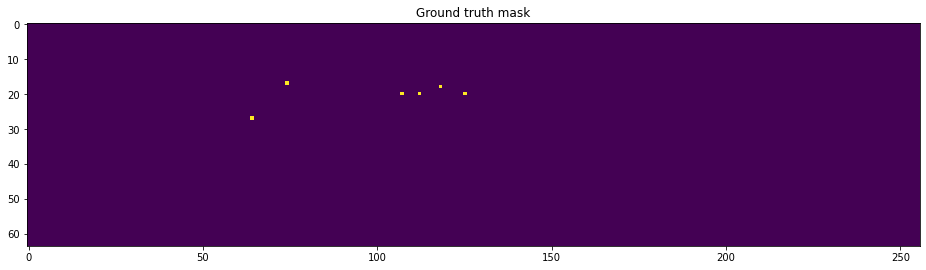

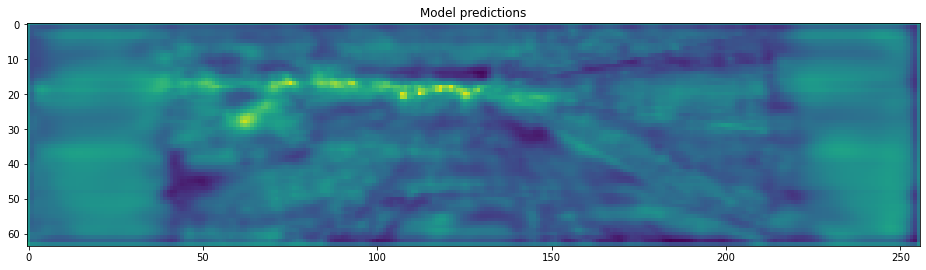

(1, 64, 256)
6


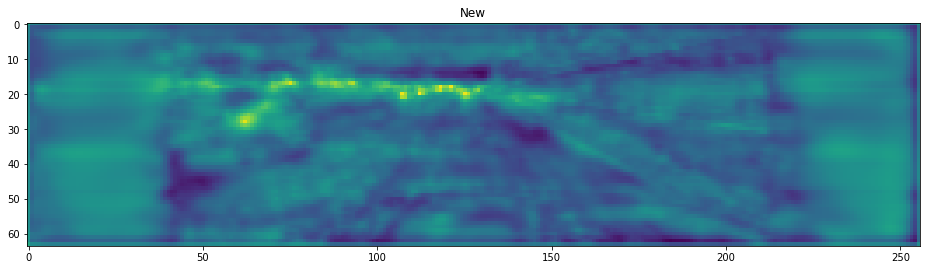

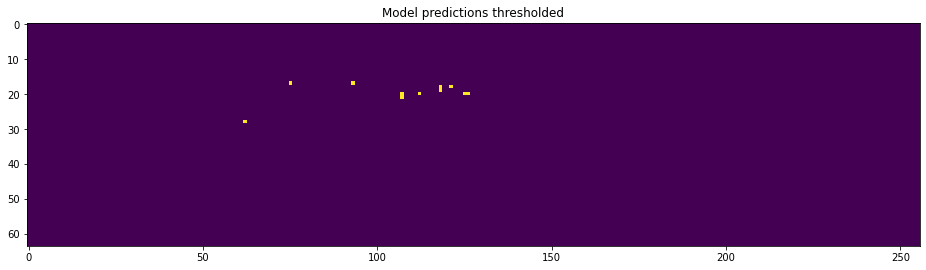

6


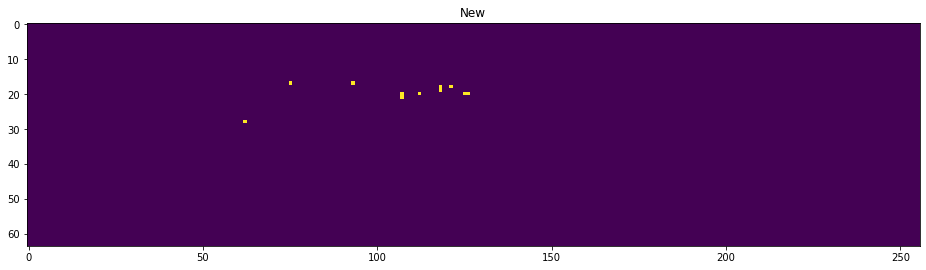

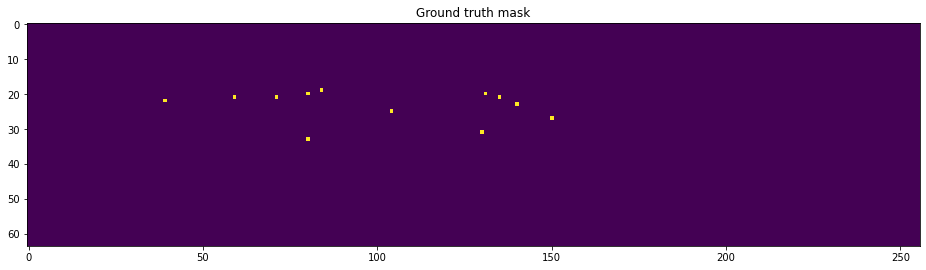

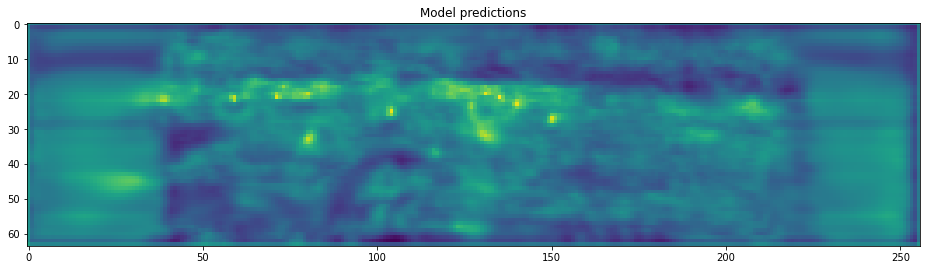

(1, 64, 256)
9


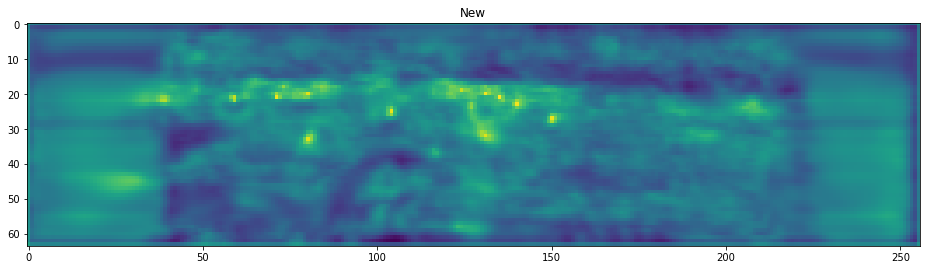

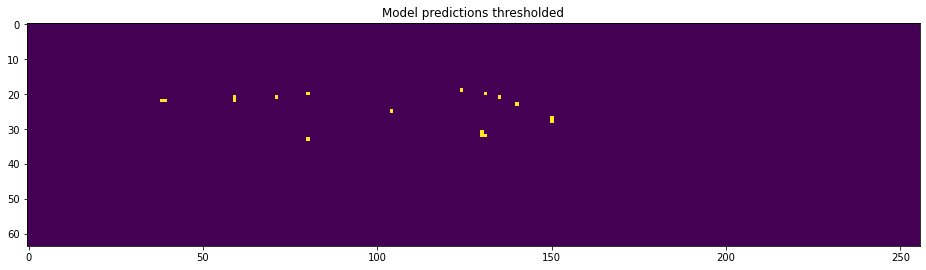

9


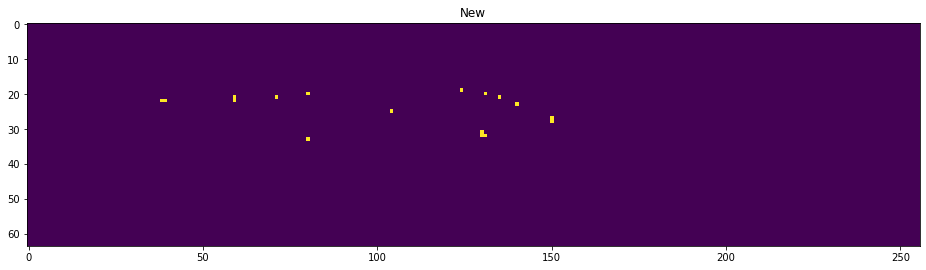

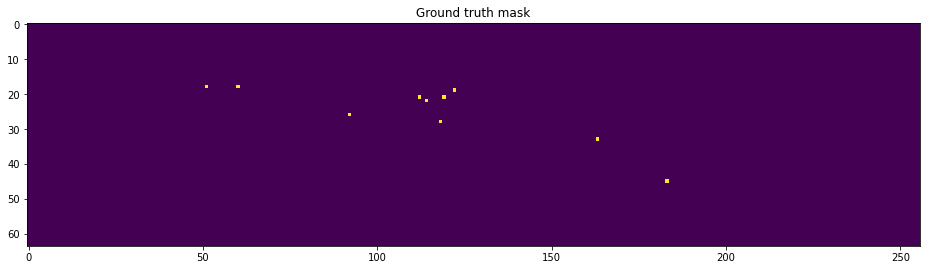

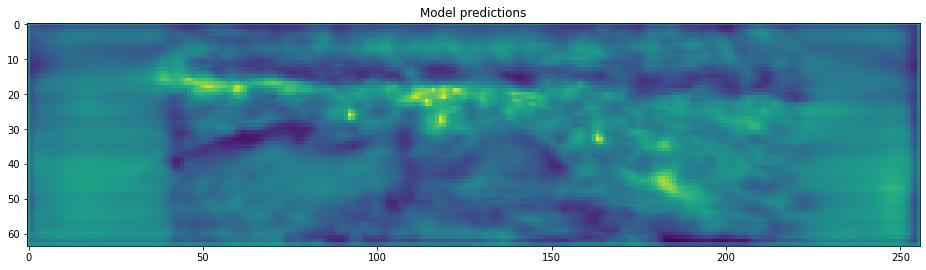

(1, 64, 256)
7


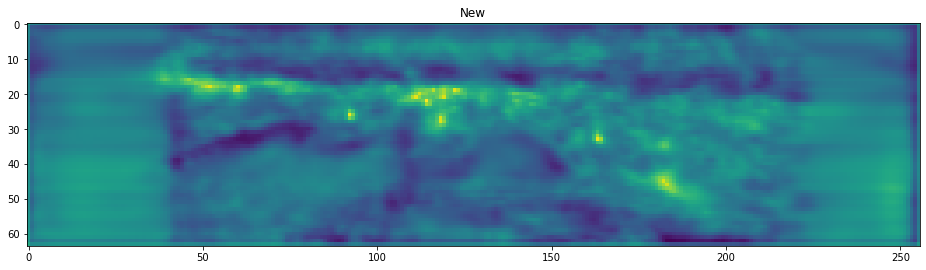

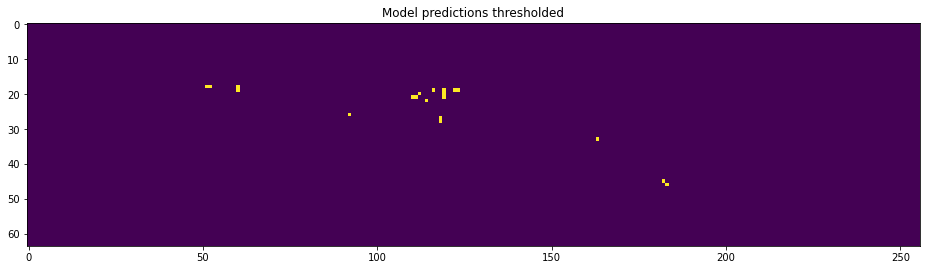

7


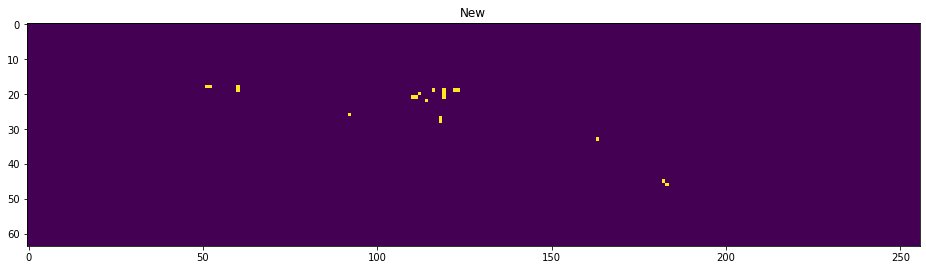

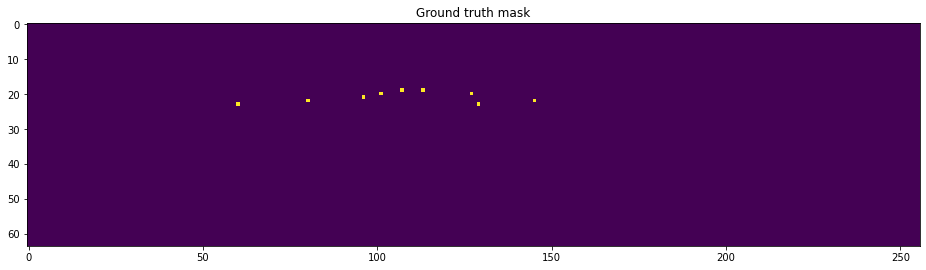

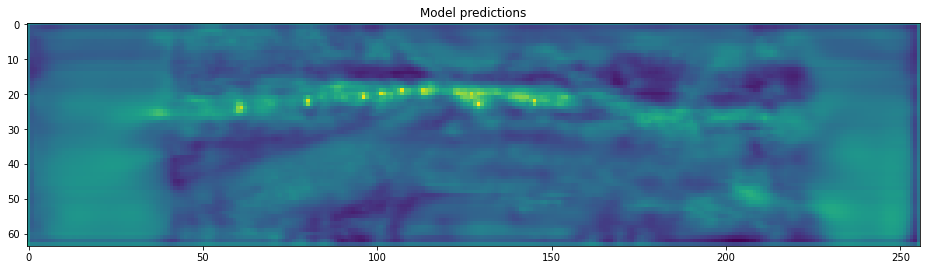

(1, 64, 256)
6


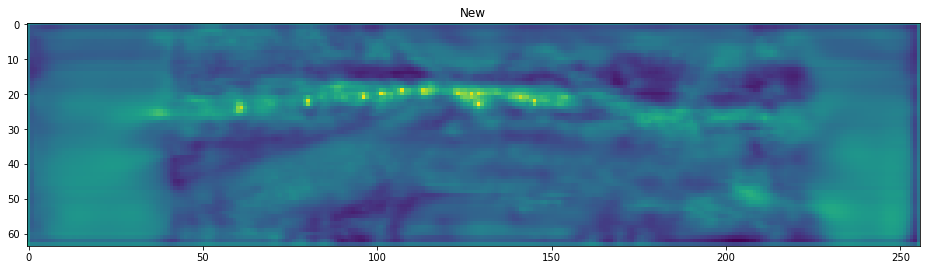

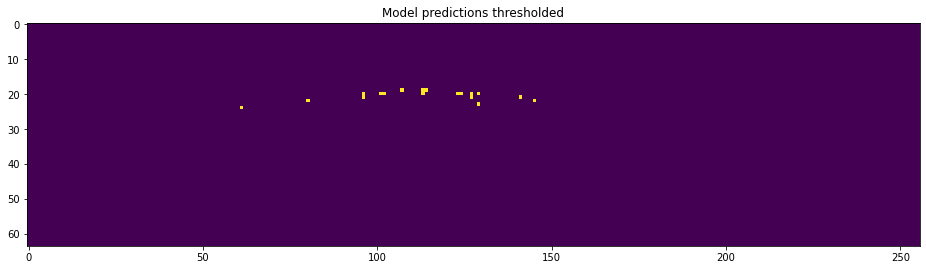

6


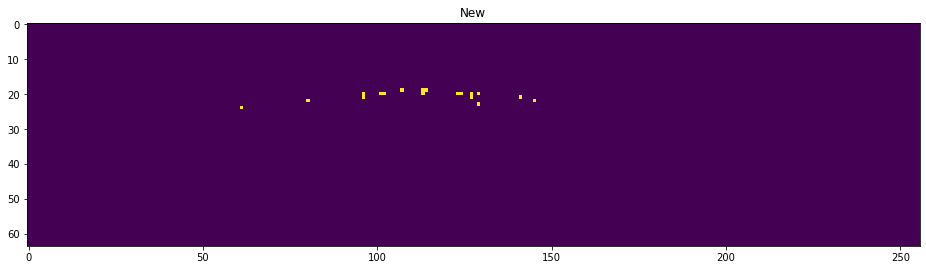

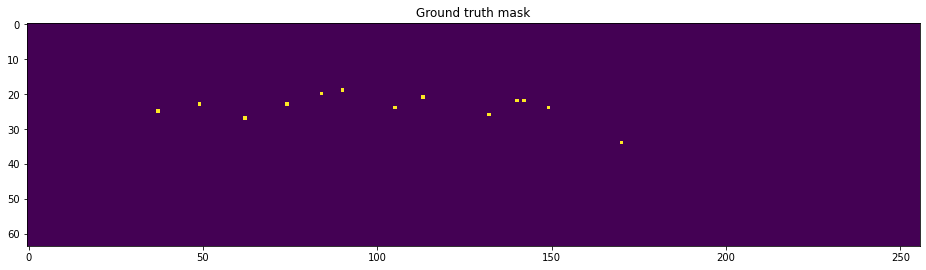

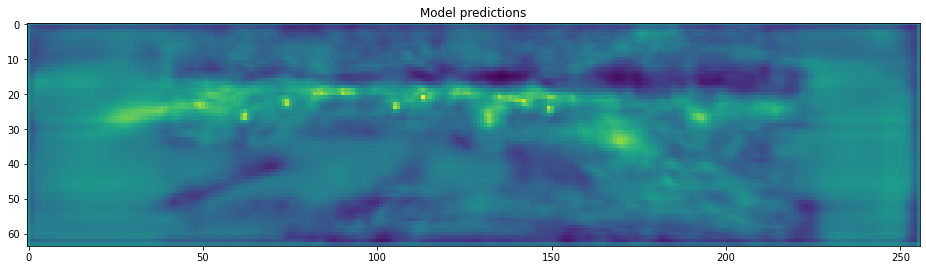

(1, 64, 256)
6


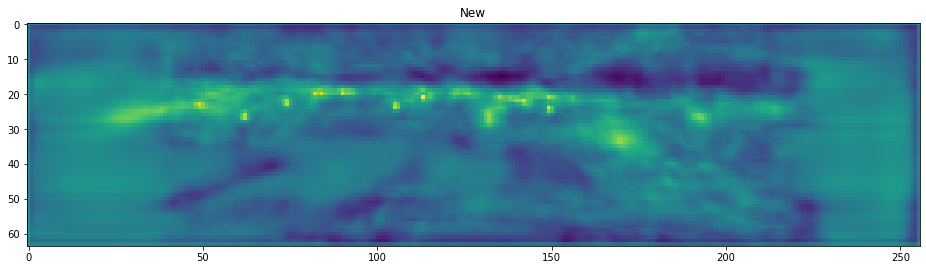

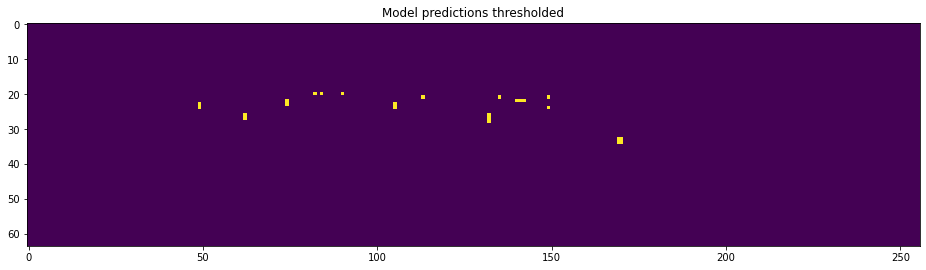

6


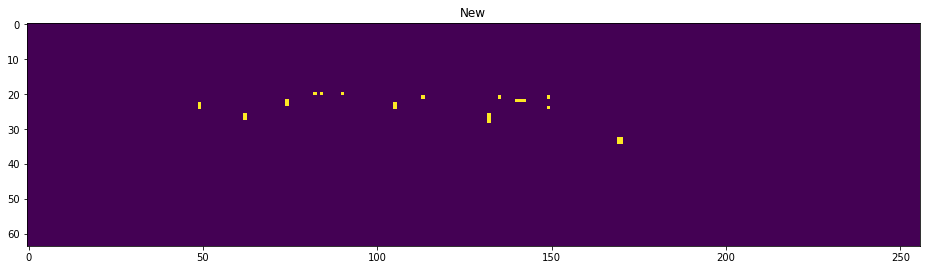

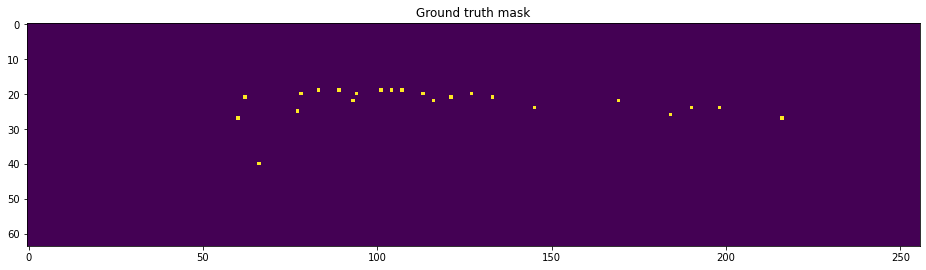

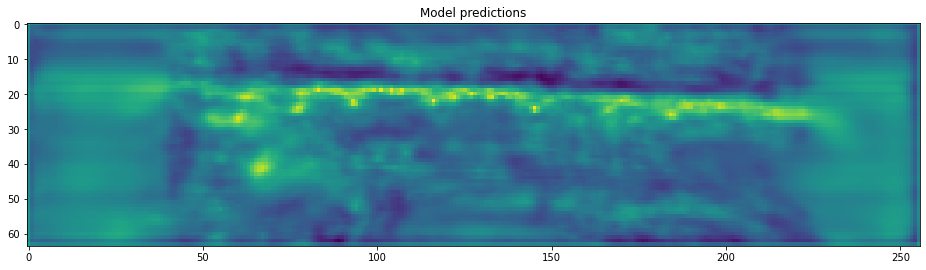

(1, 64, 256)
5


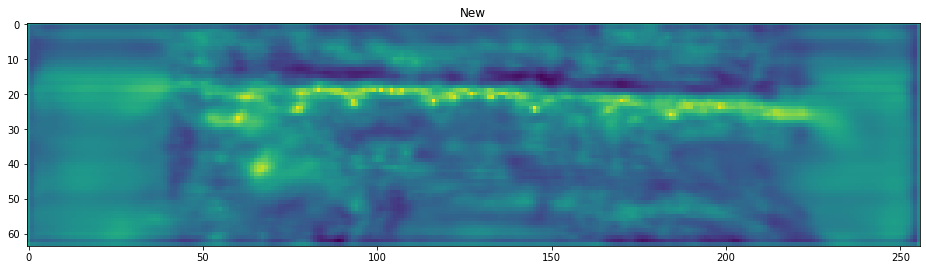

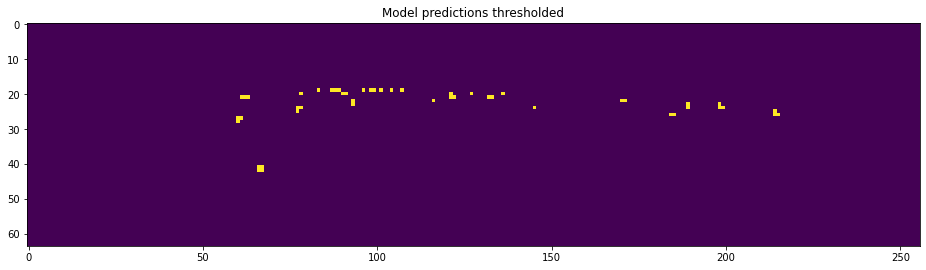

5


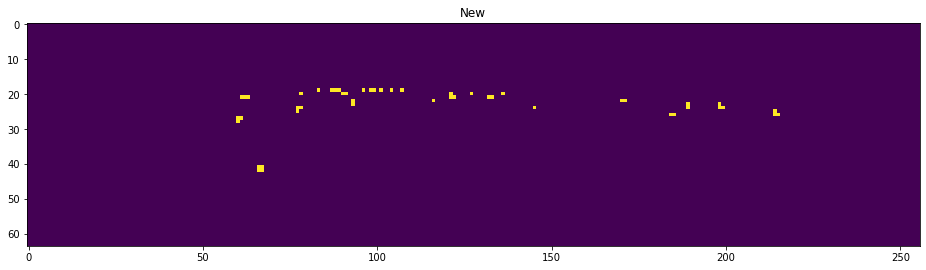

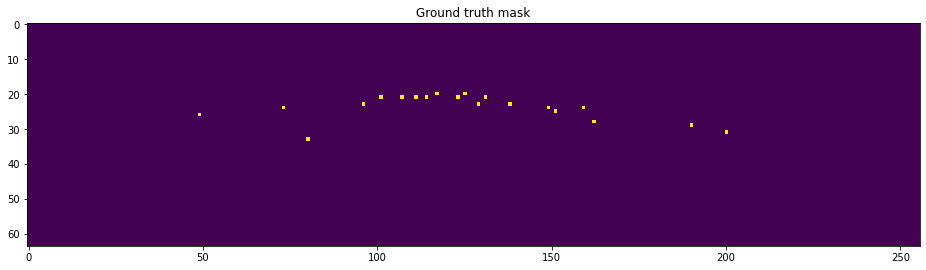

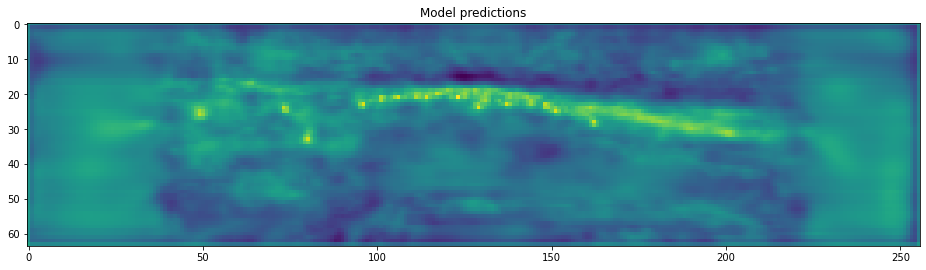

(1, 64, 256)
6


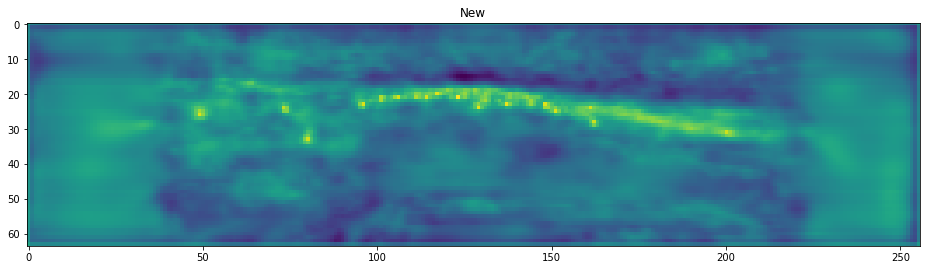

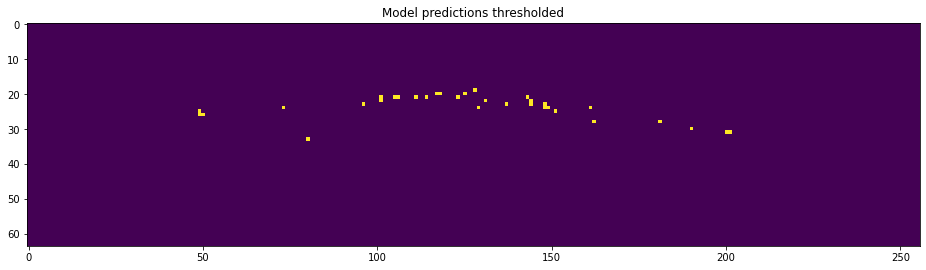

6


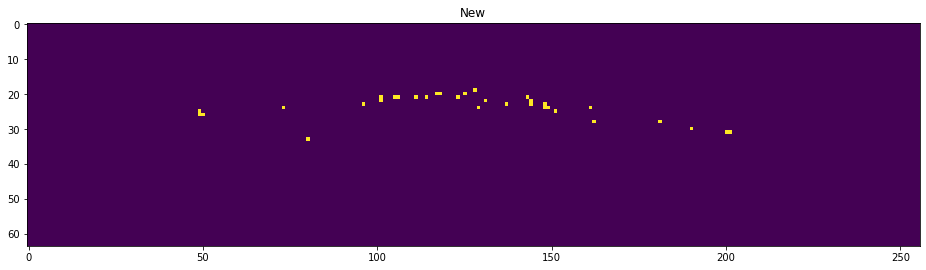

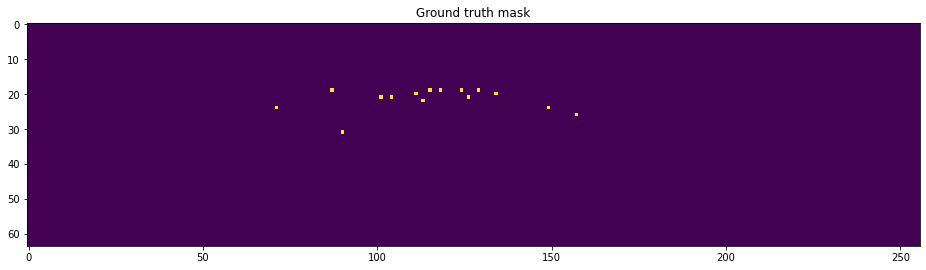

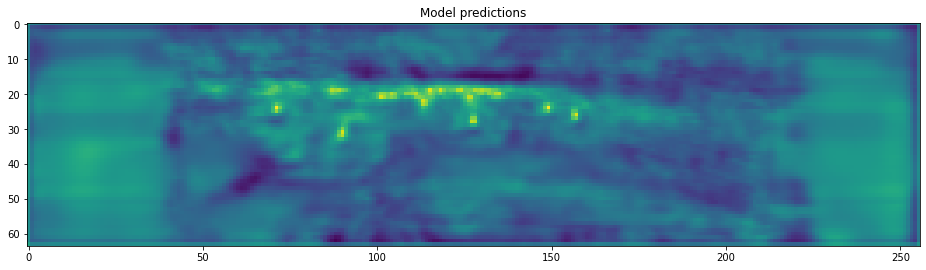

(1, 64, 256)
5


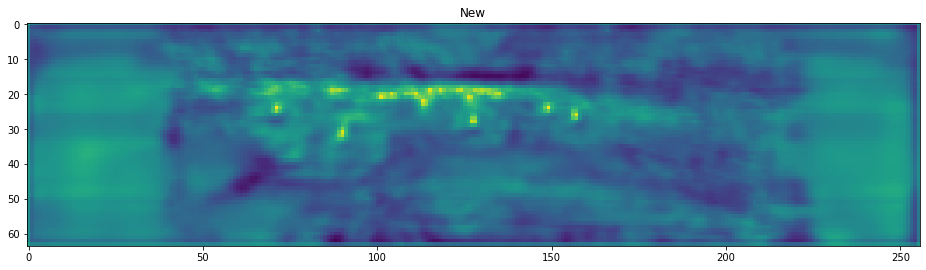

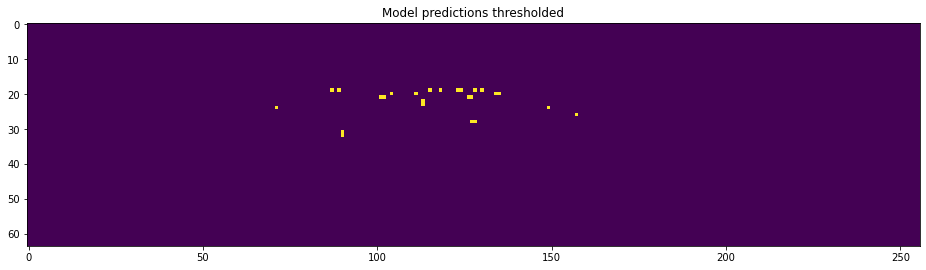

5


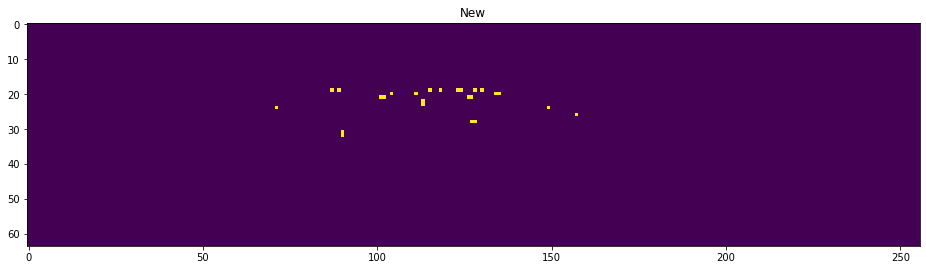

In [389]:
for i in range(40,50):
    img, mask, regr = train_dataset[i]

    #plt.figure(figsize=(16,16))
    #plt.title('Input image')
    #plt.imshow(np.rollaxis(img, 0, 3))
    #plt.show()

    plt.figure(figsize=(16,16))
    plt.title('Ground truth mask')
    plt.imshow(mask)
    plt.show()

    output = model(torch.tensor(img[None]).to(device))
    output = output[0]['hm']
    logits = output[0,0].data.cpu().numpy()

    plt.figure(figsize=(16,16))
    plt.title('Model predictions')
    plt.imshow(logits)
    plt.show()

    img, idx = peak_tmp(logits[None],threshold1,threshold2)
    print(idx)
    plt.figure(figsize=(16,16))
    plt.title('New')
    plt.imshow(img)
    plt.show()

    
    plt.figure(figsize=(16,16))
    plt.title('Model predictions thresholded')
    plt.imshow(logits>-2)
    plt.show()    

    print(idx)
    plt.figure(figsize=(16,16))
    plt.title('New')
    plt.imshow(img>-2)
    plt.show()

In [381]:
def show_coords(prediction, threshold1, threshold2):
    logits = peak_tmp(prediction, threshold1, threshold2) #peak_tmp(prediction, threshold1, threshold2) #peak(prediction[0], threshold1, threshold2)#prediction[0]#peak(prediction[0], threshold1, threshold2)##peak(prediction[0], threshold1, threshold2)
    plt.figure(figsize=(12, 8))
    plt.imshow(logits)
    plt.show()
    
    regr_output = prediction[1:]
    plt.figure(figsize=(12, 8))
    plt.imshow(logits > threshold1)
    plt.show()

















  0%|          | 0/506 [00:00<?, ?it/s]

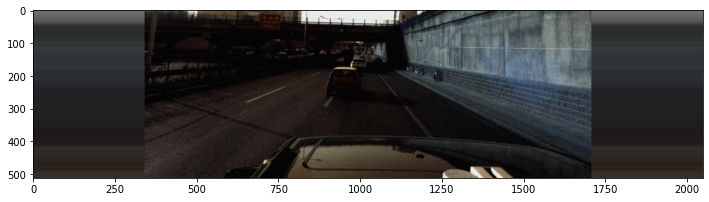

  0%|          | 0/506 [00:02<?, ?it/s]


TypeError: gt() received an invalid combination of arguments - got (numpy.float32), but expected one of:
 * (Tensor other)
      didn't match because some of the arguments have invalid types: ([31;1mnumpy.float32[0m)
 * (Number other)
      didn't match because some of the arguments have invalid types: ([31;1mnumpy.float32[0m)


In [382]:
predictions = []

test_loader = DataLoader(dataset=test_dataset, batch_size=4, shuffle=False, num_workers=4)
model.eval()

for img, _, _ in tqdm(test_loader):
    
    plt.figure(figsize=(12, 8))
    plt.imshow(np.einsum('ijk->jki', img[0]))
    plt.show()
    
    with torch.no_grad():
        output = model(img.to(device))
    output = output[0]['hm']
    show_coords(output[0],threshold1, threshold2)
        















  0%|          | 0/506 [00:00<?, ?it/s]

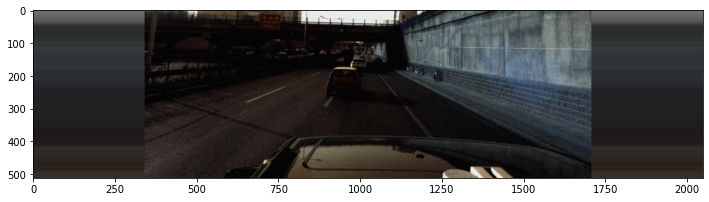

TypeError: gt() received an invalid combination of arguments - got (numpy.float32), but expected one of:
 * (Tensor other)
      didn't match because some of the arguments have invalid types: ([31;1mnumpy.float32[0m)
 * (Number other)
      didn't match because some of the arguments have invalid types: ([31;1mnumpy.float32[0m)


In [378]:
predictions = []

test_loader = DataLoader(dataset=test_dataset, batch_size=4, shuffle=False, num_workers=4)
model.eval()

for img, _, _ in tqdm(test_loader):
    
    plt.figure(figsize=(12, 8))
    plt.imshow(np.einsum('ijk->jki', img[0]))
    plt.show()
    
    with torch.no_grad():
        output = model(img.to(device))
    output = output[0]['hm']
    show_coords(output[0],threshold1, threshold2)
        











  0%|          | 0/506 [00:00<?, ?it/s]

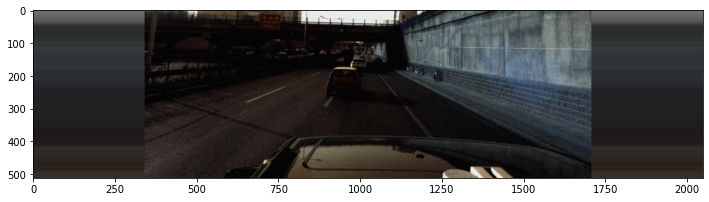

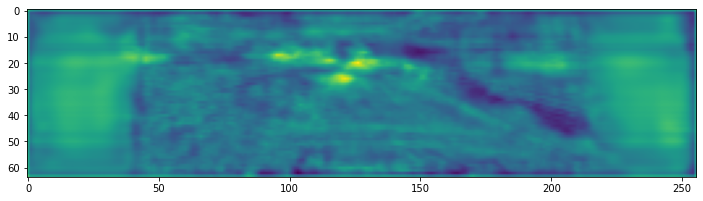

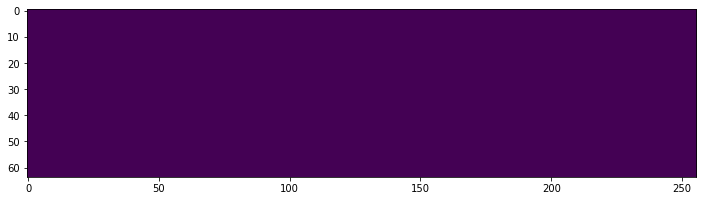











  0%|          | 1/506 [00:02<20:16,  2.41s/it]

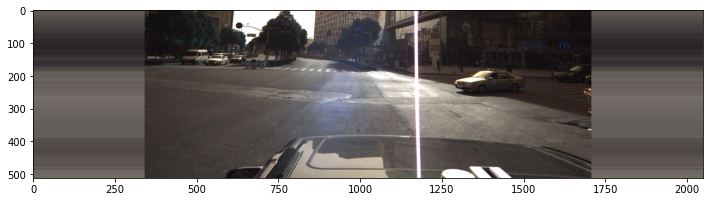

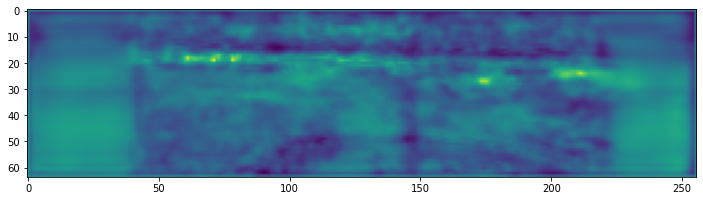

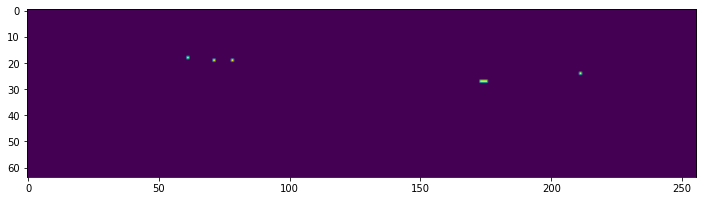











  0%|          | 2/506 [00:03<16:31,  1.97s/it]

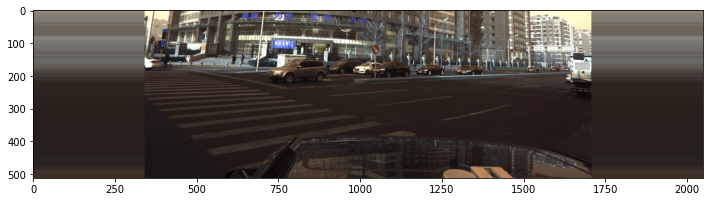

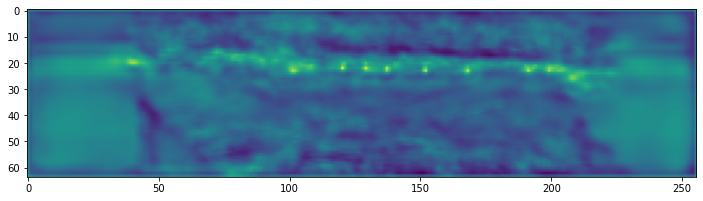

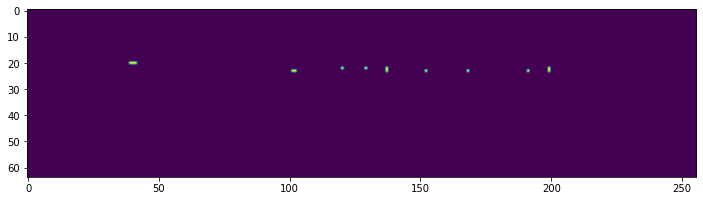











  1%|          | 3/506 [00:04<13:31,  1.61s/it]

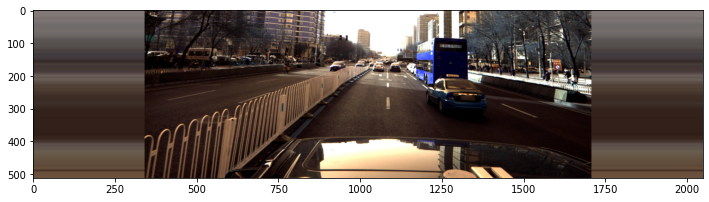

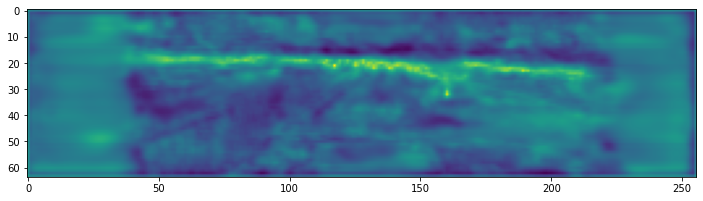

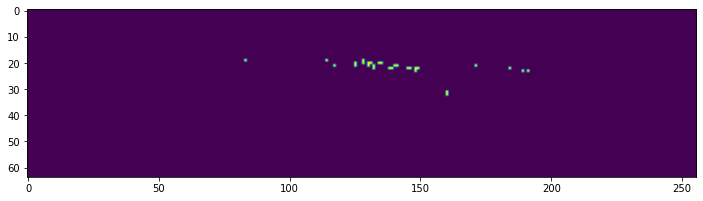











  1%|          | 4/506 [00:04<11:35,  1.39s/it]

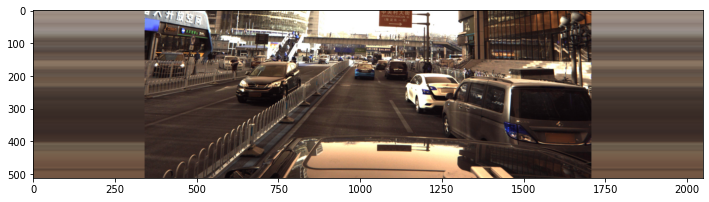

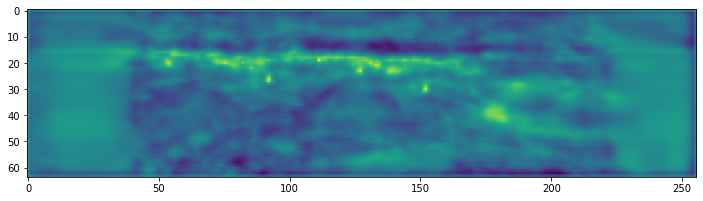

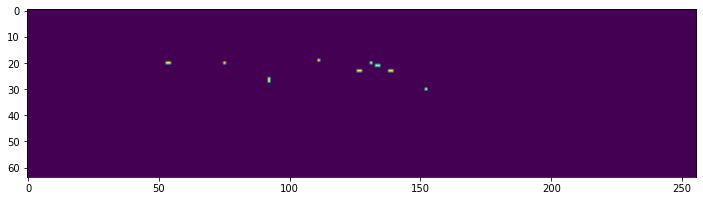











  1%|          | 5/506 [00:05<10:11,  1.22s/it]

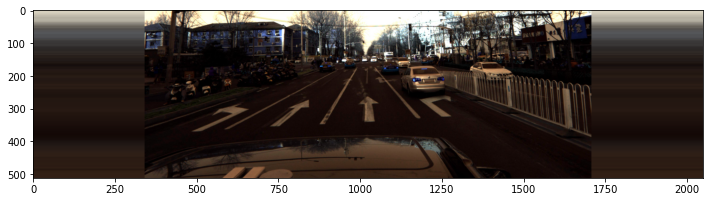

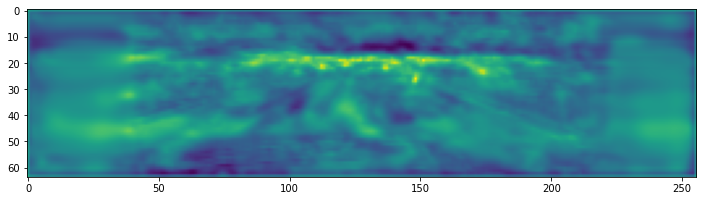

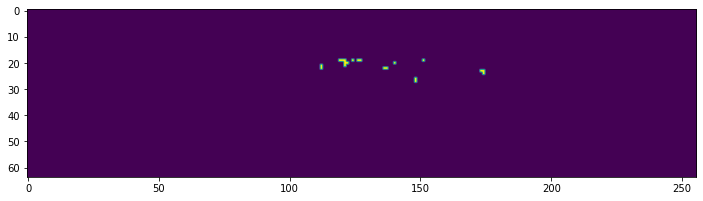











  1%|          | 6/506 [00:06<09:34,  1.15s/it]

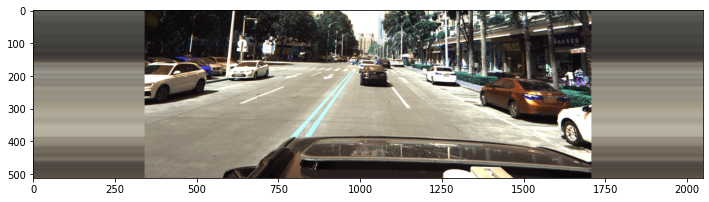

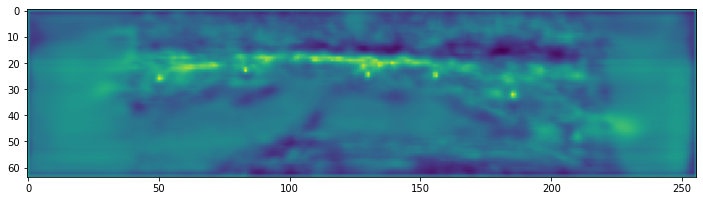

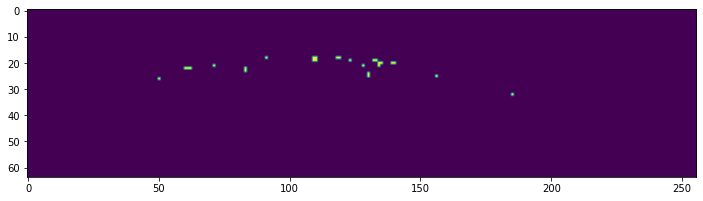











  1%|▏         | 7/506 [00:07<08:54,  1.07s/it]

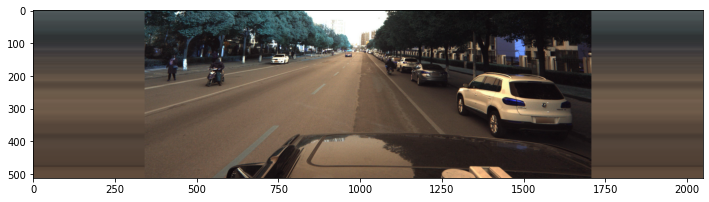

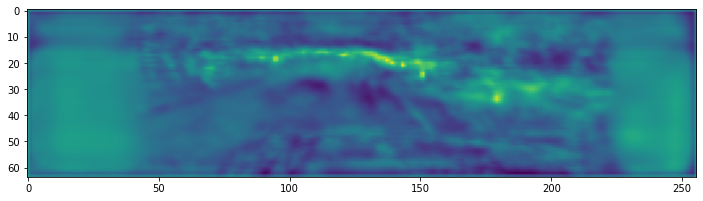

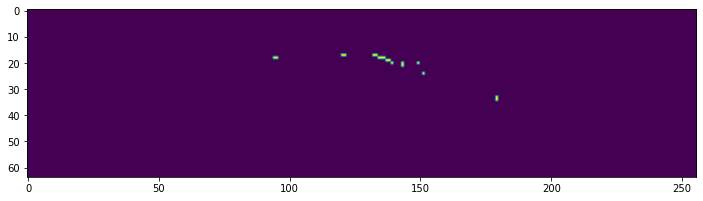











  2%|▏         | 8/506 [00:08<08:24,  1.01s/it]

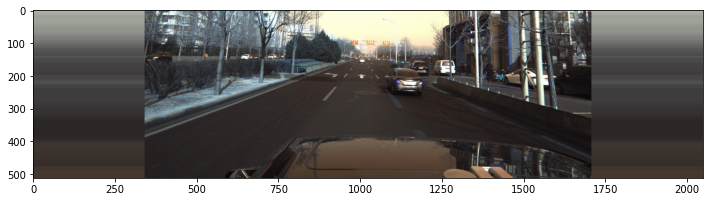

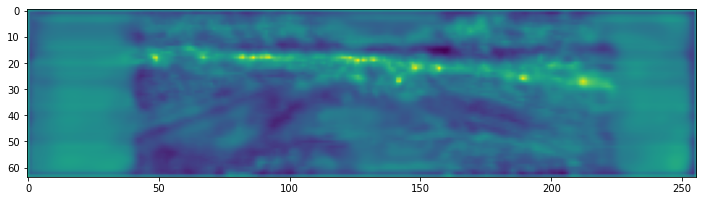

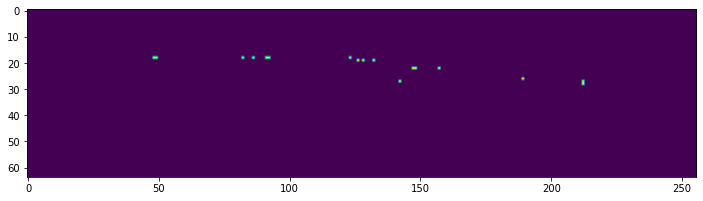











  2%|▏         | 9/506 [00:09<08:02,  1.03it/s]

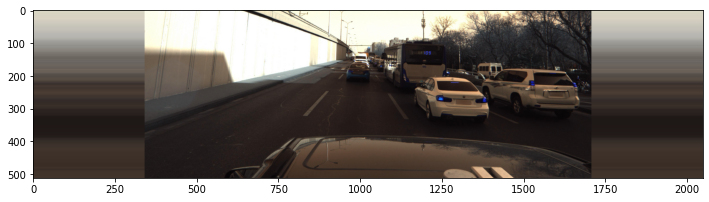

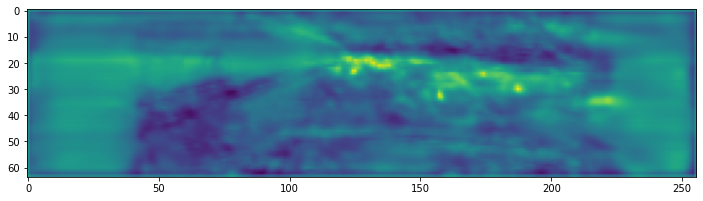

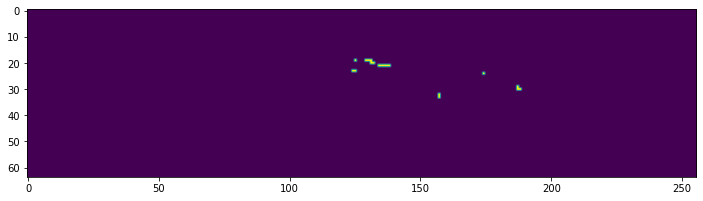











  2%|▏         | 10/506 [00:10<07:36,  1.09it/s]

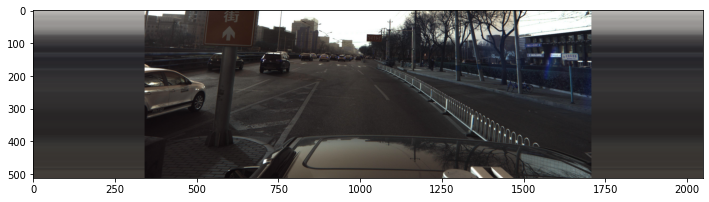

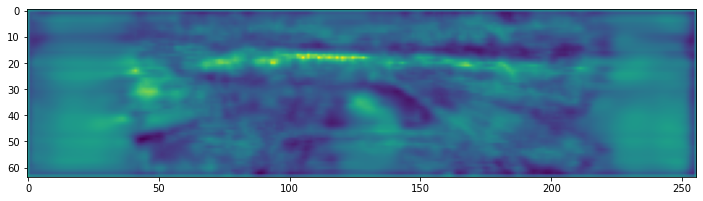

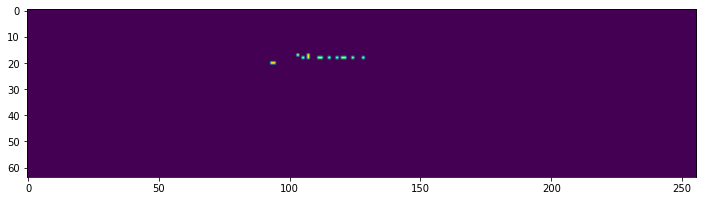











  2%|▏         | 11/506 [00:11<07:13,  1.14it/s]

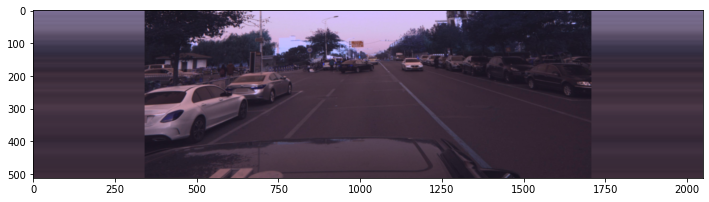

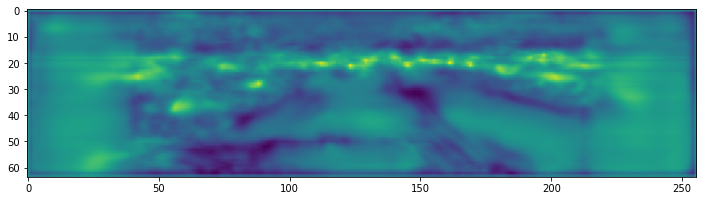

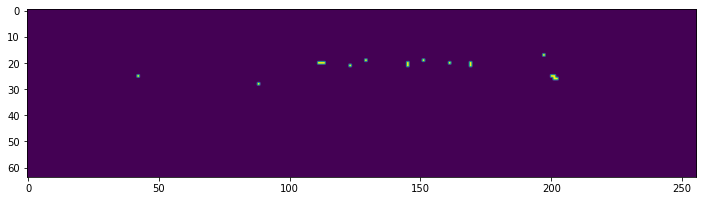











  2%|▏         | 12/506 [00:11<07:05,  1.16it/s]

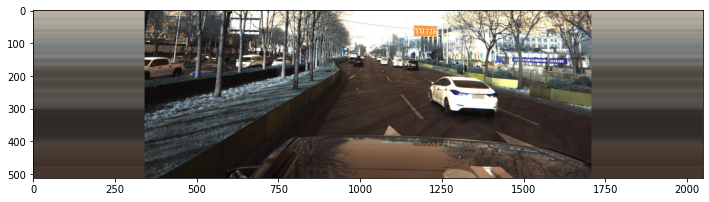

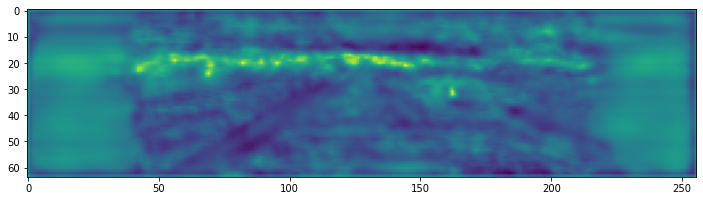

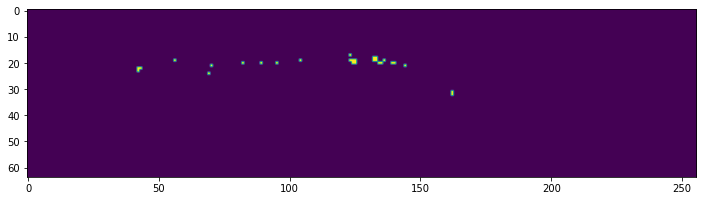











  3%|▎         | 13/506 [00:12<06:56,  1.18it/s]

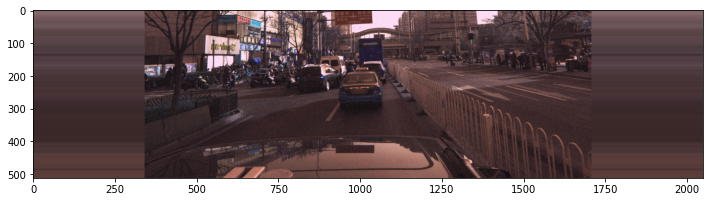

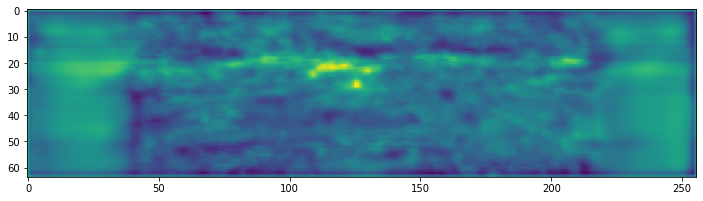

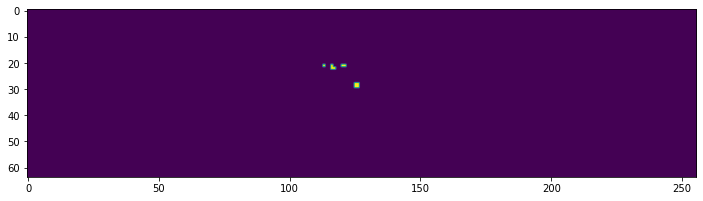











  3%|▎         | 14/506 [00:13<07:04,  1.16it/s]

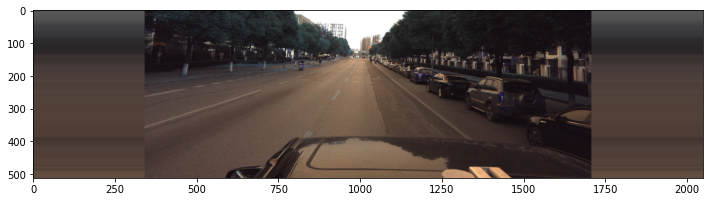

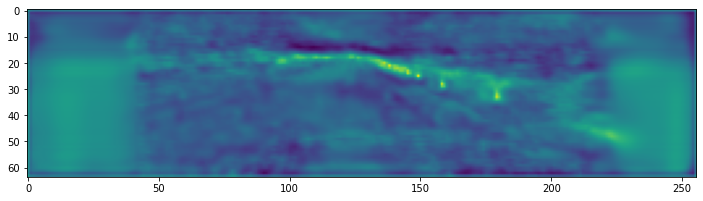

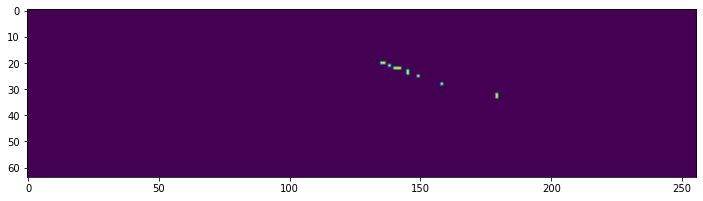











  3%|▎         | 15/506 [00:14<07:20,  1.11it/s]

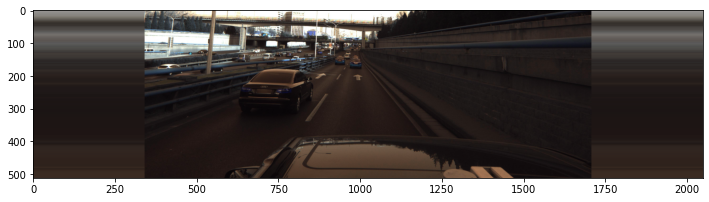

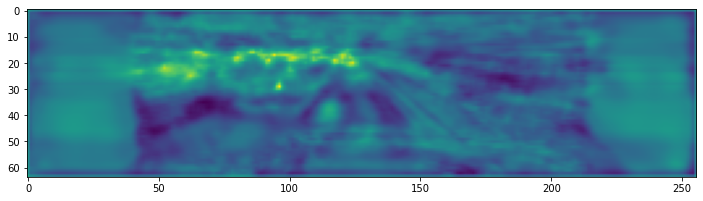

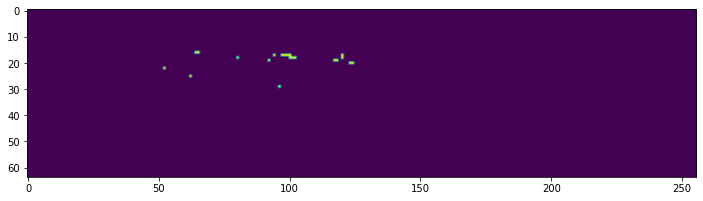











  3%|▎         | 16/506 [00:15<07:17,  1.12it/s]

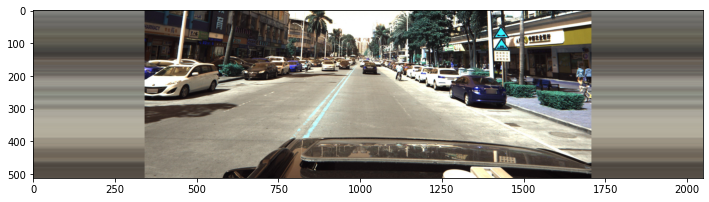

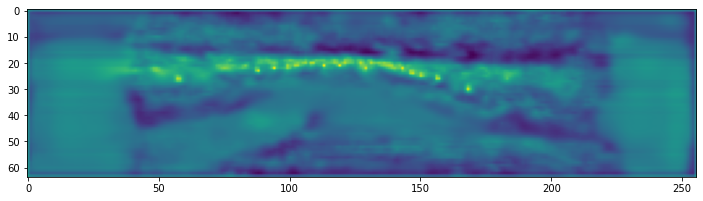

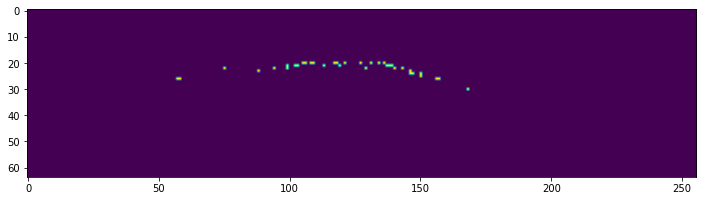











  3%|▎         | 17/506 [00:16<06:55,  1.18it/s]

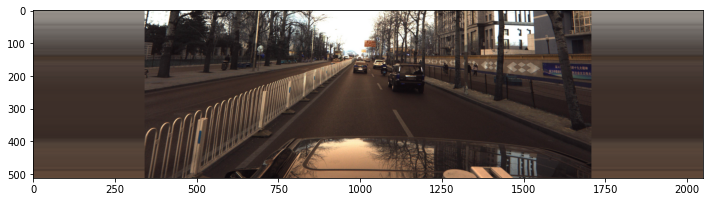

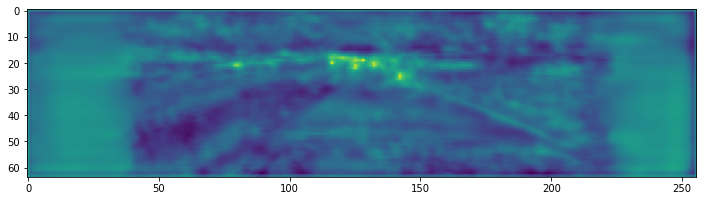

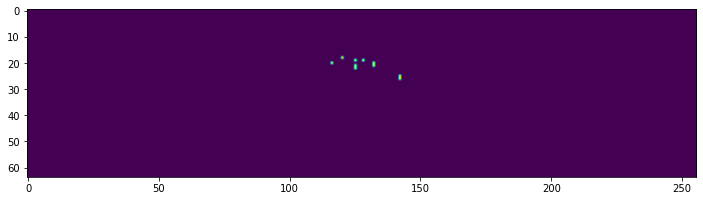











  4%|▎         | 18/506 [00:16<06:45,  1.20it/s]

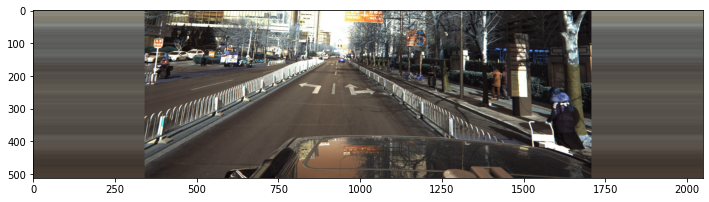

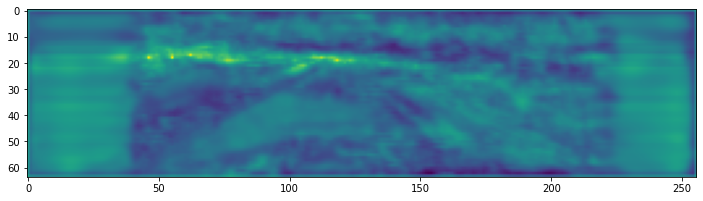

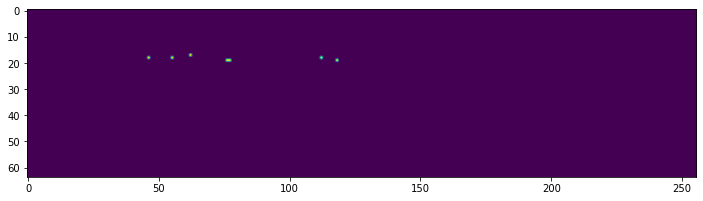











  4%|▍         | 19/506 [00:17<06:49,  1.19it/s]

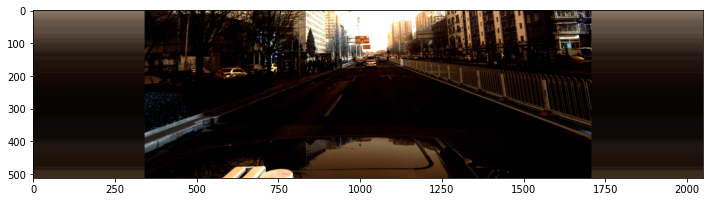

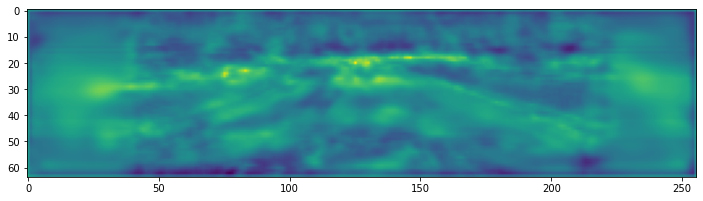

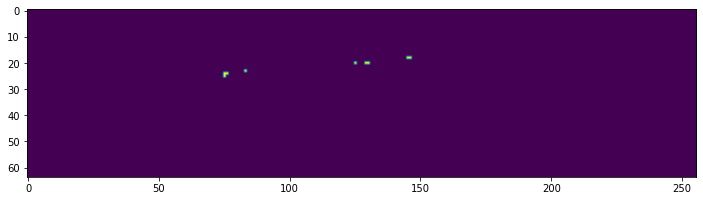











  4%|▍         | 20/506 [00:18<06:56,  1.17it/s]

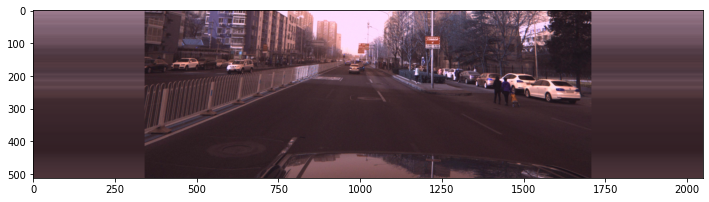

Process Process-418:
Process Process-419:
Traceback (most recent call last):
Traceback (most recent call last):
Process Process-420:
Traceback (most recent call last):
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **self._kwargs)
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **self._kwargs)
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/utils/data/dataloader.py", line 96, in _worker_loop
    r = index_queue.get(timeout=MANAGER_STATUS_CHECK_INTERVAL)
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/utils

KeyboardInterrupt: 

KeyboardInterrupt
Process Process-417:
Traceback (most recent call last):
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **self._kwargs)
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/utils/data/dataloader.py", line 106, in _worker_loop
    samples = collate_fn([dataset[i] for i in batch_indices])
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/utils/data/dataloader.py", line 106, in <listcomp>
    samples = collate_fn([dataset[i] for i in batch_indices])
  File "<ipython-input-27-91ff6bd3db59>", line 23, in __getitem__
    img = preprocess_image(img0)
  File "<ipython-input-25-232a9c14e8c1>", line 27, in preprocess_image
    bg = np.ones_like(img) * img.mean(1, keepdims=True).astype(img.dtype)
  File "/home/dohee

Error in callback <function flush_figures at 0x7fd920200510> (for post_execute):


KeyboardInterrupt: 

In [244]:
predictions = []

test_loader = DataLoader(dataset=test_dataset, batch_size=4, shuffle=False, num_workers=4)
model.eval()

for img, _, _ in tqdm(test_loader):
    
    plt.figure(figsize=(12, 8))
    plt.imshow(np.einsum('ijk->jki', img[0]))
    plt.show()
    
    with torch.no_grad():
        output = model(img.to(device))
    output = output[0]['hm']
    show_coords(output[0],threshold1, threshold2)
        

In [223]:
img[0].shape

torch.Size([3, 512, 2048])

In [216]:
predictions = []

test_loader = DataLoader(dataset=test_dataset, batch_size=4, shuffle=False, num_workers=4)

model.eval()

for img, _, _ in tqdm(test_loader):
    with torch.no_grad():
        output = model(img.to(device))
    output = output[0]['hm']
    for out in output:
        coords = extract_coords(out,threshold1, threshold2)
        s = coords2str(coords)
        predictions.append(s)
        
test = pd.read_csv(PATH + 'sample_submission.csv')
test['PredictionString'] = predictions
test.to_csv('predictions_DLA'+'_'+str(threshold1)+'.csv', index=False)
test.head()






  0%|          | 0/506 [00:00<?, ?it/s]

no points







  0%|          | 1/506 [00:01<15:51,  1.88s/it]




  0%|          | 2/506 [00:02<11:54,  1.42s/it]




  1%|          | 3/506 [00:02<09:34,  1.14s/it]




  1%|          | 4/506 [00:03<07:43,  1.08it/s]




  1%|          | 5/506 [00:03<07:01,  1.19it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/scipy/optimize/optimize.py:2664: RuntimeWarning: overflow encountered in long_scalars
  t -= delta*temp*temp





  1%|          | 6/506 [00:04<06:32,  1.27it/s]




  1%|▏         | 7/506 [00:05<06:08,  1.35it/s]




  2%|▏         | 8/506 [00:05<05:59,  1.38it/s]




  2%|▏         | 9/506 [00:06<05:28,  1.51it/s]




  2%|▏         | 10/506 [00:06<05:00,  1.65it/s]




  2%|▏         | 11/506 [00:07<04:40,  1.76it/s]




  2%|▏         | 12/506 [00:07<05:10,  1.59it/s]




  3%|▎         | 13/506 [00:08<04:56,  1.66it/s]




  3%|▎         | 14/506 [00:08<04:25,  1.85it/s]




  3%|▎         | 15/506 [00:09<04:19,  1.89it/s]




  3%|▎         | 16/506 [00:09<04:0

no points







  8%|▊         | 43/506 [00:23<03:59,  1.93it/s]




  9%|▊         | 44/506 [00:24<04:16,  1.80it/s]




  9%|▉         | 45/506 [00:24<04:05,  1.88it/s]




  9%|▉         | 46/506 [00:25<04:08,  1.85it/s]




  9%|▉         | 47/506 [00:25<03:47,  2.01it/s]




  9%|▉         | 48/506 [00:26<03:57,  1.93it/s]




 10%|▉         | 49/506 [00:26<04:09,  1.83it/s]




 10%|▉         | 50/506 [00:27<04:17,  1.77it/s]




 10%|█         | 51/506 [00:27<03:40,  2.07it/s]




 10%|█         | 52/506 [00:27<03:32,  2.14it/s]




 10%|█         | 53/506 [00:28<03:44,  2.02it/s]




 11%|█         | 54/506 [00:29<03:59,  1.89it/s]




 11%|█         | 55/506 [00:29<03:56,  1.91it/s]




 11%|█         | 56/506 [00:30<03:38,  2.06it/s]




 11%|█▏        | 57/506 [00:30<03:31,  2.12it/s]




 11%|█▏        | 58/506 [00:31<03:37,  2.06it/s]




 12%|█▏        | 59/506 [00:31<03:23,  2.19it/s]




 12%|█▏        | 60/506 [00:32<03:59,  1.86it/s]




 12%|█▏        | 61/506 [00:32<04:12,  1.

no points







 28%|██▊       | 144/506 [01:14<02:46,  2.17it/s]




 29%|██▊       | 145/506 [01:15<02:51,  2.10it/s]




 29%|██▉       | 146/506 [01:15<03:05,  1.94it/s]




 29%|██▉       | 147/506 [01:16<02:53,  2.07it/s]




 29%|██▉       | 148/506 [01:16<02:57,  2.02it/s]




 29%|██▉       | 149/506 [01:17<02:57,  2.01it/s]




 30%|██▉       | 150/506 [01:17<02:48,  2.11it/s]




 30%|██▉       | 151/506 [01:18<02:54,  2.03it/s]




 30%|███       | 152/506 [01:18<03:14,  1.82it/s]




 30%|███       | 153/506 [01:19<03:10,  1.85it/s]




 30%|███       | 154/506 [01:19<03:08,  1.87it/s]




 31%|███       | 155/506 [01:20<02:52,  2.04it/s]




 31%|███       | 156/506 [01:20<02:59,  1.95it/s]




 31%|███       | 157/506 [01:21<03:11,  1.82it/s]




 31%|███       | 158/506 [01:22<03:04,  1.89it/s]




 31%|███▏      | 159/506 [01:22<03:15,  1.77it/s]




 32%|███▏      | 160/506 [01:23<02:58,  1.94it/s]




 32%|███▏      | 161/506 [01:23<02:41,  2.13it/s]




 32%|███▏      | 162/50

no points







 33%|███▎      | 169/506 [01:26<02:25,  2.31it/s]




 34%|███▎      | 170/506 [01:27<02:27,  2.27it/s]




 34%|███▍      | 171/506 [01:27<02:20,  2.38it/s]




 34%|███▍      | 172/506 [01:28<02:40,  2.08it/s]




 34%|███▍      | 173/506 [01:28<02:34,  2.16it/s]




 34%|███▍      | 174/506 [01:29<02:37,  2.10it/s]




 35%|███▍      | 175/506 [01:29<02:40,  2.06it/s]




 35%|███▍      | 176/506 [01:30<02:52,  1.92it/s]




 35%|███▍      | 177/506 [01:30<02:55,  1.88it/s]




 35%|███▌      | 178/506 [01:31<03:03,  1.79it/s]




 35%|███▌      | 179/506 [01:31<02:41,  2.02it/s]




 36%|███▌      | 180/506 [01:32<02:38,  2.05it/s]




 36%|███▌      | 181/506 [01:33<02:59,  1.81it/s]




 36%|███▌      | 182/506 [01:33<03:19,  1.62it/s]




 36%|███▌      | 183/506 [01:34<02:55,  1.84it/s]




 36%|███▋      | 184/506 [01:34<02:42,  1.98it/s]




 37%|███▋      | 185/506 [01:34<02:29,  2.15it/s]




 37%|███▋      | 186/506 [01:35<02:13,  2.40it/s]




 37%|███▋      | 187/50

no points







 46%|████▌     | 231/506 [01:58<01:59,  2.31it/s]




 46%|████▌     | 232/506 [01:59<02:13,  2.05it/s]




 46%|████▌     | 233/506 [01:59<02:18,  1.97it/s]




 46%|████▌     | 234/506 [01:59<02:08,  2.12it/s]




 46%|████▋     | 235/506 [02:00<02:17,  1.97it/s]




 47%|████▋     | 236/506 [02:01<02:10,  2.07it/s]




 47%|████▋     | 237/506 [02:01<02:17,  1.96it/s]




 47%|████▋     | 238/506 [02:02<02:18,  1.94it/s]




 47%|████▋     | 239/506 [02:02<02:19,  1.92it/s]




 47%|████▋     | 240/506 [02:02<02:04,  2.14it/s]




 48%|████▊     | 241/506 [02:03<02:09,  2.05it/s]




 48%|████▊     | 242/506 [02:04<02:24,  1.83it/s]




 48%|████▊     | 243/506 [02:04<02:24,  1.82it/s]




 48%|████▊     | 244/506 [02:05<02:10,  2.01it/s]




 48%|████▊     | 245/506 [02:05<02:11,  1.98it/s]




 49%|████▊     | 246/506 [02:06<02:15,  1.91it/s]




 49%|████▉     | 247/506 [02:06<02:24,  1.80it/s]




 49%|████▉     | 248/506 [02:07<02:06,  2.04it/s]




 49%|████▉     | 249/50

no points







 52%|█████▏    | 265/506 [02:15<01:50,  2.19it/s]




 53%|█████▎    | 266/506 [02:16<01:57,  2.05it/s]




 53%|█████▎    | 267/506 [02:16<01:58,  2.02it/s]




 53%|█████▎    | 268/506 [02:17<02:05,  1.89it/s]




 53%|█████▎    | 269/506 [02:17<02:08,  1.84it/s]




 53%|█████▎    | 270/506 [02:18<02:05,  1.88it/s]




 54%|█████▎    | 271/506 [02:18<01:56,  2.02it/s]




 54%|█████▍    | 272/506 [02:19<01:54,  2.04it/s]




 54%|█████▍    | 273/506 [02:19<01:45,  2.21it/s]




 54%|█████▍    | 274/506 [02:20<02:02,  1.89it/s]




 54%|█████▍    | 275/506 [02:20<01:50,  2.09it/s]




 55%|█████▍    | 276/506 [02:20<01:34,  2.44it/s]




 55%|█████▍    | 277/506 [02:21<01:52,  2.04it/s]




 55%|█████▍    | 278/506 [02:22<01:52,  2.03it/s]




 55%|█████▌    | 279/506 [02:22<01:44,  2.18it/s]




 55%|█████▌    | 280/506 [02:23<01:52,  2.01it/s]




 56%|█████▌    | 281/506 [02:23<01:50,  2.03it/s]




 56%|█████▌    | 282/506 [02:24<01:56,  1.93it/s]




 56%|█████▌    | 283/50

no points







 61%|██████    | 308/506 [02:36<01:41,  1.95it/s]




 61%|██████    | 309/506 [02:37<01:31,  2.14it/s]




 61%|██████▏   | 310/506 [02:37<01:24,  2.31it/s]




 61%|██████▏   | 311/506 [02:37<01:26,  2.26it/s]




 62%|██████▏   | 312/506 [02:38<01:28,  2.20it/s]




 62%|██████▏   | 313/506 [02:38<01:33,  2.06it/s]




 62%|██████▏   | 314/506 [02:39<01:36,  2.00it/s]




 62%|██████▏   | 315/506 [02:39<01:37,  1.96it/s]




 62%|██████▏   | 316/506 [02:40<01:34,  2.00it/s]




 63%|██████▎   | 317/506 [02:40<01:25,  2.21it/s]




 63%|██████▎   | 318/506 [02:41<01:24,  2.23it/s]




 63%|██████▎   | 319/506 [02:41<01:20,  2.33it/s]




 63%|██████▎   | 320/506 [02:42<01:34,  1.97it/s]




 63%|██████▎   | 321/506 [02:42<01:40,  1.84it/s]




 64%|██████▎   | 322/506 [02:43<01:50,  1.67it/s]




 64%|██████▍   | 323/506 [02:44<01:36,  1.90it/s]




 64%|██████▍   | 324/506 [02:44<01:31,  1.99it/s]




 64%|██████▍   | 325/506 [02:45<01:36,  1.87it/s]




 64%|██████▍   | 326/50

no points







 66%|██████▌   | 335/506 [02:50<01:25,  2.01it/s]




 66%|██████▋   | 336/506 [02:51<01:37,  1.74it/s]




 67%|██████▋   | 337/506 [02:51<01:29,  1.89it/s]




 67%|██████▋   | 338/506 [02:52<01:22,  2.05it/s]




 67%|██████▋   | 339/506 [02:52<01:39,  1.68it/s]




 67%|██████▋   | 340/506 [02:53<01:35,  1.75it/s]




 67%|██████▋   | 341/506 [02:53<01:24,  1.94it/s]




 68%|██████▊   | 342/506 [02:54<01:32,  1.78it/s]




 68%|██████▊   | 343/506 [02:54<01:28,  1.83it/s]




 68%|██████▊   | 344/506 [02:55<01:38,  1.64it/s]




 68%|██████▊   | 345/506 [02:56<01:37,  1.65it/s]




 68%|██████▊   | 346/506 [02:56<01:22,  1.93it/s]

no points







 69%|██████▊   | 347/506 [02:57<01:24,  1.89it/s]




 69%|██████▉   | 348/506 [02:57<01:23,  1.90it/s]




 69%|██████▉   | 349/506 [02:58<01:22,  1.89it/s]




 69%|██████▉   | 350/506 [02:58<01:18,  1.99it/s]




 69%|██████▉   | 351/506 [02:59<01:30,  1.72it/s]




 70%|██████▉   | 352/506 [02:59<01:19,  1.93it/s]




 70%|██████▉   | 353/506 [03:00<01:16,  2.01it/s]




 70%|██████▉   | 354/506 [03:00<01:13,  2.07it/s]

no points







 70%|███████   | 355/506 [03:01<01:19,  1.89it/s]




 70%|███████   | 356/506 [03:01<01:12,  2.07it/s]




 71%|███████   | 357/506 [03:02<01:10,  2.10it/s]




 71%|███████   | 358/506 [03:02<01:13,  2.03it/s]




 71%|███████   | 359/506 [03:03<01:19,  1.86it/s]




 71%|███████   | 360/506 [03:03<01:17,  1.88it/s]




 71%|███████▏  | 361/506 [03:04<01:21,  1.79it/s]




 72%|███████▏  | 362/506 [03:04<01:17,  1.87it/s]




 72%|███████▏  | 363/506 [03:05<01:22,  1.74it/s]




 72%|███████▏  | 364/506 [03:05<01:11,  1.98it/s]




 72%|███████▏  | 365/506 [03:06<01:11,  1.97it/s]




 72%|███████▏  | 366/506 [03:07<01:19,  1.75it/s]




 73%|███████▎  | 367/506 [03:07<01:12,  1.93it/s]




 73%|███████▎  | 368/506 [03:07<01:02,  2.19it/s]




 73%|███████▎  | 369/506 [03:08<01:07,  2.04it/s]




 73%|███████▎  | 370/506 [03:09<01:08,  1.99it/s]




 73%|███████▎  | 371/506 [03:09<01:14,  1.81it/s]

no points







 74%|███████▎  | 372/506 [03:10<01:08,  1.95it/s]




 74%|███████▎  | 373/506 [03:10<01:06,  2.00it/s]




 74%|███████▍  | 374/506 [03:10<01:02,  2.13it/s]




 74%|███████▍  | 375/506 [03:11<00:58,  2.25it/s]




 74%|███████▍  | 376/506 [03:11<01:01,  2.11it/s]




 75%|███████▍  | 377/506 [03:12<01:05,  1.98it/s]




 75%|███████▍  | 378/506 [03:13<01:14,  1.72it/s]




 75%|███████▍  | 379/506 [03:13<01:07,  1.87it/s]




 75%|███████▌  | 380/506 [03:14<01:07,  1.88it/s]




 75%|███████▌  | 381/506 [03:14<00:58,  2.13it/s]




 75%|███████▌  | 382/506 [03:15<01:08,  1.81it/s]




 76%|███████▌  | 383/506 [03:15<01:04,  1.90it/s]




 76%|███████▌  | 384/506 [03:16<01:08,  1.78it/s]




 76%|███████▌  | 385/506 [03:16<01:03,  1.91it/s]




 76%|███████▋  | 386/506 [03:17<00:58,  2.06it/s]




 76%|███████▋  | 387/506 [03:17<00:58,  2.04it/s]




 77%|███████▋  | 388/506 [03:18<00:57,  2.07it/s]




 77%|███████▋  | 389/506 [03:18<00:52,  2.24it/s]




 77%|███████▋  | 390/50

no points







 78%|███████▊  | 393/506 [03:20<00:53,  2.12it/s]




 78%|███████▊  | 394/506 [03:21<00:54,  2.05it/s]




 78%|███████▊  | 395/506 [03:21<00:55,  2.00it/s]




 78%|███████▊  | 396/506 [03:22<00:57,  1.92it/s]




 78%|███████▊  | 397/506 [03:22<01:01,  1.78it/s]




 79%|███████▊  | 398/506 [03:23<01:02,  1.74it/s]




 79%|███████▉  | 399/506 [03:23<00:58,  1.84it/s]




 79%|███████▉  | 400/506 [03:24<01:02,  1.71it/s]




 79%|███████▉  | 401/506 [03:25<00:55,  1.89it/s]




 79%|███████▉  | 402/506 [03:25<00:54,  1.92it/s]




 80%|███████▉  | 403/506 [03:26<00:57,  1.79it/s]




 80%|███████▉  | 404/506 [03:26<00:51,  2.00it/s]




 80%|████████  | 405/506 [03:27<00:52,  1.93it/s]




 80%|████████  | 406/506 [03:27<00:52,  1.90it/s]




 80%|████████  | 407/506 [03:28<00:52,  1.88it/s]




 81%|████████  | 408/506 [03:28<00:55,  1.77it/s]




 81%|████████  | 409/506 [03:29<00:50,  1.92it/s]




 81%|████████  | 410/506 [03:29<00:48,  1.96it/s]




 81%|████████  | 411/50

no points







 84%|████████▎ | 423/506 [03:36<00:47,  1.76it/s]




 84%|████████▍ | 424/506 [03:37<00:41,  1.97it/s]




 84%|████████▍ | 425/506 [03:37<00:44,  1.82it/s]




 84%|████████▍ | 426/506 [03:38<00:44,  1.79it/s]




 84%|████████▍ | 427/506 [03:39<00:43,  1.83it/s]




 85%|████████▍ | 428/506 [03:39<00:42,  1.85it/s]




 85%|████████▍ | 429/506 [03:40<00:38,  2.01it/s]




 85%|████████▍ | 430/506 [03:40<00:38,  1.97it/s]




 85%|████████▌ | 431/506 [03:41<00:37,  2.02it/s]




 85%|████████▌ | 432/506 [03:41<00:39,  1.86it/s]




 86%|████████▌ | 433/506 [03:42<00:40,  1.82it/s]




 86%|████████▌ | 434/506 [03:42<00:41,  1.72it/s]




 86%|████████▌ | 435/506 [03:43<00:41,  1.71it/s]




 86%|████████▌ | 436/506 [03:43<00:38,  1.84it/s]




 86%|████████▋ | 437/506 [03:44<00:33,  2.03it/s]




 87%|████████▋ | 438/506 [03:44<00:35,  1.91it/s]




 87%|████████▋ | 439/506 [03:45<00:35,  1.90it/s]




 87%|████████▋ | 440/506 [03:45<00:34,  1.94it/s]




 87%|████████▋ | 441/50

no points







 89%|████████▉ | 451/506 [03:51<00:26,  2.04it/s]




 89%|████████▉ | 452/506 [03:52<00:28,  1.89it/s]




 90%|████████▉ | 453/506 [03:52<00:27,  1.96it/s]




 90%|████████▉ | 454/506 [03:53<00:27,  1.90it/s]




 90%|████████▉ | 455/506 [03:53<00:25,  1.98it/s]




 90%|█████████ | 456/506 [03:54<00:29,  1.69it/s]




 90%|█████████ | 457/506 [03:54<00:26,  1.83it/s]




 91%|█████████ | 458/506 [03:55<00:25,  1.88it/s]




 91%|█████████ | 459/506 [03:56<00:27,  1.71it/s]




 91%|█████████ | 460/506 [03:56<00:27,  1.65it/s]




 91%|█████████ | 461/506 [03:57<00:26,  1.70it/s]




 91%|█████████▏| 462/506 [03:57<00:24,  1.76it/s]




 92%|█████████▏| 463/506 [03:58<00:22,  1.88it/s]

no points







 92%|█████████▏| 464/506 [03:58<00:20,  2.09it/s]




 92%|█████████▏| 465/506 [03:59<00:18,  2.22it/s]

no points







 92%|█████████▏| 466/506 [03:59<00:15,  2.64it/s]

no points







 92%|█████████▏| 467/506 [03:59<00:15,  2.47it/s]




 92%|█████████▏| 468/506 [04:00<00:16,  2.27it/s]




 93%|█████████▎| 469/506 [04:00<00:17,  2.18it/s]




 93%|█████████▎| 470/506 [04:01<00:18,  1.94it/s]




 93%|█████████▎| 471/506 [04:01<00:16,  2.12it/s]




 93%|█████████▎| 472/506 [04:02<00:16,  2.03it/s]




 93%|█████████▎| 473/506 [04:02<00:17,  1.89it/s]




 94%|█████████▎| 474/506 [04:03<00:17,  1.80it/s]




 94%|█████████▍| 475/506 [04:04<00:17,  1.82it/s]




 94%|█████████▍| 476/506 [04:04<00:17,  1.73it/s]




 94%|█████████▍| 477/506 [04:05<00:15,  1.88it/s]




 94%|█████████▍| 478/506 [04:05<00:14,  1.91it/s]




 95%|█████████▍| 479/506 [04:06<00:13,  1.97it/s]




 95%|█████████▍| 480/506 [04:06<00:12,  2.14it/s]




 95%|█████████▌| 481/506 [04:07<00:14,  1.76it/s]




 95%|█████████▌| 482/506 [04:07<00:12,  1.87it/s]




 95%|█████████▌| 483/506 [04:08<00:11,  2.07it/s]




 96%|█████████▌| 484/506 [04:08<00:11,  1.98it/s]




 96%|█████████▌| 485/50

,ImageId,PredictionString
0,ID_18fb86d04,
1,ID_ce06d4dc1,0.26231265 0.42750785250130025 -3.024127157526...
2,ID_afe07078f,0.170501 2.3229644291633122 -3.100122602778025...
3,ID_37caf75aa,0.14003658 -0.034025724480637135 -3.0889932235...
4,ID_7655363ca,-0.16046357 -2.9141504720022424 2.864102991419...


In [206]:
output.shape

torch.Size([4, 8, 64, 256])

In [200]:
prediction = out

logits = prediction[0] #peak(prediction[0], threshold1, threshold2)#prediction[0]#peak(prediction[0], threshold1, threshold2)##peak(prediction[0], threshold1, threshold2)
regr_output = prediction[1:]
points = np.argwhere(logits > threshold1)
col_names = sorted(['x', 'y', 'z', 'yaw', 'pitch_sin', 'pitch_cos', 'roll'])
coords = []
for r,c in zip(points.numpy()[0,:], points.numpy()[1,:]):
    regr_dict = dict(zip(col_names, regr_output[:, r, c]))
    for val in regr_dict:
        #if type(regr_dict[val])==torch.Tensor:
        regr_dict[val] = np.float32(regr_dict[val])

    coords.append(_regr_back(regr_dict))
    coords[-1]['confidence'] = np.float32(1 / (1 + np.exp(-logits[r, c])))
    #coords[-1]['x'], coords[-1]['y'], coords[-1]['z'] = optimize_xy(r, c, np.float(coords[-1]['x'].cpu().numpy()), np.float(coords[-1]['x'].cpu().numpy()), np.float(coords[-1]['z'].cpu().numpy()))
    coords[-1]['x'], coords[-1]['y'], coords[-1]['z'] = optimize_xy(r, c, coords[-1]['x'], coords[-1]['y'], coords[-1]['z'])
coords = clear_duplicates(coords)


IndexError: too many indices for array

In [ ]:
def extract_coords(prediction, threshold1, threshold2):
    logits = prediction[0] #peak(prediction[0], threshold1, threshold2)#prediction[0]#peak(prediction[0], threshold1, threshold2)##peak(prediction[0], threshold1, threshold2)
    regr_output = prediction[1:]
    points = np.argwhere(logits > threshold1)
    col_names = sorted(['x', 'y', 'z', 'yaw', 'pitch_sin', 'pitch_cos', 'roll'])
    coords = []
    for r,c in zip(points.numpy()[0,:], points.numpy()[1,:]):
        regr_dict = dict(zip(col_names, regr_output[:, r, c]))
        for val in regr_dict:
            #if type(regr_dict[val])==torch.Tensor:
            regr_dict[val] = np.float32(regr_dict[val])
                             
        coords.append(_regr_back(regr_dict))
        coords[-1]['confidence'] = np.float32(1 / (1 + np.exp(-logits[r, c])))
        #coords[-1]['x'], coords[-1]['y'], coords[-1]['z'] = optimize_xy(r, c, np.float(coords[-1]['x'].cpu().numpy()), np.float(coords[-1]['x'].cpu().numpy()), np.float(coords[-1]['z'].cpu().numpy()))
        coords[-1]['x'], coords[-1]['y'], coords[-1]['z'] = optimize_xy(r, c, coords[-1]['x'], coords[-1]['y'], coords[-1]['z'])
    coords = clear_duplicates(coords)
    return coords

In [161]:
extract_coords(out, threshold1, threshold2)

IndexError: too many indices for array

In [162]:
out.shape

torch.Size([8, 64, 256])

In [166]:
a1 = out

tensor([[[-10.2716, -14.3557, -14.4339,  ..., -15.9825, -16.2767, -11.7820],
         [-14.1695, -19.1850, -18.9481,  ..., -22.1662, -22.5154, -15.7999],
         [-14.1037, -19.0013, -17.8212,  ..., -20.9393, -21.6246, -15.7393],
         ...,
         [-12.4725, -17.1064, -17.1626,  ..., -22.1951, -24.1493, -17.3180],
         [-13.4259, -18.8040, -18.7319,  ..., -24.8145, -25.8071, -18.3174],
         [-10.3985, -14.4373, -14.6211,  ..., -18.9596, -19.3319, -13.8174]],

        [[  0.1002,   0.7874,   0.9885,  ...,   1.3809,   1.4336,   0.2803],
         [  1.1890,   2.2186,   2.3615,  ...,   3.1568,   3.1987,   1.4289],
         [  1.1008,   2.1831,   1.9658,  ...,   2.7910,   2.9181,   1.3803],
         ...,
         [  0.6693,   1.6066,   1.7337,  ...,   3.0632,   3.5535,   1.7546],
         [  0.8731,   2.0420,   2.0139,  ...,   3.6050,   3.9382,   1.9576],
         [  0.1216,   1.1050,   1.1194,  ...,   2.2786,   2.3463,   0.9408]],

        [[  0.4183,   1.4859,   1.4433,  ...

In [174]:
a2 = out

In [177]:
a1 = out 

In [179]:
a1.shape

torch.Size([8, 64, 256])

In [180]:
a2.shape

torch.Size([8, 64, 256])

In [185]:
extract_coords(a2,threshold1, threshold2)

IndexError: too many indices for array

In [ ]:
threshold1 = 1

In [ ]:
predictions = []

test_loader = DataLoader(dataset=test_dataset, batch_size=4, shuffle=False, num_workers=4)

model.eval()

for img, _, _ in tqdm(test_loader):
    with torch.no_grad():
        output = model(img.to(device))
    output = output.data.cpu().numpy()
    for out in output:
        coords = extract_coords(out,threshold1, threshold2)
        s = coords2str(coords)
        predictions.append(s)
        
test = pd.read_csv(PATH + 'sample_submission.csv')
test['PredictionString'] = predictions
test.to_csv('predictions'+'_'+str(threshold1)+'.csv', index=False)
test.head()